# Player Statistics Analysis - Predicting Players Market Value - XGBoost

## Agenda:
0. Problem Formulation
1. Loading the Raw Data from Kaggle
2. Pulling the Market Value | Web Scrapping
3. Cleaning & Joining Market Value
4. Data Pre-processing
5. Running XGBoost
6. Hyperparameter Tuning
7. Storing Our Model & Results
8. Streamlit App Development

## ML Process

# 0. Problem Formulation
- We want to understand which variables increase the market value per player
- We want to be able to make predictions on the market value per player
- We want to identify over/under performing players based on their market value

## 1.Loading the Raw Data

In [6]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
import pickle
import plotly.express as px
import streamlit as st
# pip install requests beautifulsoup4 pandas
# pip install xgboost

# loading excel
player_raw = pd.read_csv("Player_Stats.csv", encoding="latin1")
# Source: https://www.kaggle.com/datasets/vivovinco/20222023-football-player-stats

# to see your directory: os.getcwd()
pd.set_option('display.max_rows', None) # display all rows
pd.set_option('display.max_columns', None) # display all columns

player_raw.head()

,Rk,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals,Shots,SoT,SoT%,G/Sh,G/SoT,ShoDist,ShoFK,ShoPK,PKatt,PasTotCmp,PasTotAtt,PasTotCmp%,PasTotDist,PasTotPrgDist,PasShoCmp,PasShoAtt,PasShoCmp%,PasMedCmp,PasMedAtt,PasMedCmp%,PasLonCmp,PasLonAtt,PasLonCmp%,Assists,PasAss,Pas3rd,PPA,CrsPA,PasProg,PasAtt,PasLive,PasDead,PasFK,TB,Sw,PasCrs,TI,CK,CkIn,CkOut,CkStr,PasCmp,PasOff,PasBlocks,SCA,ScaPassLive,ScaPassDead,ScaDrib,ScaSh,ScaFld,ScaDef,GCA,GcaPassLive,GcaPassDead,GcaDrib,GcaSh,GcaFld,GcaDef,Tkl,TklWon,TklDef3rd,TklMid3rd,TklAtt3rd,TklDri,TklDriAtt,TklDri%,TklDriPast,Blocks,BlkSh,BlkPass,Int,Tkl+Int,Clr,Err,Touches,TouDefPen,TouDef3rd,TouMid3rd,TouAtt3rd,TouAttPen,TouLive,ToAtt,ToSuc,ToSuc%,ToTkl,ToTkl%,Carries,CarTotDist,CarPrgDist,CarProg,Car3rd,CPA,CarMis,CarDis,Rec,RecProg,CrdY,CrdR,2CrdY,Fls,Fld,Off,Crs,TklW,PKwon,PKcon,OG,Recov,AerWon,AerLost,AerWon%
0,1,Brenden Aaronson,USA,MFFW,Leeds United,Premier League,22,2000,20,19,1596,17.7,1,1.53,0.28,18.5,0.04,0.20,19.0,0.11,0.0,0.0,23.2,31.0,74.9,293.0,85.7,13.3,16.2,81.9,5.93,7.74,76.6,0.90,2.37,38.1,0.11,1.75,1.75,0.45,0.11,3.22,31.0,28.1,2.88,0.96,0.17,0.00,2.54,0.23,1.47,0.68,0.62,0.06,23.2,0.00,0.85,3.62,2.37,0.56,0.23,0.11,0.28,0.06,0.28,0.17,0.0,0.0,0.06,0.0,0.06,1.64,0.51,0.45,0.90,0.28,0.51,1.47,34.6,0.96,1.69,0.11,1.58,0.06,1.69,0.28,0.06,44.0,0.40,4.35,19.0,21.50,2.49,44.0,3.73,1.19,31.8,1.75,47.0,26.7,136.1,56.6,1.53,1.07,0.40,2.60,3.11,30.2,5.65,0.11,0.0,0.0,0.62,2.26,0.17,2.54,0.51,0.0,0.0,0.00,4.86,0.34,1.19,22.2
1,2,Yunis Abdelhamid,MAR,DF,Reims,Ligue 1,35,1987,22,22,1980,22.0,0,0.86,0.05,5.3,0.00,0.00,13.5,0.00,0.0,0.0,38.5,47.2,81.5,751.5,318.5,10.9,12.9,84.5,23.20,25.70,90.1,3.77,7.00,53.9,0.05,0.27,2.91,0.09,0.00,4.50,47.2,43.3,3.73,3.32,0.00,0.55,0.18,0.09,0.00,0.00,0.00,0.00,38.5,0.23,0.59,1.14,0.86,0.00,0.00,0.18,0.00,0.09,0.18,0.14,0.0,0.0,0.05,0.0,0.00,2.50,1.59,1.45,1.00,0.05,1.32,1.68,78.4,0.36,2.23,0.77,1.45,2.00,4.50,2.91,0.05,59.2,6.23,27.50,29.5,2.73,1.09,59.2,0.68,0.32,46.7,0.36,53.3,40.0,234.2,125.0,0.55,0.23,0.09,0.73,0.68,34.5,0.23,0.09,0.0,0.0,1.32,0.50,0.05,0.18,1.59,0.0,0.0,0.00,6.64,2.18,1.23,64.0
2,3,Himad Abdelli,FRA,MFFW,Angers,Ligue 1,23,1999,14,8,770,8.6,0,1.05,0.35,33.3,0.00,0.00,19.2,0.00,0.0,0.0,40.0,49.5,80.8,676.0,188.1,18.5,22.0,84.1,15.50,18.70,82.6,4.42,5.93,74.5,0.00,1.51,3.95,1.74,0.35,6.40,49.5,48.1,1.16,0.35,0.12,0.23,1.05,0.81,0.00,0.00,0.00,0.00,40.0,0.23,1.16,2.67,2.44,0.00,0.00,0.12,0.00,0.12,0.00,0.00,0.0,0.0,0.00,0.0,0.00,2.91,1.40,1.28,1.40,0.23,1.63,2.67,60.9,1.05,1.51,0.12,1.40,0.93,3.84,0.93,0.00,62.6,0.93,11.40,36.0,17.40,1.16,62.6,3.84,2.09,54.5,1.51,39.4,48.5,298.5,151.0,2.56,2.56,0.47,2.09,1.05,43.4,5.93,0.12,0.0,0.0,1.74,1.28,0.00,1.05,1.40,0.0,0.0,0.00,8.14,0.93,1.05,47.1
3,4,Salis Abdul Samed,GHA,MF,Lens,Ligue 1,22,2000,20,20,1799,20.0,1,0.60,0.15,25.0,0.08,0.33,20.3,0.00,0.0,0.0,59.5,64.9,91.6,946.3,226.9,29.6,31.8,93.2,24.70,26.20,94.3,3.35,4.30,77.9,0.00,0.50,6.00,0.55,0.10,5.60,64.9,63.1,1.40,1.30,0.05,0.20,0.35,0.10,0.00,0.00,0.00,0.00,59.5,0.35,0.40,1.60,1.35,0.00,0.10,0.10,0.00,0.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,1.50,0.80,0.55,0.85,0.10,0.85,1.30,65.4,0.45,1.30,0.35,0.95,1.10,2.60,0.80,0.00,73.3,2.10,12.00,49.6,12.20,0.70,73.3,1.25,0.70,56.0,0.40,32.0,61.0,316.9,117.5,1.25,1.95,0.15,1.35,1.30,56.5,1.70,0.15,0.0,0.0,2.45,1.35,0.00,0.35,0.80,0.0,0.0,0.05,6.60,0.50,0.50,50.0
4,5,Laurent Abergel,FRA,MF,Lorient,Ligue 1,30,1993,15,15,1165,12.9,0,0.31,0.00,0.0,0.00,0.00,23.9,0.00,0.0,0.0,37.9,43.4,87.3,613.6,224.7,17.9,19.4,92.4,15.70,17.80,88.6,2.64,3.95,66.7,0.08,0.62,3.88,0.39,0.00,5.04,43.4,42.6,0.78,0.78,0.39,0.16,0.23,0.00,0.00,0.00,0.00,0.00,37.9,0.08,0.31,1.24,1.01,0.08,0.00,0.08,0.00,0.08,0.08,0.08,0.0,0.0,0.00,0.0,0.00,3.80,2.02,2.64,1.16,0.00,1.32,3.26,40.5,1.94,1.40,0.23,1.16,1.16,4.96,1.55,0.00,54.7,3.26,19.20,31.4,4.88,0.23,54.7,0.93,0.54,58.3,0.31,33.3,41.0,174.3,72.7,0.47,0.93,0.00,1.32,0.78,36.4,0.47,0.16,0.0,0.0,0.93,1.01,0.00,0.23,2.02,0.0,0.0,0.00,6.51,0.31,0.39,44.4


## 2. Pulling the Market Value

In [8]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import time

# Your list of player names
# player_list = ["Brenden Aaronson", "Yunis Abdelhamid", "Himad Abdelli"]
player_list = player_raw['Player'].unique()
# player_list = ['Yunis Abdelhamid']

# Base URL for player search
base_url = "https://www.transfermarkt.com/schnellsuche/ergebnis/schnellsuche?query="

# DataFrame to store results
results = []

# Total number of players
total_players = len(player_list)

# Iterate through the player list with a counter
for i, player in enumerate(player_list, start=1):
    # Format the player name for the URL
    search_url = base_url + player.replace(" ", "+")
    print(f"Processing player {i}/{total_players}: {player}")

    try:
        # Fetch the page
        response = requests.get(search_url, headers={"User-Agent": "Mozilla/5.0"})
        response.raise_for_status()
        soup = BeautifulSoup(response.text, "html.parser")

        # Extract the market value
        market_value_tag = soup.find("td", class_="rechts hauptlink")  # Target the specific class
        if market_value_tag:
            market_value = market_value_tag.text.strip()
        else:
            market_value = "Not Found"

        # Append the result
        results.append({"Player": player, "Market Value": market_value})
    except Exception as e:
        results.append({"Player": player, "Market Value": "Error: " + str(e)})

    # Pause to avoid being blocked by the website
    time.sleep(2)

# Convert results to DataFrame
df_results = pd.DataFrame(results)

# Display or save the DataFrame
print(df_results)
df_results.to_csv("player_market_values.csv", index=False)

# Website: https://www.transfermarkt.com/

Processing player 1/2530: Brenden Aaronson
Processing player 2/2530: Yunis Abdelhamid
Processing player 3/2530: Himad Abdelli
Processing player 4/2530: Salis Abdul Samed
Processing player 5/2530: Laurent Abergel
Processing player 6/2530: Oliver Abildgaard
Processing player 7/2530: Matthis Abline
Processing player 8/2530: Abner
Processing player 9/2530: Zakaria Aboukhlal
Processing player 10/2530: Tammy Abraham
Processing player 11/2530: Francesco Acerbi
Processing player 12/2530: Mohamed Achi
Processing player 13/2530: Marcos Acuña
Processing player 14/2530: Che Adams
Processing player 15/2530: Tyler Adams
Processing player 16/2530: Sargis Adamyan
Processing player 17/2530: Tosin Adarabioyo
Processing player 18/2530: Martin Adeline
Processing player 19/2530: Karim Adeyemi
Processing player 20/2530: Amine Adli
Processing player 21/2530: Yacine Adli
Processing player 22/2530: Michel Aebischer
Processing player 23/2530: Felix Afena-Gyan
Processing player 24/2530: Emmanuel Agbadou
Processi

## 3. Cleaning & Joining Market Value

In [10]:
# Loading the data back in
df_results_2 = pd.read_csv("player_market_values.csv")

# Removing the data that we could not pull Market Value
df_results_2 = df_results_2[df_results_2['Market Value'] != 'Not Found']
df_results_2 = df_results_2[df_results_2['Market Value'] != '-']

# Converting the Ks and Ms to actual Numbers

# Conversion function
def convert_market_value(value):
    value = value.replace("€", "").replace(",", "").strip()  # Remove currency symbol and commas
    if "m" in value:
        return float(value.replace("m", "")) * 1_000_000  # Convert millions to numeric
    elif "k" in value:
        return float(value.replace("k", "")) * 1_000  # Convert thousands to numeric
    else:
        return float(value)  # Return the number as-is if no unit

# Apply the conversion
df_results_2["Market Value Euros"] = df_results_2["Market Value"].apply(convert_market_value)

# Joining the Market Value to the Main DF
print(player_raw.shape)
player_raw = player_raw.merge(df_results_2, how = 'left', on = 'Player')
print(player_raw.shape)

# filtering out players that we don't have market value
player_raw = player_raw[~player_raw['Market Value Euros'].isna()]
print(player_raw.shape)
player_raw.head()

(2689, 124)
(2689, 126)
(2479, 126)


,Rk,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals,Shots,SoT,SoT%,G/Sh,G/SoT,ShoDist,ShoFK,ShoPK,PKatt,PasTotCmp,PasTotAtt,PasTotCmp%,PasTotDist,PasTotPrgDist,PasShoCmp,PasShoAtt,PasShoCmp%,PasMedCmp,PasMedAtt,PasMedCmp%,PasLonCmp,PasLonAtt,PasLonCmp%,Assists,PasAss,Pas3rd,PPA,CrsPA,PasProg,PasAtt,PasLive,PasDead,PasFK,TB,Sw,PasCrs,TI,CK,CkIn,CkOut,CkStr,PasCmp,PasOff,PasBlocks,SCA,ScaPassLive,ScaPassDead,ScaDrib,ScaSh,ScaFld,ScaDef,GCA,GcaPassLive,GcaPassDead,GcaDrib,GcaSh,GcaFld,GcaDef,Tkl,TklWon,TklDef3rd,TklMid3rd,TklAtt3rd,TklDri,TklDriAtt,TklDri%,TklDriPast,Blocks,BlkSh,BlkPass,Int,Tkl+Int,Clr,Err,Touches,TouDefPen,TouDef3rd,TouMid3rd,TouAtt3rd,TouAttPen,TouLive,ToAtt,ToSuc,ToSuc%,ToTkl,ToTkl%,Carries,CarTotDist,CarPrgDist,CarProg,Car3rd,CPA,CarMis,CarDis,Rec,RecProg,CrdY,CrdR,2CrdY,Fls,Fld,Off,Crs,TklW,PKwon,PKcon,OG,Recov,AerWon,AerLost,AerWon%,Market Value,Market Value Euros
0,1,Brenden Aaronson,USA,MFFW,Leeds United,Premier League,22,2000,20,19,1596,17.7,1,1.53,0.28,18.5,0.04,0.20,19.0,0.11,0.0,0.0,23.2,31.0,74.9,293.0,85.7,13.3,16.2,81.9,5.93,7.74,76.6,0.90,2.37,38.1,0.11,1.75,1.75,0.45,0.11,3.22,31.0,28.1,2.88,0.96,0.17,0.00,2.54,0.23,1.47,0.68,0.62,0.06,23.2,0.00,0.85,3.62,2.37,0.56,0.23,0.11,0.28,0.06,0.28,0.17,0.0,0.0,0.06,0.0,0.06,1.64,0.51,0.45,0.90,0.28,0.51,1.47,34.6,0.96,1.69,0.11,1.58,0.06,1.69,0.28,0.06,44.0,0.40,4.35,19.0,21.50,2.49,44.0,3.73,1.19,31.8,1.75,47.0,26.7,136.1,56.6,1.53,1.07,0.40,2.60,3.11,30.2,5.65,0.11,0.0,0.0,0.62,2.26,0.17,2.54,0.51,0.0,0.0,0.00,4.86,0.34,1.19,22.2,€12.00m,12000000.0
1,2,Yunis Abdelhamid,MAR,DF,Reims,Ligue 1,35,1987,22,22,1980,22.0,0,0.86,0.05,5.3,0.00,0.00,13.5,0.00,0.0,0.0,38.5,47.2,81.5,751.5,318.5,10.9,12.9,84.5,23.20,25.70,90.1,3.77,7.00,53.9,0.05,0.27,2.91,0.09,0.00,4.50,47.2,43.3,3.73,3.32,0.00,0.55,0.18,0.09,0.00,0.00,0.00,0.00,38.5,0.23,0.59,1.14,0.86,0.00,0.00,0.18,0.00,0.09,0.18,0.14,0.0,0.0,0.05,0.0,0.00,2.50,1.59,1.45,1.00,0.05,1.32,1.68,78.4,0.36,2.23,0.77,1.45,2.00,4.50,2.91,0.05,59.2,6.23,27.50,29.5,2.73,1.09,59.2,0.68,0.32,46.7,0.36,53.3,40.0,234.2,125.0,0.55,0.23,0.09,0.73,0.68,34.5,0.23,0.09,0.0,0.0,1.32,0.50,0.05,0.18,1.59,0.0,0.0,0.00,6.64,2.18,1.23,64.0,€500k,500000.0
2,3,Himad Abdelli,FRA,MFFW,Angers,Ligue 1,23,1999,14,8,770,8.6,0,1.05,0.35,33.3,0.00,0.00,19.2,0.00,0.0,0.0,40.0,49.5,80.8,676.0,188.1,18.5,22.0,84.1,15.50,18.70,82.6,4.42,5.93,74.5,0.00,1.51,3.95,1.74,0.35,6.40,49.5,48.1,1.16,0.35,0.12,0.23,1.05,0.81,0.00,0.00,0.00,0.00,40.0,0.23,1.16,2.67,2.44,0.00,0.00,0.12,0.00,0.12,0.00,0.00,0.0,0.0,0.00,0.0,0.00,2.91,1.40,1.28,1.40,0.23,1.63,2.67,60.9,1.05,1.51,0.12,1.40,0.93,3.84,0.93,0.00,62.6,0.93,11.40,36.0,17.40,1.16,62.6,3.84,2.09,54.5,1.51,39.4,48.5,298.5,151.0,2.56,2.56,0.47,2.09,1.05,43.4,5.93,0.12,0.0,0.0,1.74,1.28,0.00,1.05,1.40,0.0,0.0,0.00,8.14,0.93,1.05,47.1,€5.00m,5000000.0
3,4,Salis Abdul Samed,GHA,MF,Lens,Ligue 1,22,2000,20,20,1799,20.0,1,0.60,0.15,25.0,0.08,0.33,20.3,0.00,0.0,0.0,59.5,64.9,91.6,946.3,226.9,29.6,31.8,93.2,24.70,26.20,94.3,3.35,4.30,77.9,0.00,0.50,6.00,0.55,0.10,5.60,64.9,63.1,1.40,1.30,0.05,0.20,0.35,0.10,0.00,0.00,0.00,0.00,59.5,0.35,0.40,1.60,1.35,0.00,0.10,0.10,0.00,0.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,1.50,0.80,0.55,0.85,0.10,0.85,1.30,65.4,0.45,1.30,0.35,0.95,1.10,2.60,0.80,0.00,73.3,2.10,12.00,49.6,12.20,0.70,73.3,1.25,0.70,56.0,0.40,32.0,61.0,316.9,117.5,1.25,1.95,0.15,1.35,1.30,56.5,1.70,0.15,0.0,0.0,2.45,1.35,0.00,0.35,0.80,0.0,0.0,0.05,6.60,0.50,0.50,50.0,€7.00m,7000000.0
4,5,Laurent Abergel,FRA,MF,Lorient,Ligue 1,30,1993,15,15,1165,12.9,0,0.31,0.00,0.0,0.00,0.00,23.9,0.00,0.0,0.0,37.9,43.4,87.3,613.6,224.7,17.9,19.4,92.4,15.70,17.80,88.6,2.64,3.95,66.7,0.08,0.62,3.88,0.39,0.00,5.04,43.4,42.6,0.78,0.78,0.39,0.16,0.23,0.00,0.00,0.00,0.00,0.00,37.9,0.08,0.31,1.24,1.01,0.08,0.00,0.08,0.00,0.08,0.08,0.08,0.0,0.0,0.00,0.0,0.00,3.80,2.02,2.64,1.16,0.00,1.32,3.26,40.5,1.94,1.40,0.23,1.16,1.16,4.96,1.55,0.00,54.7,3.26,19.20,31.4,4.88,0.23,54.7,0.93,0.54,58.3,0.31,33.3,41.0,174.3,72.7,0.47,0.93,0.

## 4. Data Pre-processing

### 4.1. Understanding our data

In [13]:
# Investigate all the elements whithin each Feature 

for column in player_raw:
    unique_vals = np.unique(player_raw[column].fillna('0'))
    nr_values = len(unique_vals)
    if nr_values <= 12:
        print('The number of values for feature {} :{} -- {}'.format(column, nr_values,unique_vals))
    else:
        print('The number of values for feature {} :{}'.format(column, nr_values))

The number of values for feature Rk :2479
The number of values for feature Player :2327
The number of values for feature Nation :104
The number of values for feature Pos :10 -- ['DF' 'DFFW' 'DFMF' 'FW' 'FWDF' 'FWMF' 'GK' 'MF' 'MFDF' 'MFFW']
The number of values for feature Squad :98
The number of values for feature Comp :5 -- ['Bundesliga' 'La Liga' 'Ligue 1' 'Premier League' 'Serie A']
The number of values for feature Age :27
The number of values for feature Born :27
The number of values for feature MP :23
The number of values for feature Starts :24
The number of values for feature Min :1253
The number of values for feature 90s :218
The number of values for feature Goals :18
The number of values for feature Shots :372
The number of values for feature SoT :182
The number of values for feature SoT% :217
The number of values for feature G/Sh :41
The number of values for feature G/SoT :58
The number of values for feature ShoDist :280
The number of values for feature ShoFK :66
The number o

### 4.2. Dealing with missing values

In [15]:
# Checking for null values
player_raw.isnull().sum()

Rk                    0
Player                0
Nation                1
Pos                   0
Squad                 0
Comp                  0
Age                   0
Born                  0
MP                    0
Starts                0
Min                   0
90s                   0
Goals                 0
Shots                 0
SoT                   0
SoT%                  0
G/Sh                  0
G/SoT                 0
ShoDist               0
ShoFK                 0
ShoPK                 0
PKatt                 0
PasTotCmp             0
PasTotAtt             0
PasTotCmp%            0
PasTotDist            0
PasTotPrgDist         0
PasShoCmp             0
PasShoAtt             0
PasShoCmp%            0
PasMedCmp             0
PasMedAtt             0
PasMedCmp%            0
PasLonCmp             0
PasLonAtt             0
PasLonCmp%            0
Assists               0
PasAss                0
Pas3rd                0
PPA                   0
CrsPA                 0
PasProg         

In [16]:
# fixing the NA Value
player_raw['Nation'] = player_raw['Nation'].fillna('Other')

In [17]:
# Checking the players that are duplicates
player_raw[player_raw.duplicated('Player', keep=False) == True].head()

,Rk,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals,Shots,SoT,SoT%,G/Sh,G/SoT,ShoDist,ShoFK,ShoPK,PKatt,PasTotCmp,PasTotAtt,PasTotCmp%,PasTotDist,PasTotPrgDist,PasShoCmp,PasShoAtt,PasShoCmp%,PasMedCmp,PasMedAtt,PasMedCmp%,PasLonCmp,PasLonAtt,PasLonCmp%,Assists,PasAss,Pas3rd,PPA,CrsPA,PasProg,PasAtt,PasLive,PasDead,PasFK,TB,Sw,PasCrs,TI,CK,CkIn,CkOut,CkStr,PasCmp,PasOff,PasBlocks,SCA,ScaPassLive,ScaPassDead,ScaDrib,ScaSh,ScaFld,ScaDef,GCA,GcaPassLive,GcaPassDead,GcaDrib,GcaSh,GcaFld,GcaDef,Tkl,TklWon,TklDef3rd,TklMid3rd,TklAtt3rd,TklDri,TklDriAtt,TklDri%,TklDriPast,Blocks,BlkSh,BlkPass,Int,Tkl+Int,Clr,Err,Touches,TouDefPen,TouDef3rd,TouMid3rd,TouAtt3rd,TouAttPen,TouLive,ToAtt,ToSuc,ToSuc%,ToTkl,ToTkl%,Carries,CarTotDist,CarPrgDist,CarProg,Car3rd,CPA,CarMis,CarDis,Rec,RecProg,CrdY,CrdR,2CrdY,Fls,Fld,Off,Crs,TklW,PKwon,PKcon,OG,Recov,AerWon,AerLost,AerWon%,Market Value,Market Value Euros
6,7,Matthis Abline,FRA,FWMF,Auxerre,Ligue 1,19,2003,5,2,185,2.1,1,4.29,1.43,33.3,0.11,0.33,20.4,0.00,0.00,0.00,7.14,10.0,71.4,139.5,40.0,1.43,2.38,60.0,4.76,5.24,90.9,0.48,0.95,50.0,0.00,0.00,0.48,1.43,0.48,1.90,10.0,9.05,0.95,0.00,0.00,0.00,0.95,0.00,0.0,0.0,0.0,0.0,7.14,0.00,0.48,0.48,0.48,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,1.43,0.48,0.00,0.95,0.48,0.00,0.95,0.0,0.95,0.48,0.00,0.48,0.48,1.90,0.48,0.0,25.7,0.48,1.43,11.4,12.9,6.67,25.7,1.43,0.48,33.3,0.95,66.7,17.1,97.1,10.5,1.43,0.00,0.95,7.62,3.33,19.0,6.67,0.00,0.00,0.00,0.95,1.43,0.48,0.95,0.48,0.00,0.00,0.0,0.48,1.43,1.43,50.0,€9.00m,9000000.0
7,8,Matthis Abline,FRA,FWMF,Rennes,Ligue 1,19,2003,11,0,107,1.2,1,5.00,1.67,33.3,0.17,0.50,12.2,0.00,0.00,0.00,5.83,12.5,46.7,107.5,25.0,2.50,5.00,50.0,2.50,3.33,75.0,0.83,0.83,100.0,0.00,1.67,0.83,0.83,0.00,1.67,12.5,12.50,0.00,0.00,0.83,0.00,1.67,0.00,0.0,0.0,0.0,0.0,5.83,0.00,0.83,5.83,1.67,0.0,0.00,2.50,0.83,0.83,1.67,0.00,0.0,0.0,0.00,0.83,0.83,0.83,0.83,0.00,0.00,0.83,0.83,0.83,100.0,0.00,0.83,0.00,0.83,1.67,2.50,0.83,0.0,30.8,0.83,0.83,12.5,18.3,12.50,30.8,0.00,0.00,0.0,0.00,0.0,22.5,145.0,87.5,3.33,0.83,1.67,8.33,0.83,22.5,9.17,0.00,0.00,0.00,2.50,4.17,0.83,1.67,0.83,0.83,0.00,0.0,1.67,0.83,3.33,20.0,€9.00m,9000000.0
31,32,Naouirou Ahamada,FRA,MFFW,Crystal Palace,Premier League,20,2002,2,0,16,0.2,0,5.00,0.00,0.0,0.00,0.00,17.3,0.00,0.00,0.00,50.00,70.0,71.4,760.0,225.0,25.00,30.00,83.3,25.00,35.00,71.4,0.00,0.00,0.0,0.00,0.00,10.00,0.00,0.00,5.00,70.0,70.00,0.00,0.00,0.00,0.00,5.00,0.00,0.0,0.0,0.0,0.0,50.00,0.00,0.00,5.00,0.00,0.0,0.00,5.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,5.00,0.00,5.00,0.00,0.00,0.00,0.0,85.0,0.00,10.00,60.0,15.0,10.00,85.0,5.00,5.00,100.0,0.00,0.0,40.0,165.0,60.0,5.00,0.00,5.00,5.00,0.00,55.0,20.00,0.00,0.00,0.00,0.00,0.00,5.00,5.00,0.00,0.00,0.00,0.0,10.00,0.00,0.00,0.0,€6.00m,6000000.0
32,33,Naouirou Ahamada,FRA,MF,Stuttgart,Bundesliga,20,2002,17,17,1398,15.5,2,1.03,0.32,31.3,0.13,0.40,22.1,0.00,0.00,0.00,29.00,34.1,84.9,449.4,106.5,14.40,15.60,92.1,12.10,13.20,91.7,1.35,2.58,52.5,0.13,0.97,2.45,0.45,0.13,3.61,34.1,33.20,0.84,0.26,0.13,0.06,0.39,0.32,0.0,0.0,0.0,0.0,29.00,0.13,0.84,2.45,2.00,0.0,0.19,0.13,0.06,0.06,0.45,0.45,0.0,0.0,0.00,0.00,0.00,1.10,0.71,0.45,0.45,0.19,0.52,1.29,40.0,0.77,1.03,0.32,0.71,0.52,1.61,0.45,0.0,43.5,1.16,8.97,25.0,10.3,1.42,43.5,2.71,1.16,42.9,1.29,47.6,26.3,192.4,97.5,2.77,1.74,0.39,2.19,0.71,29.2,3.48,0.26,0.06,0.06,1.03,1.10,0.06,0.39,0.71,0.00,0.06,0.0,5.68,0.45,1.03,30.4,€6.00m,6000000.0
40,41,Ludovic Ajorque,FRA,FW,Strasbourg,Ligue 1,28,1994,13,9,771,8.6,1,2.56,0.81,31.8,0.00,0.00,15.1,0.12,0.12,0.12,20.70,29.7,69.8,304.0,46.2,12.00,15.90,75.2,6.40,9.19,69.6,1.28,1.86,68.8,0.00,1.16,1.16,0.70,0.00,1.51,29.7,28.10,1.16,0.12,0.35,0.35,0.00,0.00,0.0,0.0,0.0,0.0,20.70,0.35,0.12,2.56,2.33,0.0,0.00,0.23,0.00,0.00,0.23,0.12,0.0,0.0,0.12,0.00,0.00,0.58,0.47,0.12,0.47,0.00,0.35,1.05,33.3,0.70,0.35,0.12,0.23,0.23,0.81,0.81,0.0,39.1,0.93,3.60,20.0,15.8,5.81,39.0,0.47,0.23,50.0,0.23,50.0,26.2,104.8,23.5,0.23

In [18]:
# Aggregating the duplicated players
player_agg = player_raw.groupby(['Player'], as_index = False).agg({'Nation':'first', 'Pos':'first', 'Squad':'first', 'Comp':'first', 'Age':'first', 'MP':'sum', 'Starts':'sum',
        'Min':'sum', '90s':'sum', 'Goals':'sum', 'SoT':'sum', 'SoT%':'mean', 'G/Sh':'mean', 'G/SoT':'mean', 
         'ShoDist':'mean', 'ShoFK':'sum', 'ShoPK':'sum', 'PKatt':'sum', 'PasTotCmp':'sum', 'PasTotAtt':'sum', 'PasTotCmp%':'mean', 'PasTotDist':'sum',
         'PasTotPrgDist':'sum', 'PasShoCmp':'sum', 'PasShoAtt':'sum', 'PasShoCmp%':'mean', 'PasMedCmp':'sum', 
          'PasMedAtt':'sum', 'PasMedCmp%':'mean', 'PasLonCmp':'sum', 'PasLonAtt':'sum', 'PasLonCmp%':'mean', 'Assists':'sum', 'PasAss':'sum',
          'Pas3rd':'sum', 'PPA':'sum', 'CrsPA':'sum', 'PasProg':'sum', 'PasAtt':'sum', 'PasLive':'sum', 'PasDead':'sum', 'PasFK':'sum', 'TB':'sum', 'Sw':'sum', 'PasCrs':'sum',
        'TI':'sum', 'CK':'sum', 'CkIn':'sum', 'CkOut':'sum', 'CkStr':'sum', 'PasCmp':'sum', 'PasOff':'sum', 'PasBlocks':'sum', 'SCA':'sum', 'ScaPassLive':'sum', 
            'ScaPassDead':'sum', 'ScaDrib':'sum', 'ScaSh':'sum', 'ScaFld':'sum', 'ScaDef':'sum', 'GCA':'sum', 'GcaPassLive':'sum', 'GcaPassDead':'sum', 'GcaDrib':'sum',
         'GcaSh':'sum', 'GcaFld':'sum', 'GcaDef':'sum', 'Tkl':'sum', 'TklWon':'sum', 'TklDef3rd':'sum', 'TklMid3rd':'sum', 'TklAtt3rd':'sum', 'TklDri':'sum', 'TklDriAtt':'sum', 
        'TklDri%':'mean', 'TklDriPast':'sum', 'Blocks':'sum', 'BlkSh':'sum', 'BlkPass':'sum', 'Int':'sum', 'Tkl+Int':'sum', 'Clr':'sum', 'Err':'sum', 'Touches':'sum', 'TouDefPen':'sum', 'TouDef3rd':'sum', 'TouMid3rd':'sum', 'TouAtt3rd':'sum', 'TouAttPen':'sum'
        , 'TouLive':'sum', 'ToAtt':'sum', 'ToSuc':'sum', 'ToSuc%':'mean', 'ToTkl':'sum', 'ToTkl%':'mean', 'Carries':'sum', 'CarTotDist':'sum', 
         'CarPrgDist':'sum', 'CarProg':'sum', 'Car3rd':'sum', 'CPA':'sum', 'CarMis':'sum', 'CarDis':'sum', 'Rec':'sum', 'RecProg':'sum', 'CrdY':'sum', 
           'CrdR':'sum', '2CrdY':'sum', 'Fls':'sum', 'Fld':'sum', 'Off':'sum', 'Crs':'sum', 'TklW':'sum', 'PKwon':'sum', 'OG':'sum', 'Recov':'sum', 
        'AerWon':'sum', 'AerLost':'sum' , 'Market Value':'first', 'Market Value Euros':'mean'})

# checking for duplication again
player_agg[player_agg.duplicated('Player', keep=False) == True]

,Player,Nation,Pos,Squad,Comp,Age,MP,Starts,Min,90s,Goals,SoT,SoT%,G/Sh,G/SoT,ShoDist,ShoFK,ShoPK,PKatt,PasTotCmp,PasTotAtt,PasTotCmp%,PasTotDist,PasTotPrgDist,PasShoCmp,PasShoAtt,PasShoCmp%,PasMedCmp,PasMedAtt,PasMedCmp%,PasLonCmp,PasLonAtt,PasLonCmp%,Assists,PasAss,Pas3rd,PPA,CrsPA,PasProg,PasAtt,PasLive,PasDead,PasFK,TB,Sw,PasCrs,TI,CK,CkIn,CkOut,CkStr,PasCmp,PasOff,PasBlocks,SCA,ScaPassLive,ScaPassDead,ScaDrib,ScaSh,ScaFld,ScaDef,GCA,GcaPassLive,GcaPassDead,GcaDrib,GcaSh,GcaFld,GcaDef,Tkl,TklWon,TklDef3rd,TklMid3rd,TklAtt3rd,TklDri,TklDriAtt,TklDri%,TklDriPast,Blocks,BlkSh,BlkPass,Int,Tkl+Int,Clr,Err,Touches,TouDefPen,TouDef3rd,TouMid3rd,TouAtt3rd,TouAttPen,TouLive,ToAtt,ToSuc,ToSuc%,ToTkl,ToTkl%,Carries,CarTotDist,CarPrgDist,CarProg,Car3rd,CPA,CarMis,CarDis,Rec,RecProg,CrdY,CrdR,2CrdY,Fls,Fld,Off,Crs,TklW,PKwon,OG,Recov,AerWon,AerLost,Market Value,Market Value Euros


### 4.3. Visualizing the data

In [20]:
player_agg.columns.values

array(['Player', 'Nation', 'Pos', 'Squad', 'Comp', 'Age', 'MP', 'Starts',
       'Min', '90s', 'Goals', 'SoT', 'SoT%', 'G/Sh', 'G/SoT', 'ShoDist',
       'ShoFK', 'ShoPK', 'PKatt', 'PasTotCmp', 'PasTotAtt', 'PasTotCmp%',
       'PasTotDist', 'PasTotPrgDist', 'PasShoCmp', 'PasShoAtt',
       'PasShoCmp%', 'PasMedCmp', 'PasMedAtt', 'PasMedCmp%', 'PasLonCmp',
       'PasLonAtt', 'PasLonCmp%', 'Assists', 'PasAss', 'Pas3rd', 'PPA',
       'CrsPA', 'PasProg', 'PasAtt', 'PasLive', 'PasDead', 'PasFK', 'TB',
       'Sw', 'PasCrs', 'TI', 'CK', 'CkIn', 'CkOut', 'CkStr', 'PasCmp',
       'PasOff', 'PasBlocks', 'SCA', 'ScaPassLive', 'ScaPassDead',
       'ScaDrib', 'ScaSh', 'ScaFld', 'ScaDef', 'GCA', 'GcaPassLive',
       'GcaPassDead', 'GcaDrib', 'GcaSh', 'GcaFld', 'GcaDef', 'Tkl',
       'TklWon', 'TklDef3rd', 'TklMid3rd', 'TklAtt3rd', 'TklDri',
       'TklDriAtt', 'TklDri%', 'TklDriPast', 'Blocks', 'BlkSh', 'BlkPass',
       'Int', 'Tkl+Int', 'Clr', 'Err', 'Touches', 'TouDefPen',
       'TouDef3

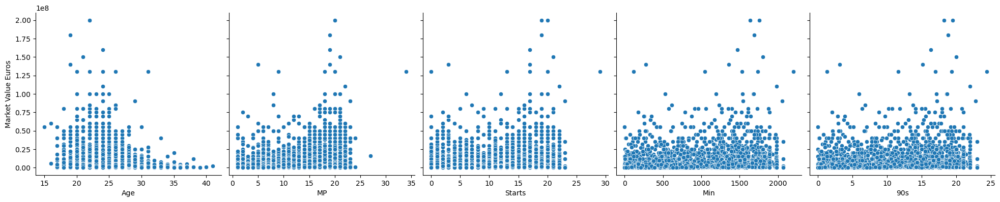

In [21]:
# first few Variables
#g = sns.pairplot(player_agg[['Market Value Euros', 'Age', 'MP', 'Starts', 'Min', '90s']], height = 5)
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['Age', 'MP', 'Starts', 'Min', '90s'], height = 4)

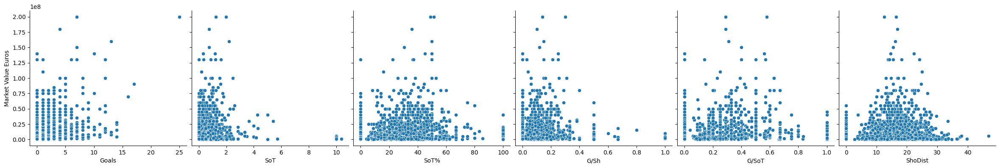

In [22]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['Goals', 'SoT', 'SoT%', 'G/Sh', 'G/SoT', 'ShoDist'], height = 4)

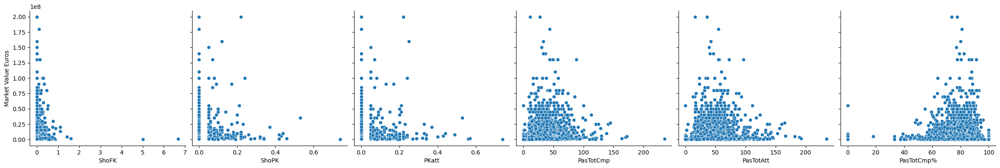

In [23]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['ShoFK', 'ShoPK', 'PKatt', 'PasTotCmp', 'PasTotAtt', 'PasTotCmp%'], height = 4)

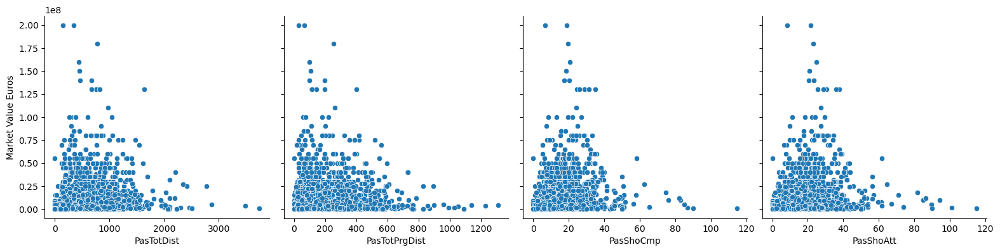

In [24]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['PasTotDist', 'PasTotPrgDist', 'PasShoCmp', 'PasShoAtt'], height = 4)

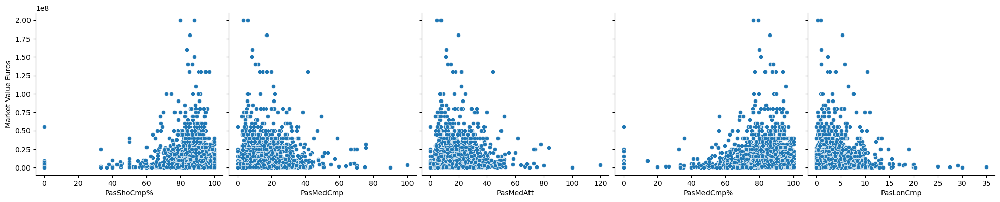

In [25]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['PasShoCmp%', 'PasMedCmp', 'PasMedAtt', 'PasMedCmp%', 'PasLonCmp'], height = 4)

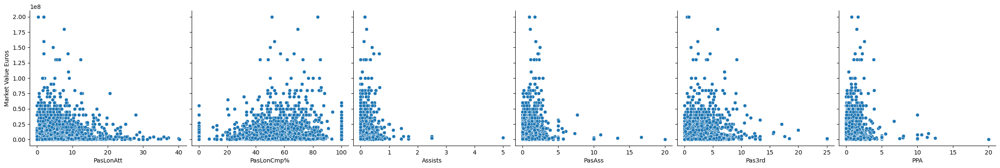

In [26]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['PasLonAtt', 'PasLonCmp%', 'Assists', 'PasAss', 'Pas3rd', 'PPA'], height = 4)

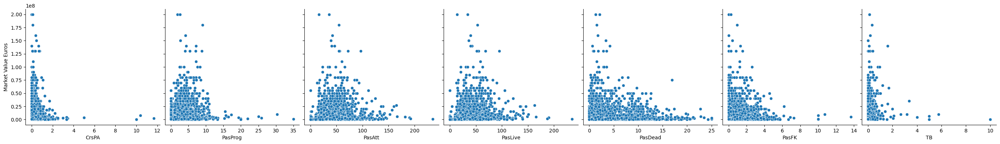

In [27]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['CrsPA', 'PasProg', 'PasAtt', 'PasLive', 'PasDead', 'PasFK', 'TB'], height = 4)

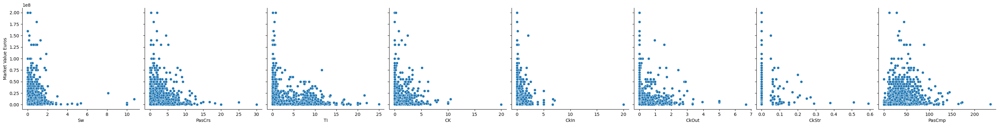

In [28]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['Sw', 'PasCrs', 'TI', 'CK', 'CkIn', 'CkOut', 'CkStr', 'PasCmp'], height = 4)

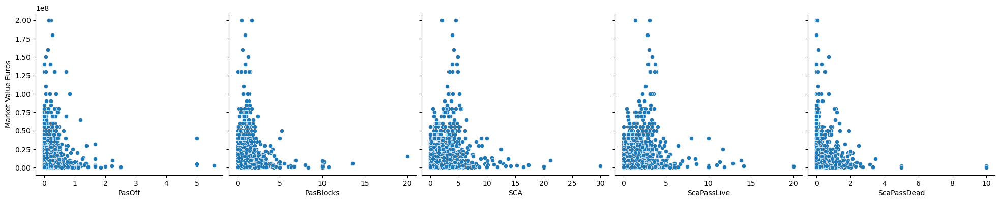

In [29]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['PasOff', 'PasBlocks', 'SCA', 'ScaPassLive', 'ScaPassDead'], height = 4)

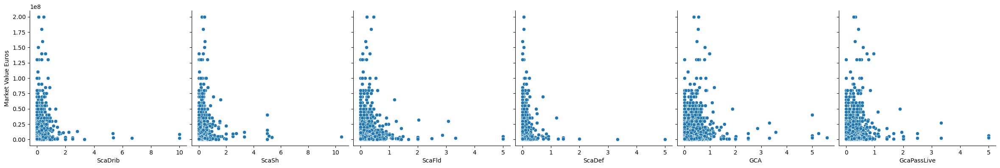

In [30]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['ScaDrib', 'ScaSh', 'ScaFld', 'ScaDef', 'GCA', 'GcaPassLive'], height = 4)

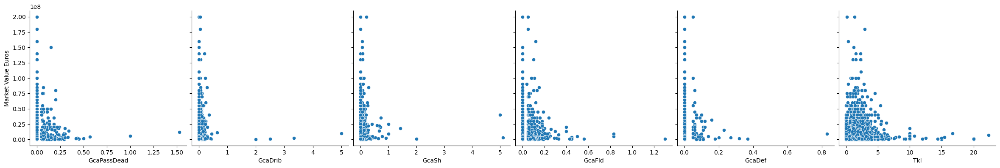

In [31]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['GcaPassDead', 'GcaDrib', 'GcaSh', 'GcaFld', 'GcaDef', 'Tkl'], height = 4)

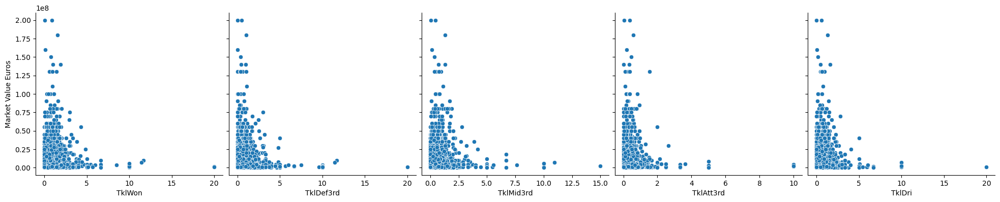

In [32]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['TklWon', 'TklDef3rd', 'TklMid3rd', 'TklAtt3rd', 'TklDri'], height = 4)

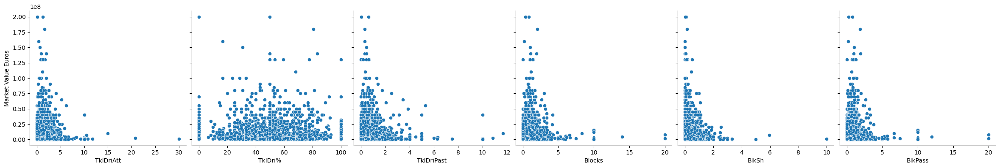

In [33]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['TklDriAtt', 'TklDri%', 'TklDriPast', 'Blocks', 'BlkSh', 'BlkPass'], height = 4)

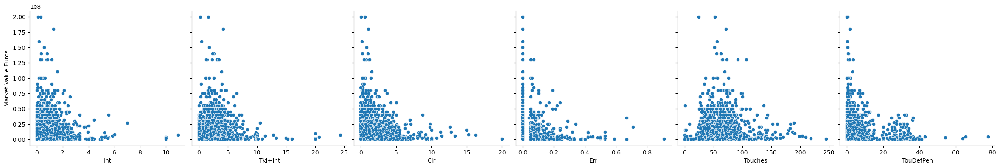

In [34]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['Int', 'Tkl+Int', 'Clr', 'Err', 'Touches', 'TouDefPen'], height = 4)

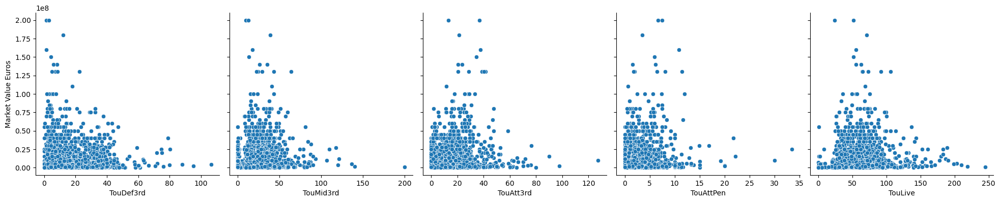

In [35]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['TouDef3rd', 'TouMid3rd', 'TouAtt3rd', 'TouAttPen', 'TouLive'], height = 4)

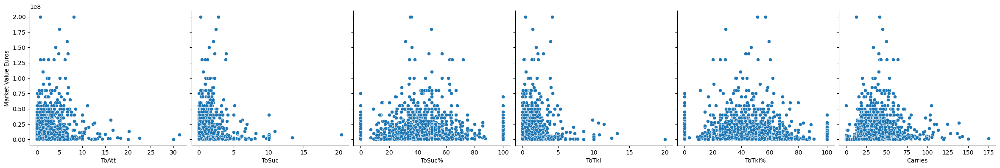

In [36]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['ToAtt', 'ToSuc', 'ToSuc%', 'ToTkl', 'ToTkl%', 'Carries'], height = 4)

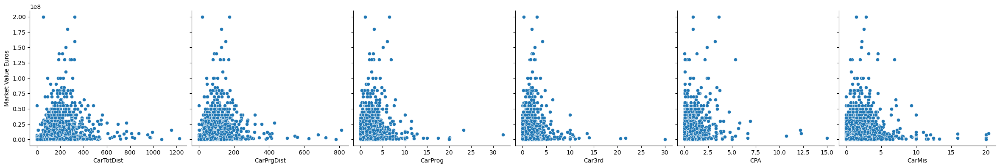

In [37]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['CarTotDist', 'CarPrgDist', 'CarProg', 'Car3rd', 'CPA', 'CarMis'], height = 4)

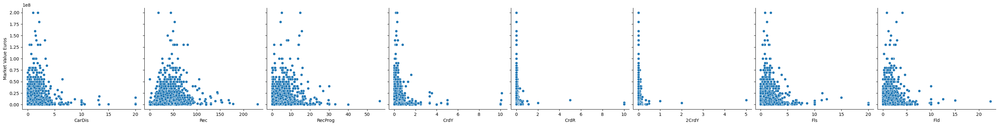

In [38]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['CarDis', 'Rec', 'RecProg', 'CrdY', 'CrdR', '2CrdY', 'Fls', 'Fld'], height = 4)

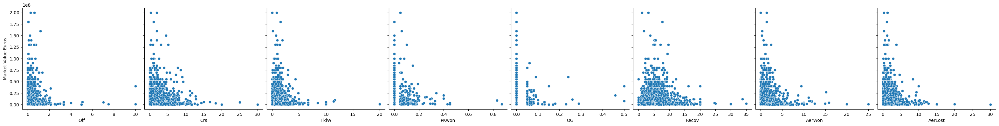

In [39]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['Off', 'Crs', 'TklW', 'PKwon', 'OG', 'Recov', 'AerWon', 'AerLost'], height = 4)

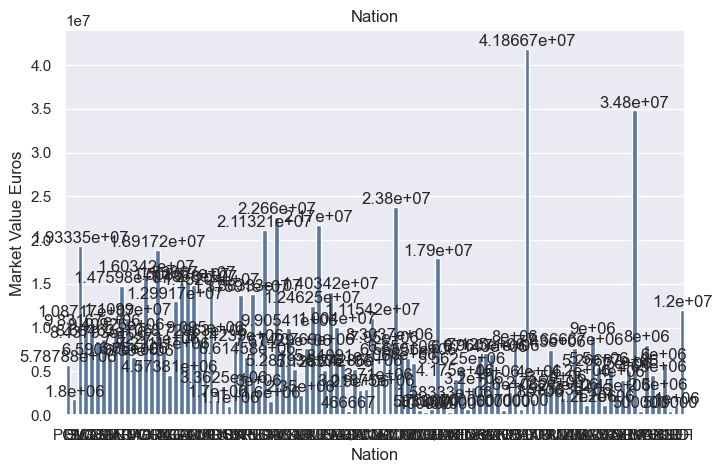

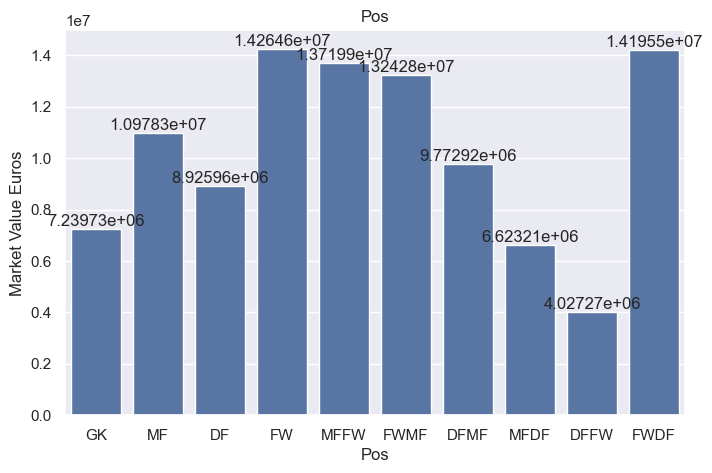

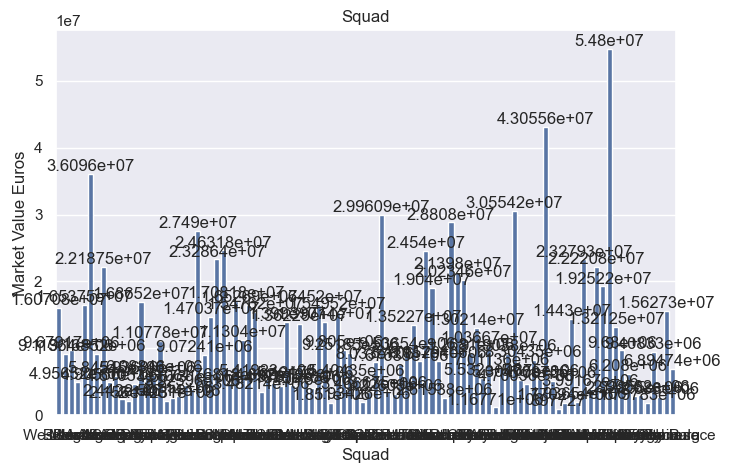

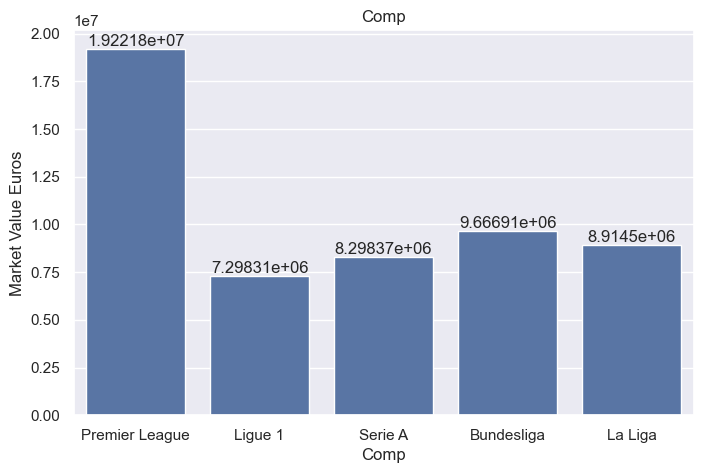

In [40]:
# visualizing the categorical values

categories = ['Nation', 'Pos', 'Squad', 'Comp']

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(8,5)})

for c in categories:
    
    ax = sns.barplot(x=c, y="Market Value Euros", data=player_agg, errorbar=('ci', False)) #, hue = 'Model')
    for container in ax.containers:
        ax.bar_label(container)
    plt.title(c)
    plt.show()

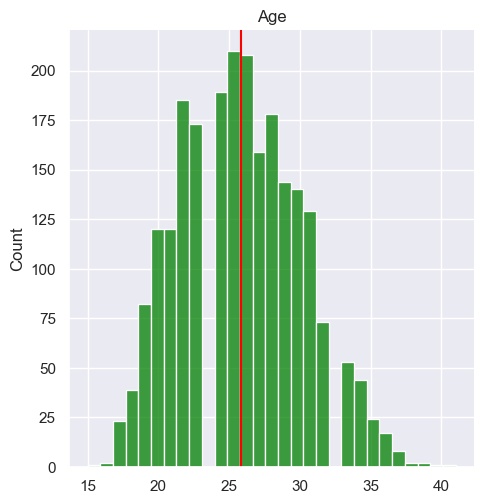

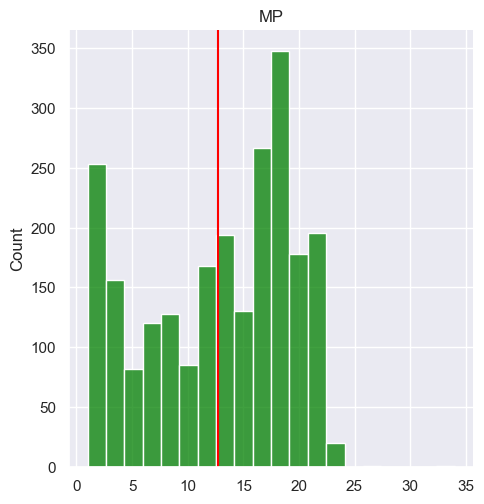

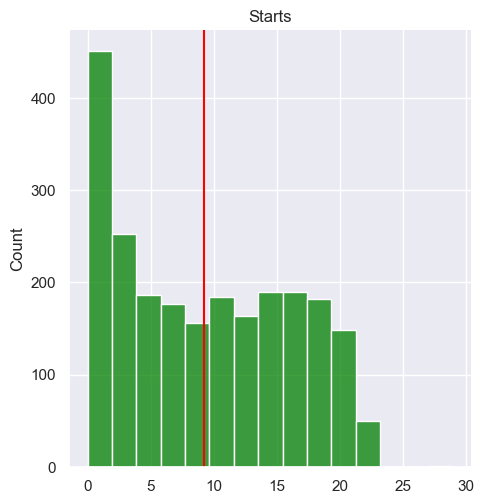

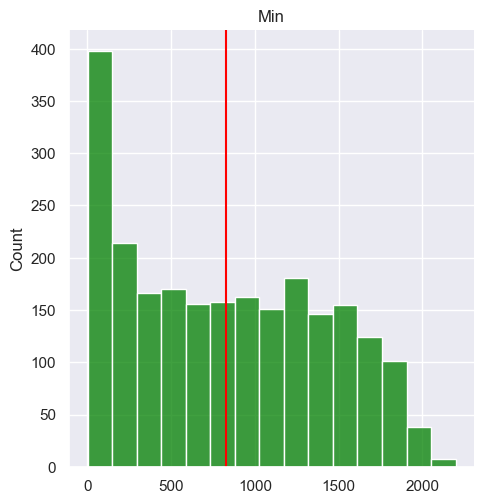

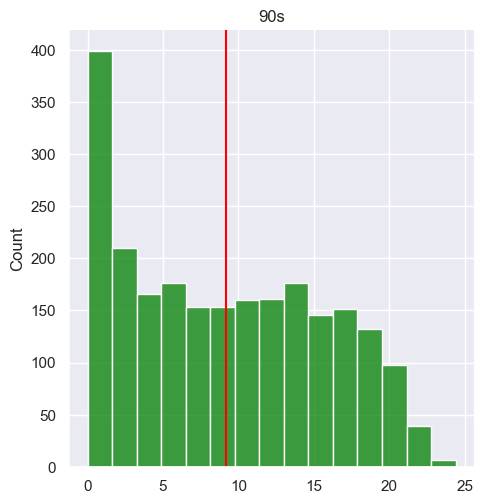

...

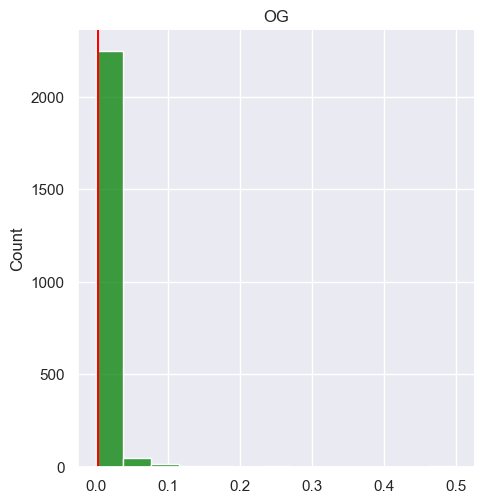

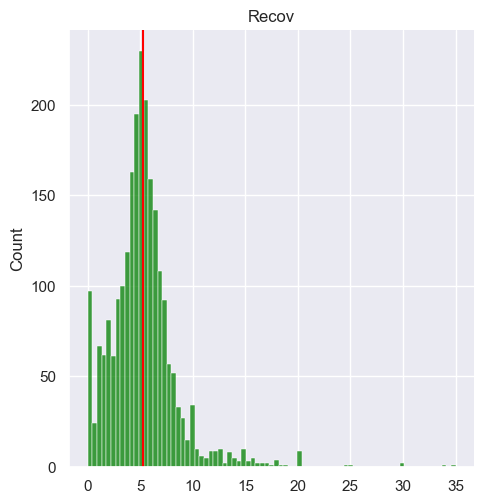

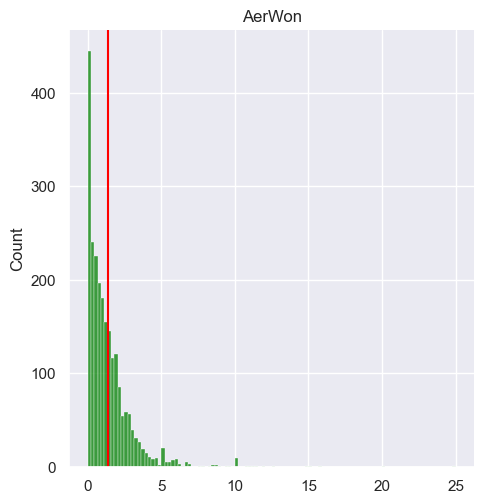

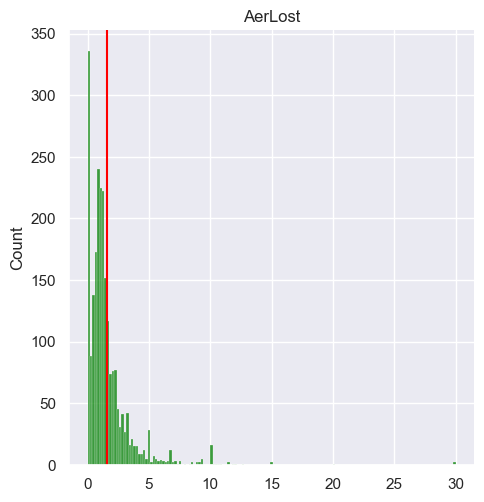

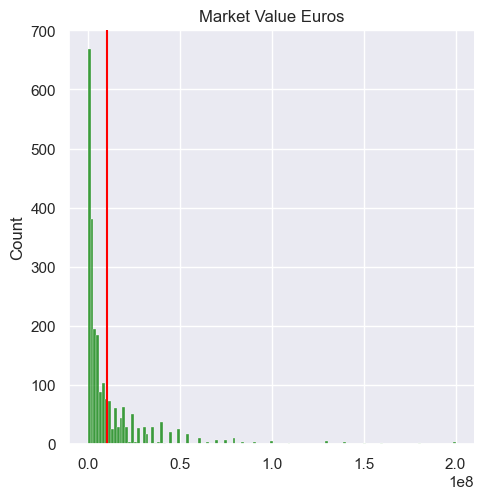

In [41]:
# Investigating the distribution of all fields, adding the mean

# identifying all numeric columns
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
n_variables = player_agg.select_dtypes(include=numerics).columns

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(8,5)})


for n in n_variables:
    x = player_agg[n].values
    sns.displot(x, color = 'green');

    # Calculating the mean
    mean = player_agg[n].mean()

    #ploting the mean
    plt.axvline(mean, 0,1, color = 'red')
    plt.title(n)
    plt.show()

In [42]:
# removing players with more than 100m Market Values as they will skew the results - OUTLIERS
player_agg = player_agg[player_agg['Market Value Euros']<100000000]

The meadian is:  26.0


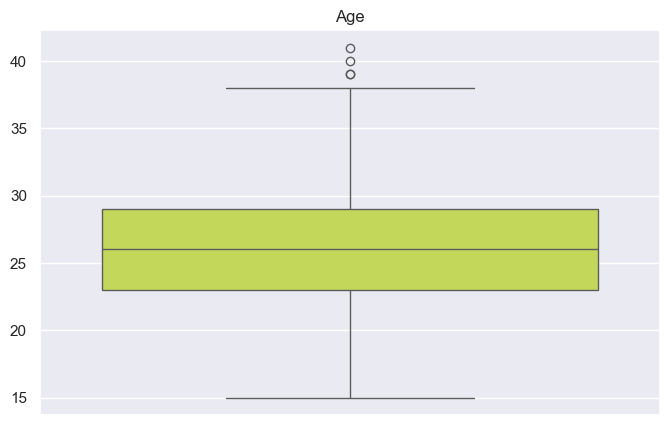

The meadian is:  14.0


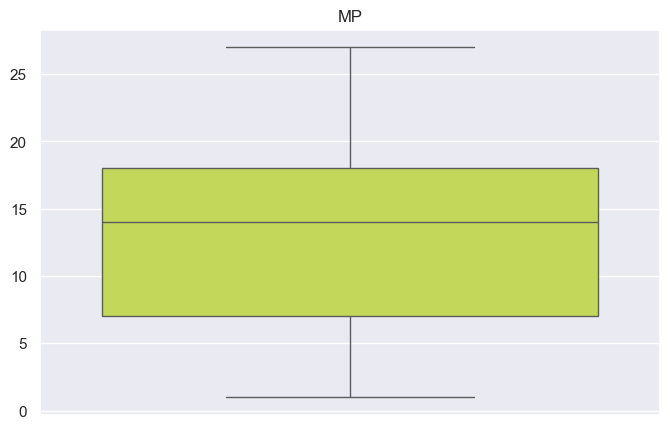

The meadian is:  9.0


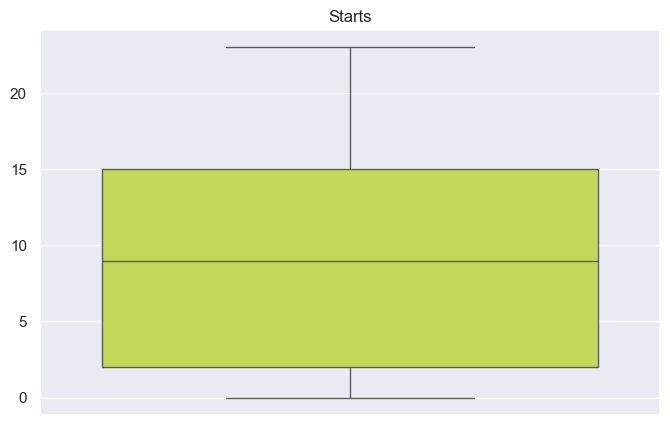

The meadian is:  779.0


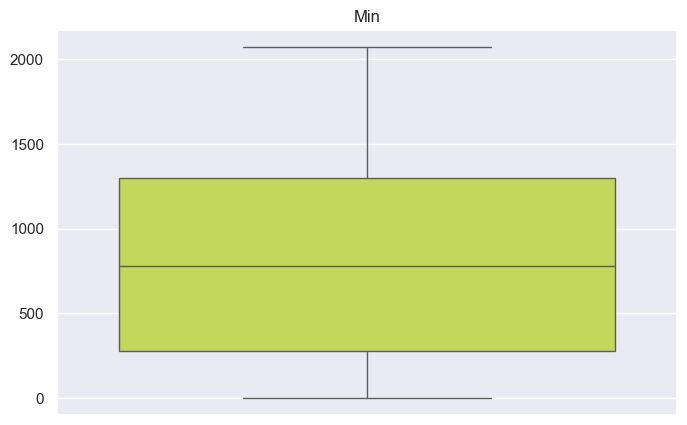

The meadian is:  8.7


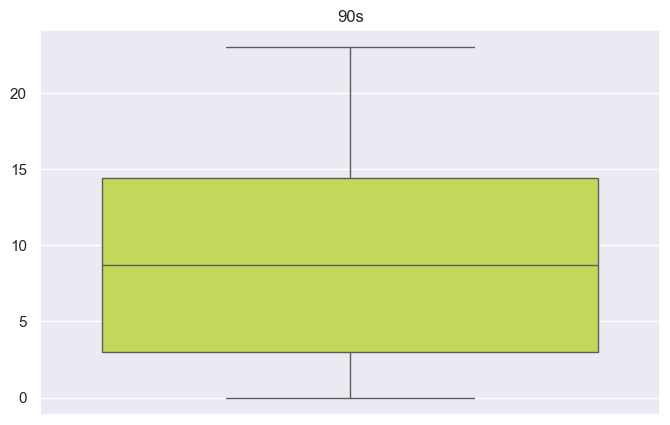

The meadian is:  0.0


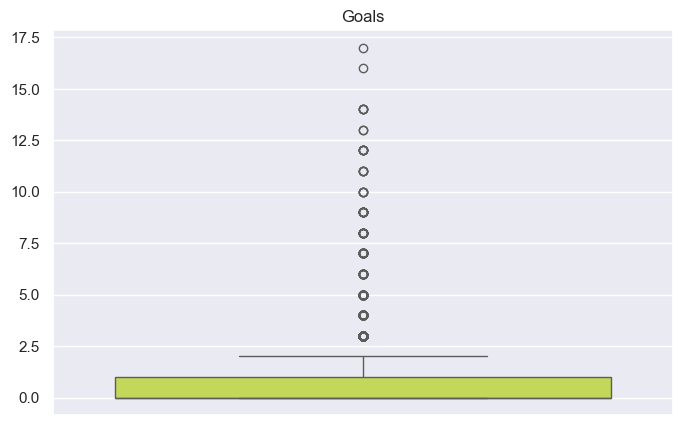

The meadian is:  0.2


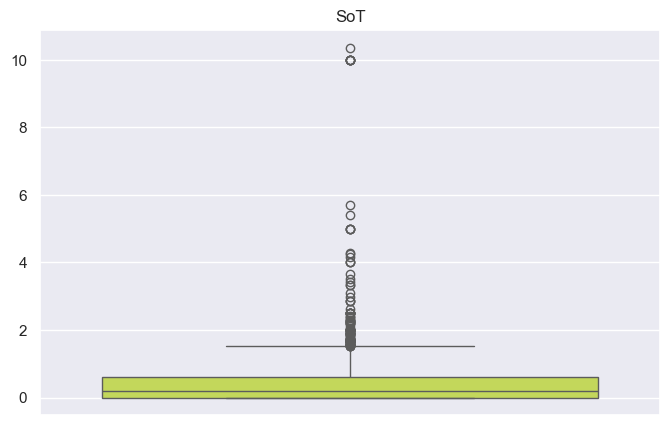

The meadian is:  25.0


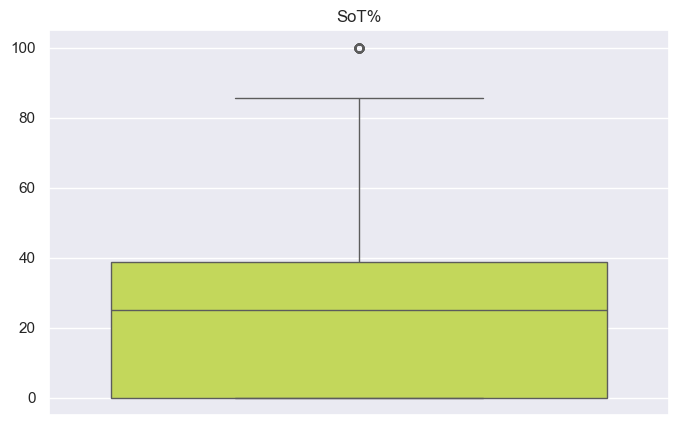

The meadian is:  0.0


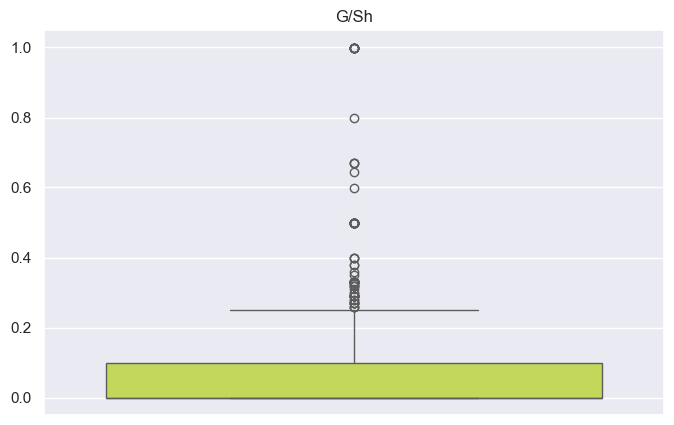

The meadian is:  0.0


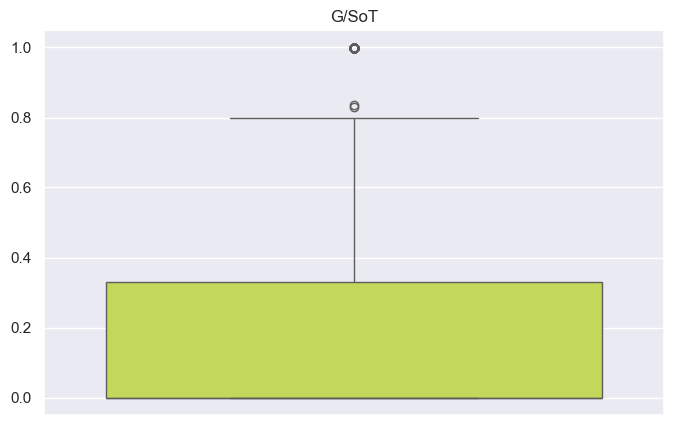

The meadian is:  15.5


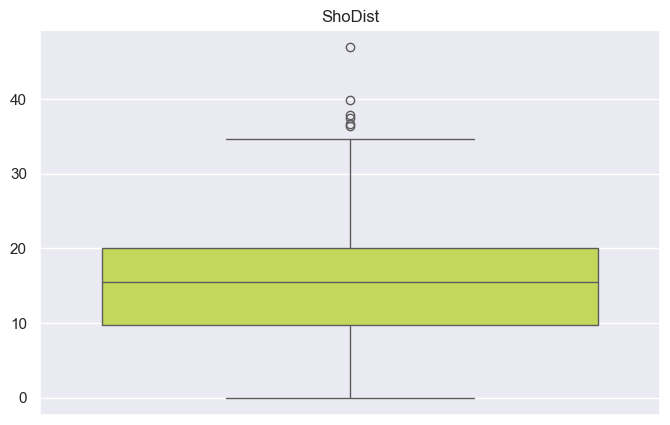

The meadian is:  0.0


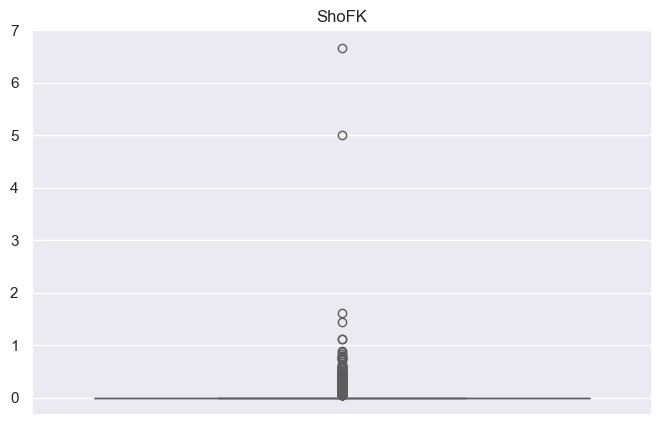

The meadian is:  0.0


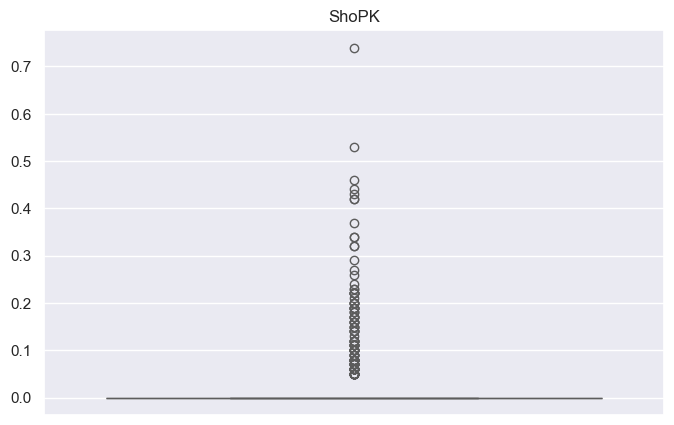

The meadian is:  0.0


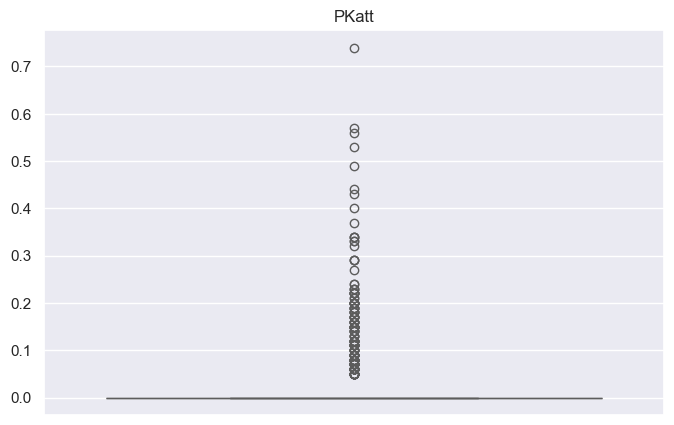

The meadian is:  32.8


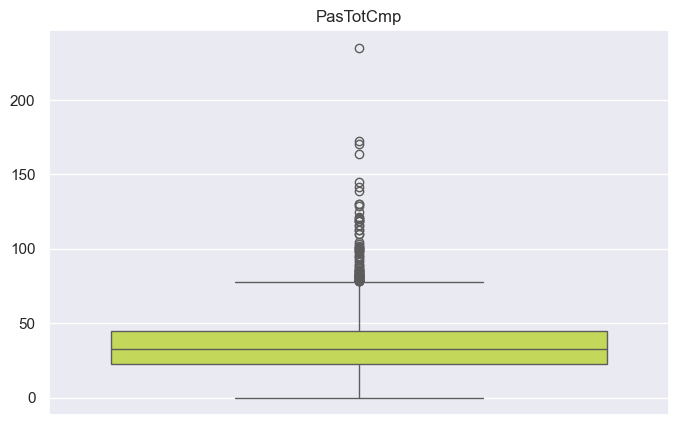

The meadian is:  43.0


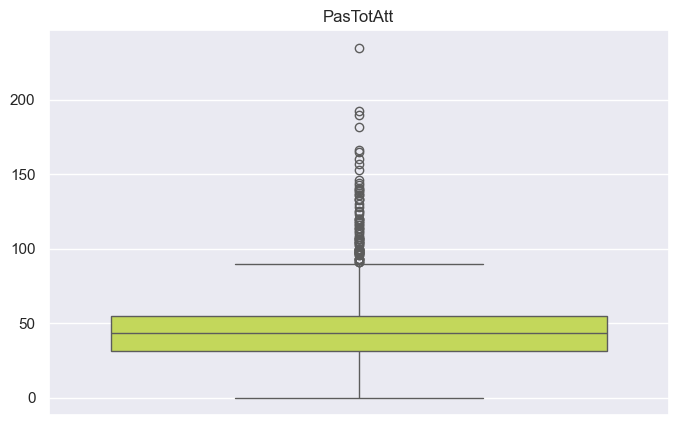

The meadian is:  77.3


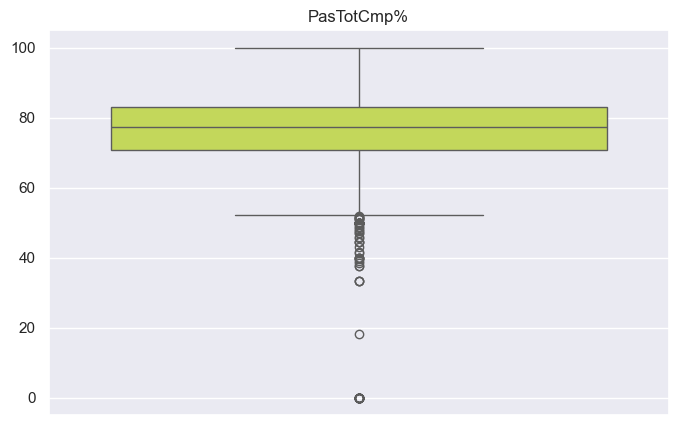

The meadian is:  582.4


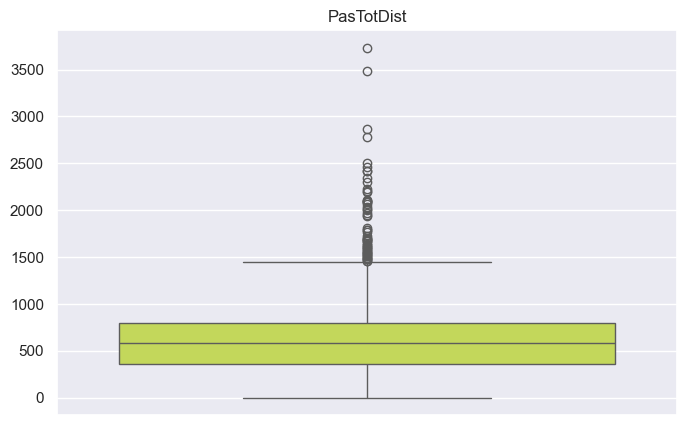

The meadian is:  184.1


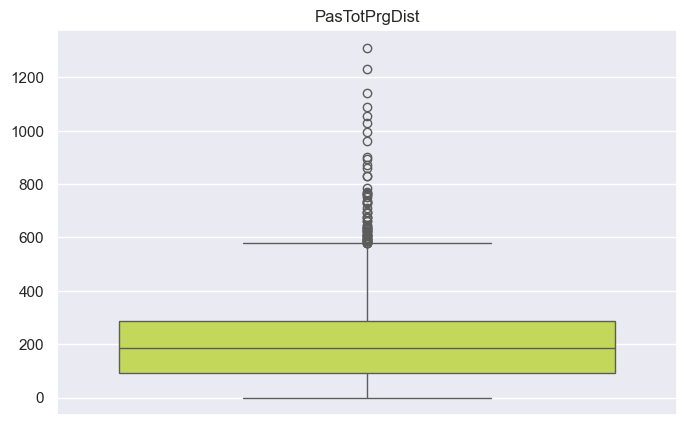

The meadian is:  15.0


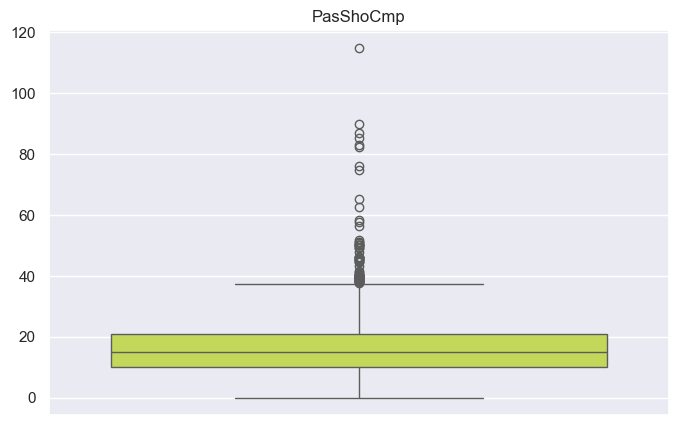

The meadian is:  17.5


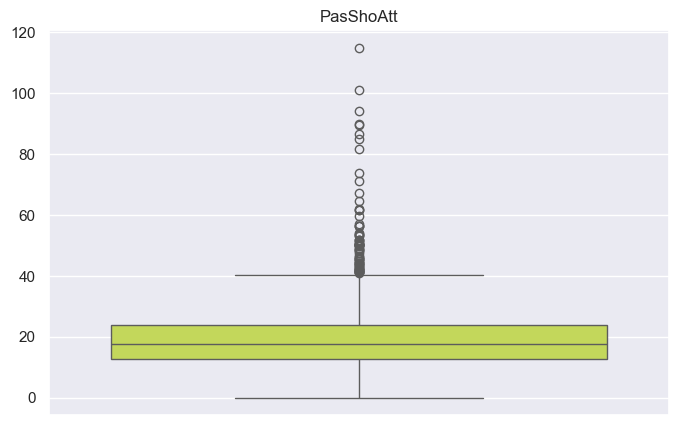

The meadian is:  87.4


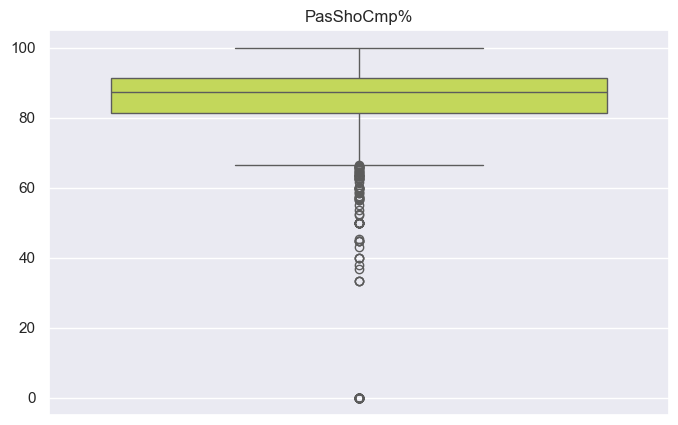

The meadian is:  12.8


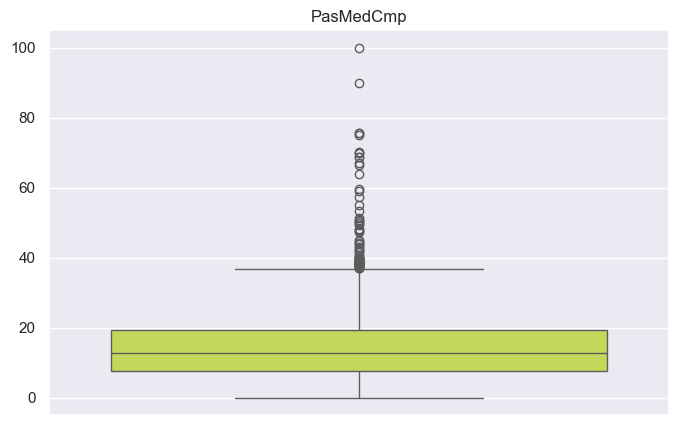

The meadian is:  15.9


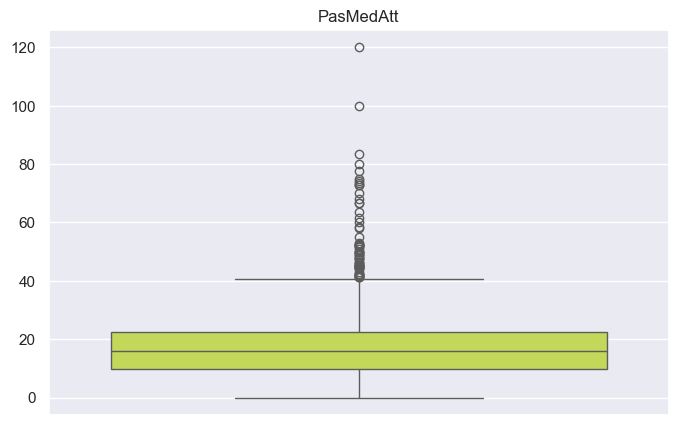

The meadian is:  83.0


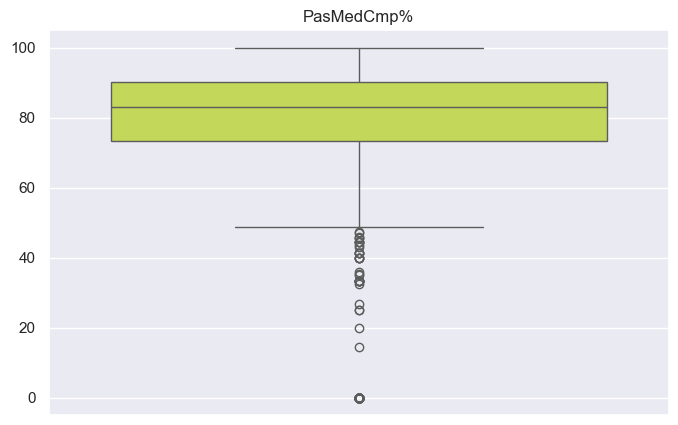

The meadian is:  2.79


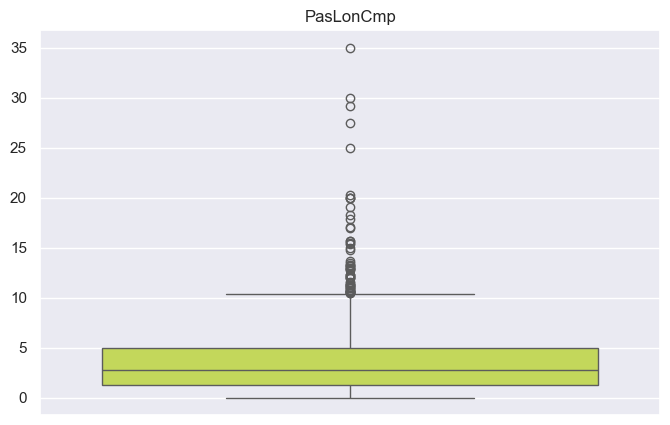

The meadian is:  5.25


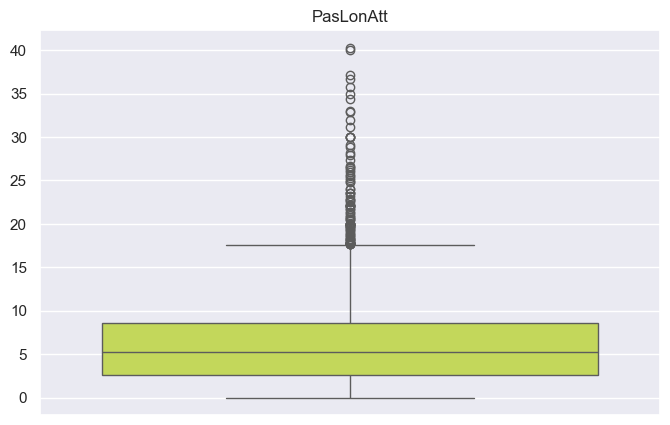

The meadian is:  53.3


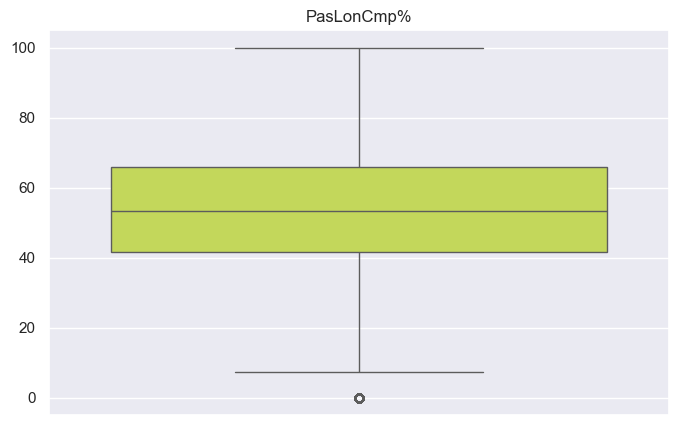

The meadian is:  0.0


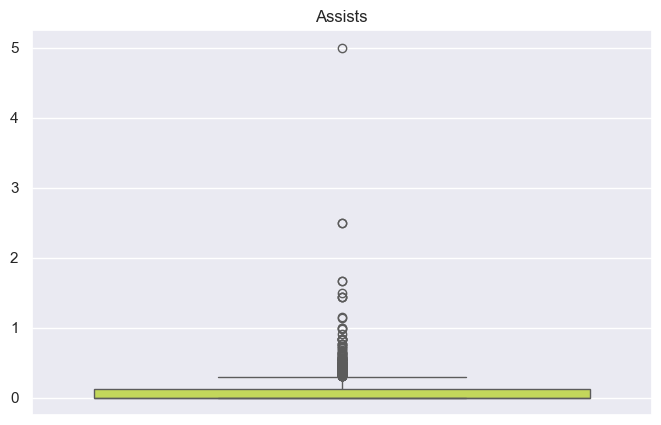

The meadian is:  0.69


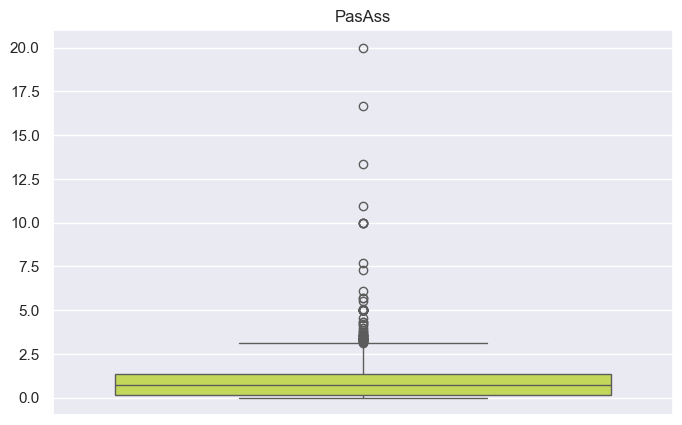

The meadian is:  2.27


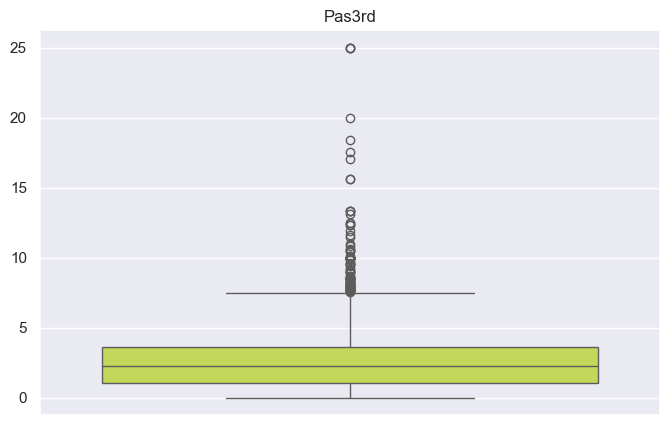

The meadian is:  0.53


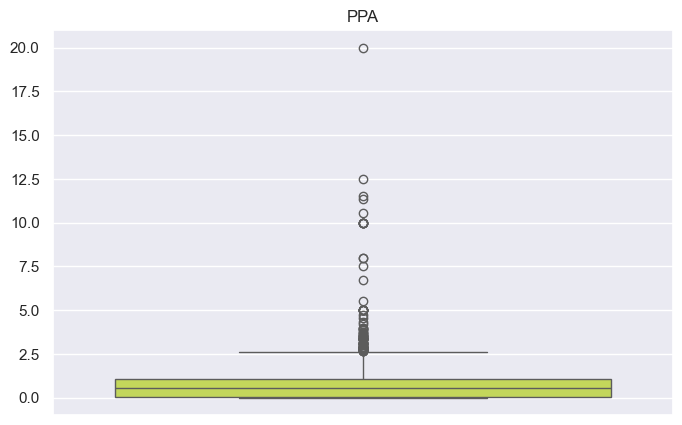

The meadian is:  0.0


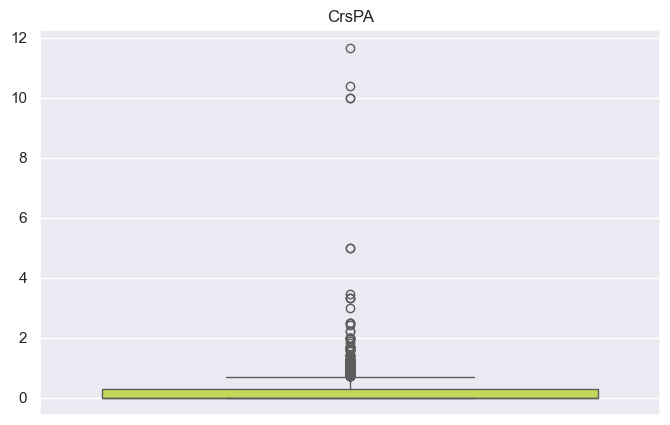

The meadian is:  3.22


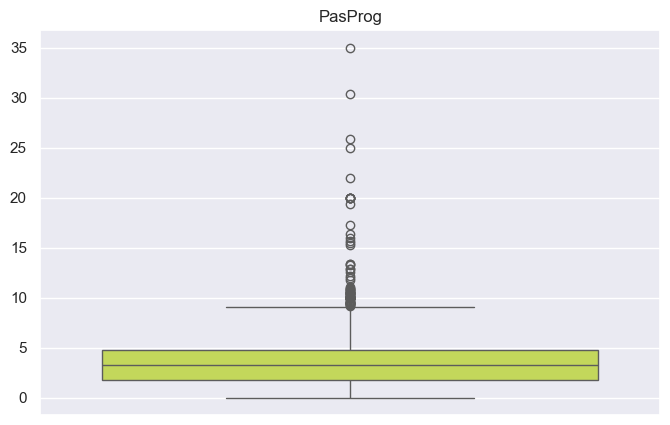

The meadian is:  43.0


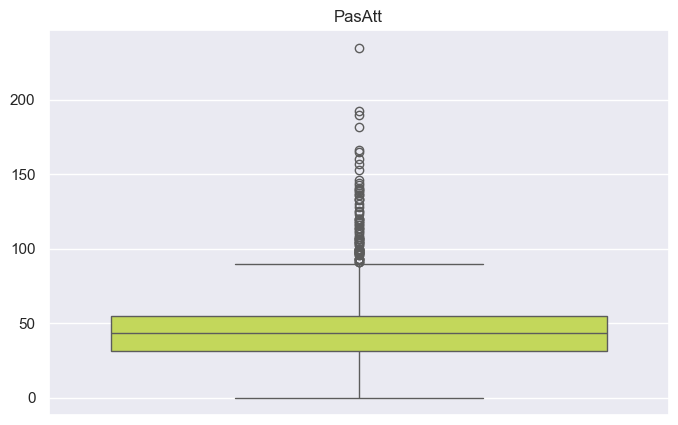

The meadian is:  38.5


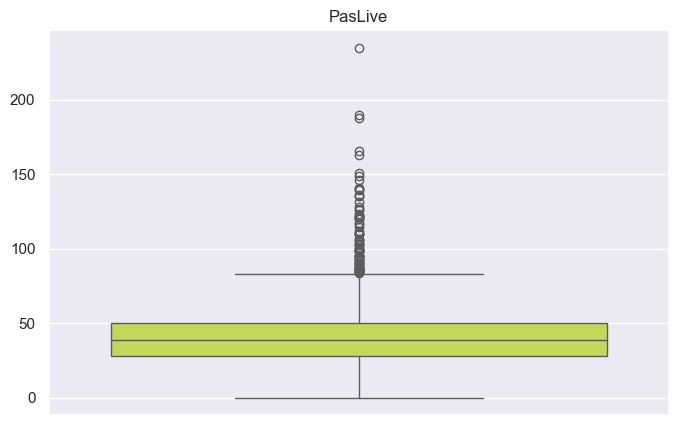

The meadian is:  2.47


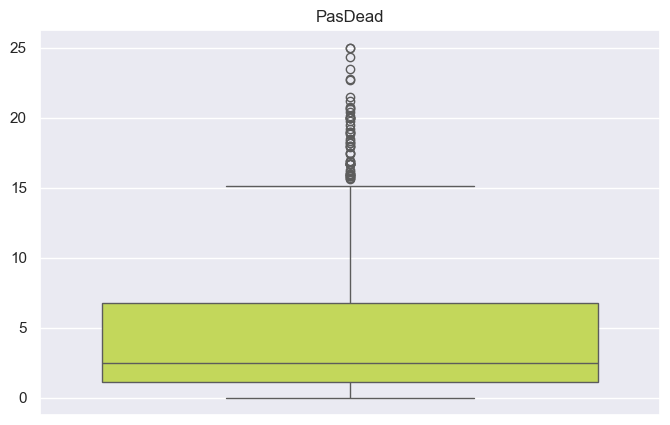

The meadian is:  0.73


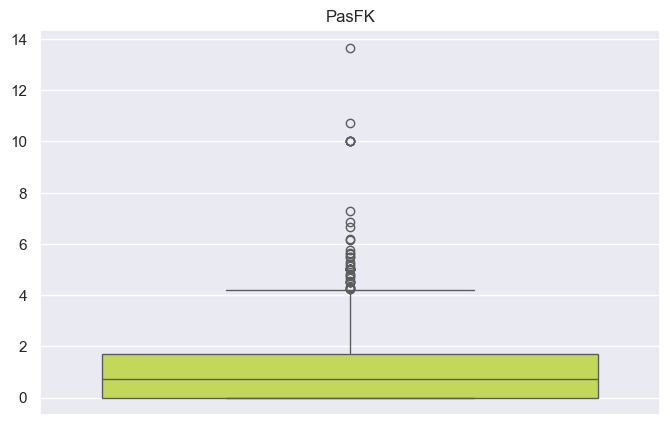

The meadian is:  0.0


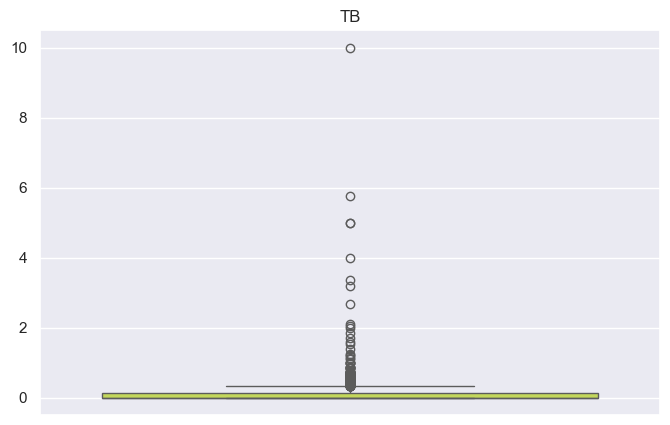

The meadian is:  0.16


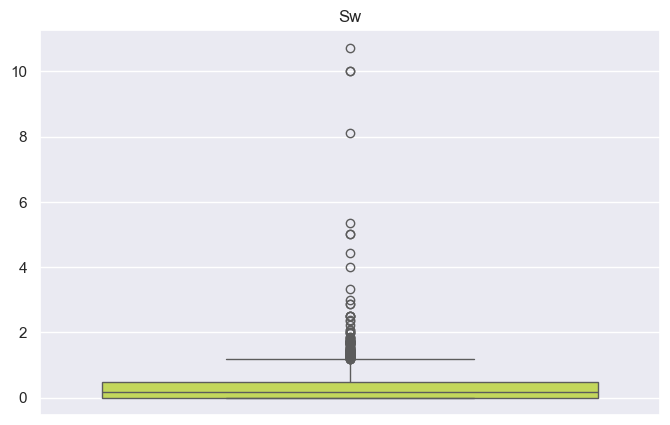

The meadian is:  0.83


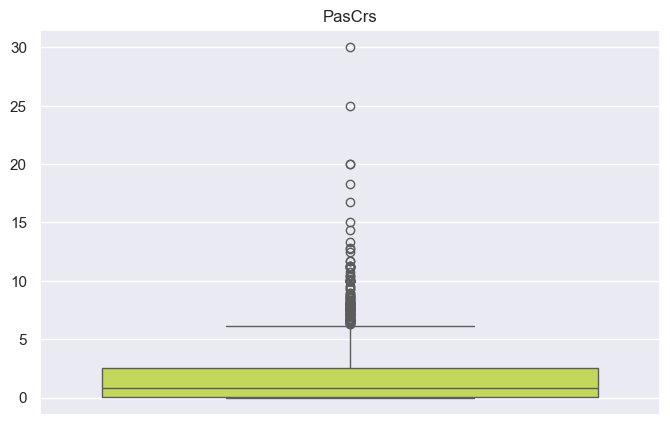

The meadian is:  0.25


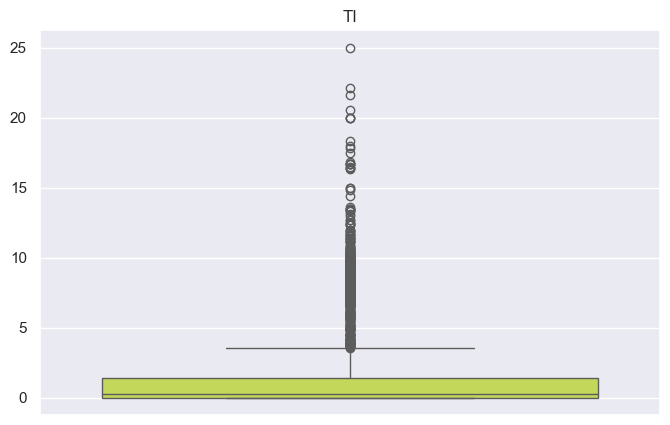

The meadian is:  0.0


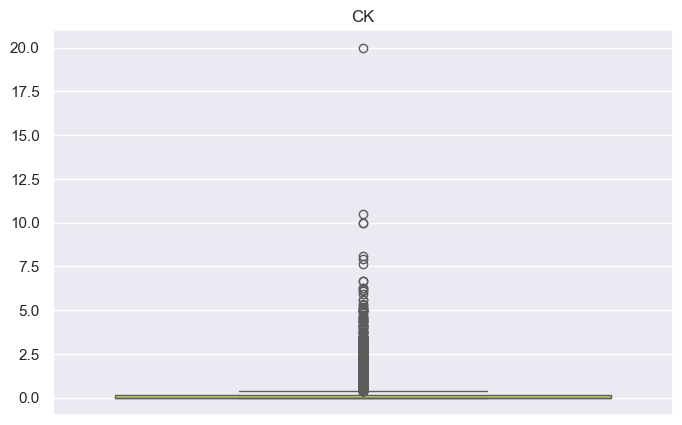

The meadian is:  0.0


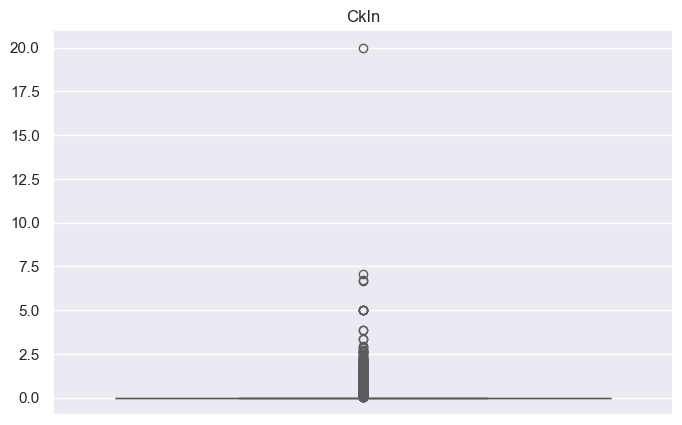

The meadian is:  0.0


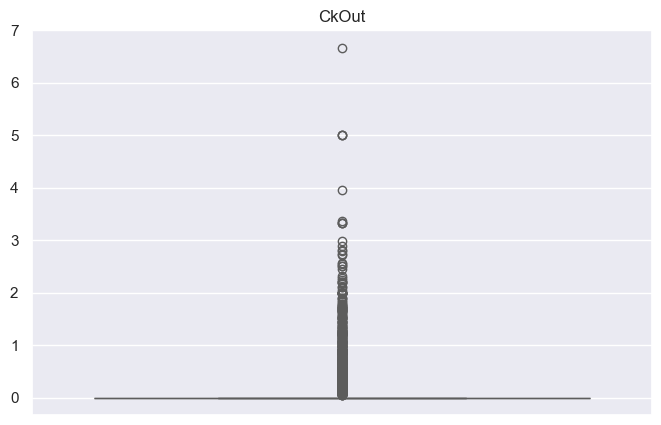

The meadian is:  0.0


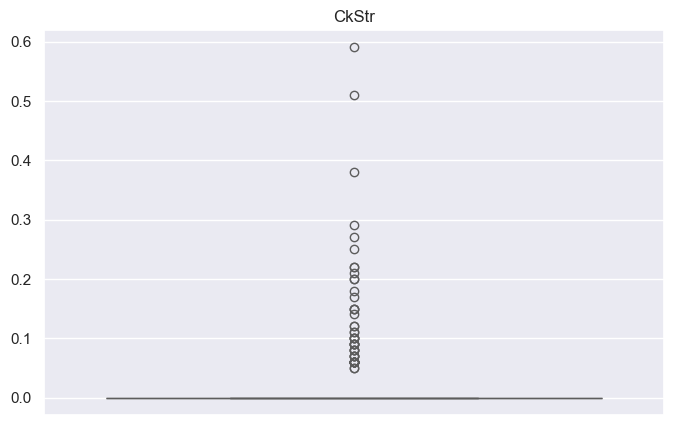

The meadian is:  32.8


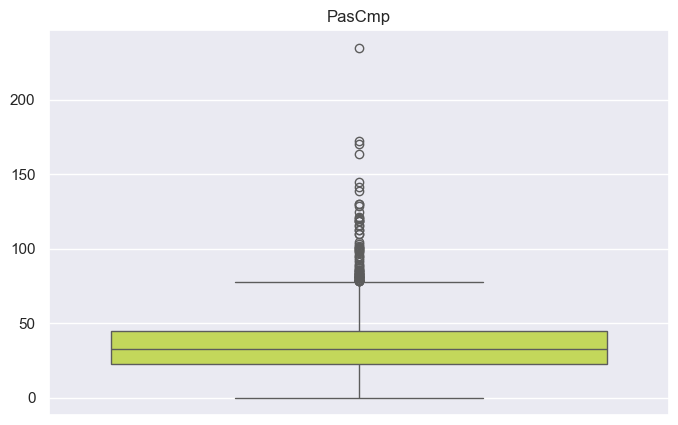

The meadian is:  0.1


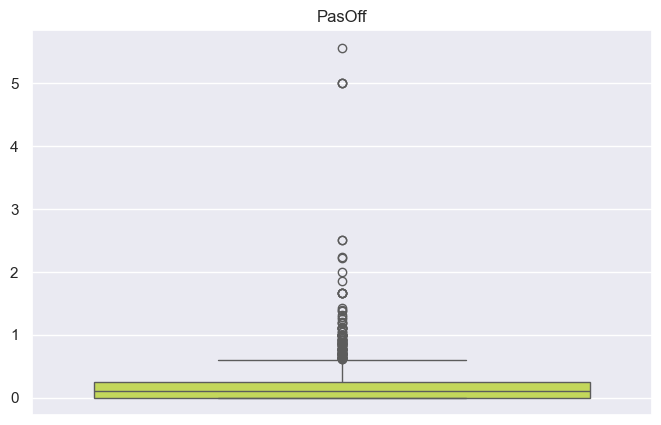

The meadian is:  0.81


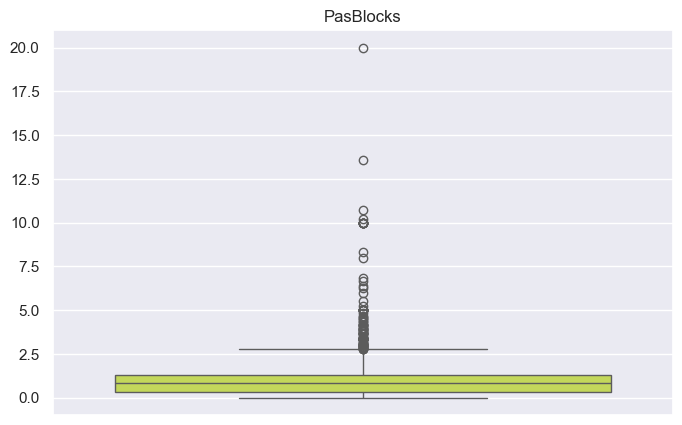

The meadian is:  1.87


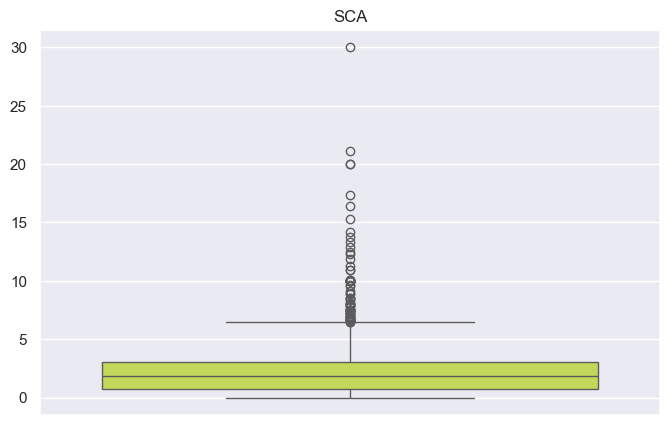

The meadian is:  1.36


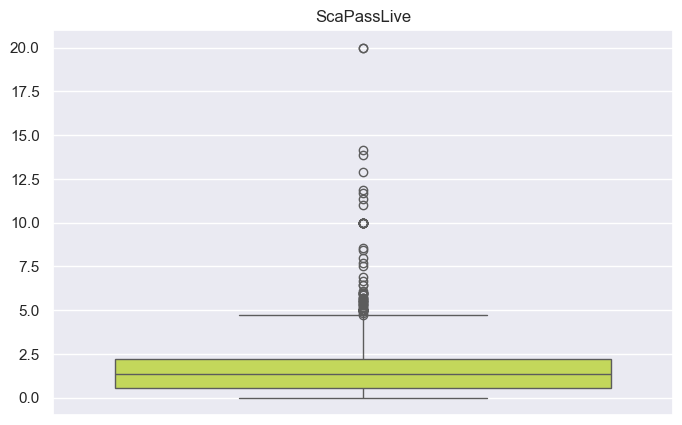

The meadian is:  0.0


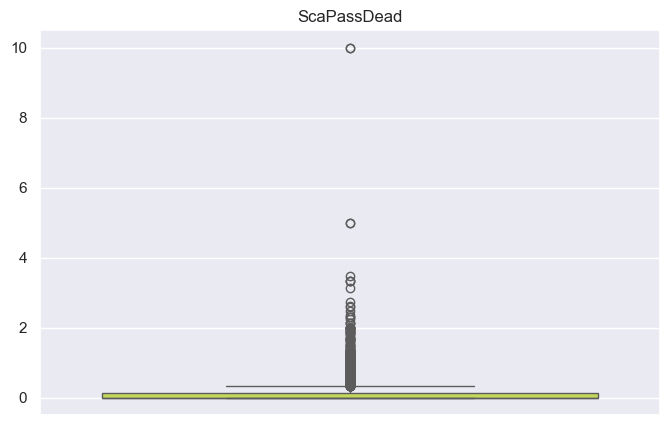

The meadian is:  0.0


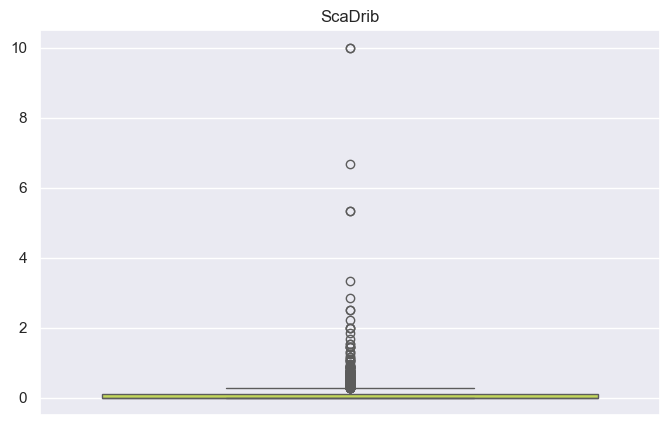

The meadian is:  0.0


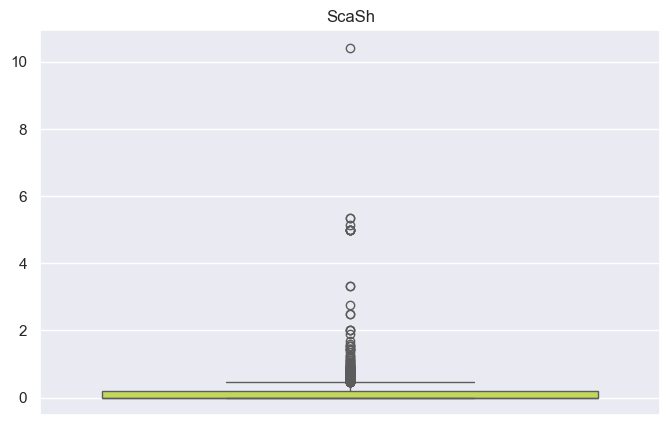

The meadian is:  0.0


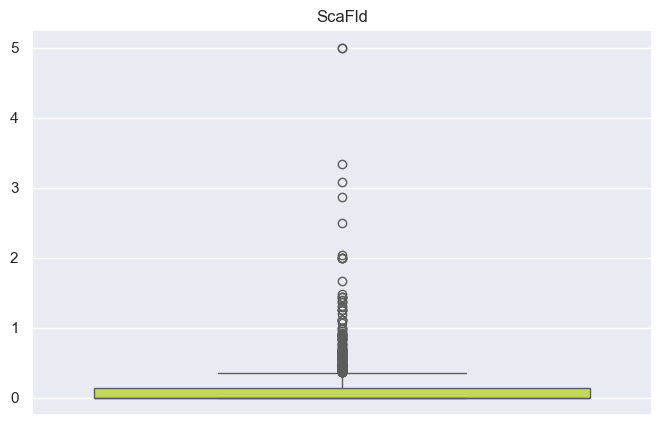

The meadian is:  0.0


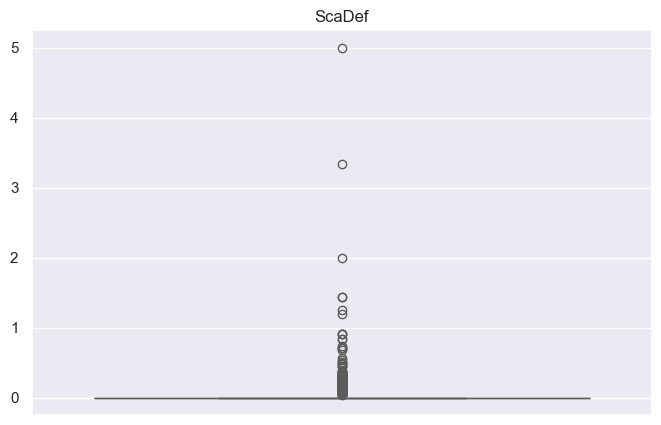

The meadian is:  0.1


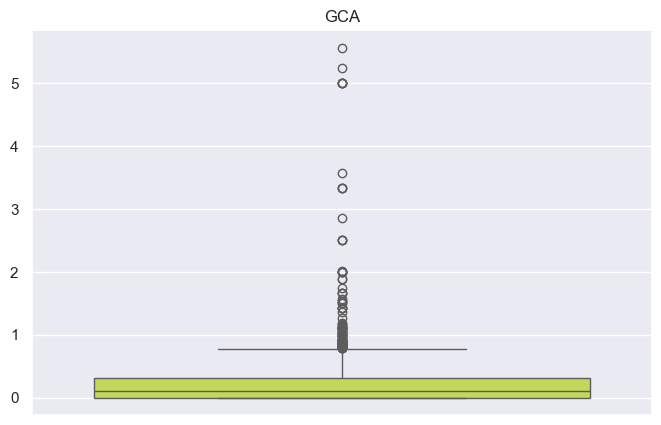

The meadian is:  0.06


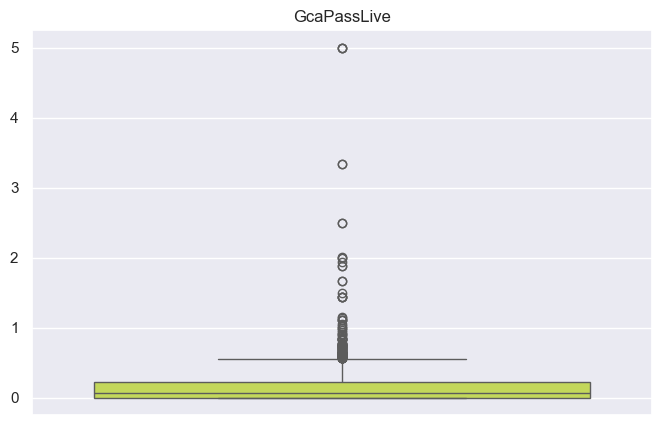

The meadian is:  0.0


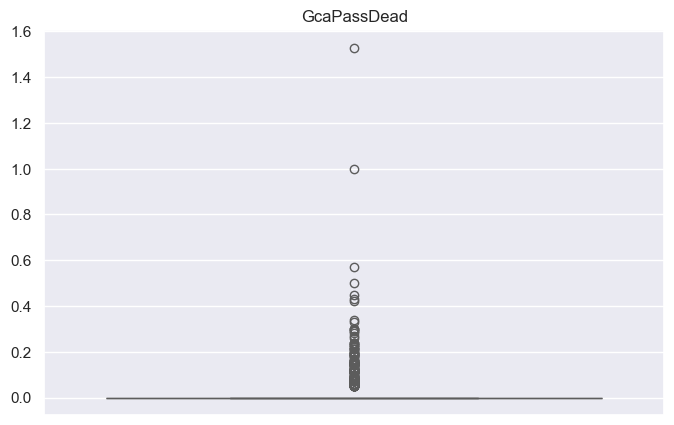

The meadian is:  0.0


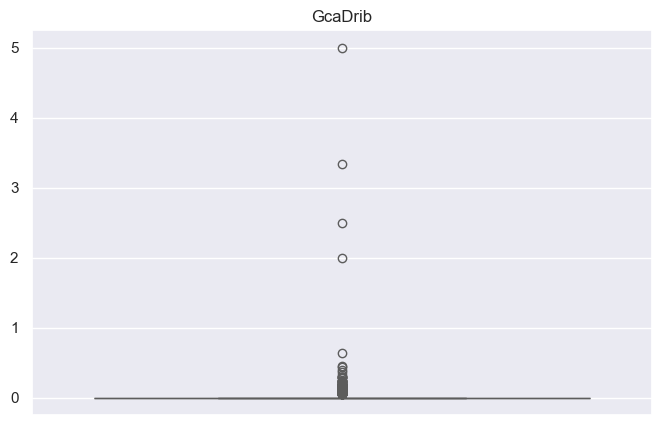

The meadian is:  0.0


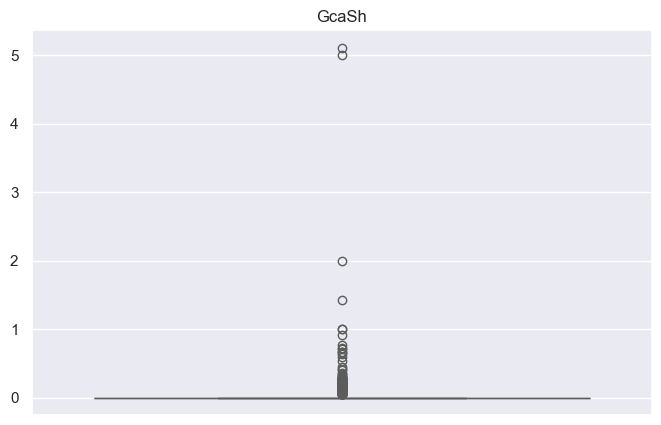

The meadian is:  0.0


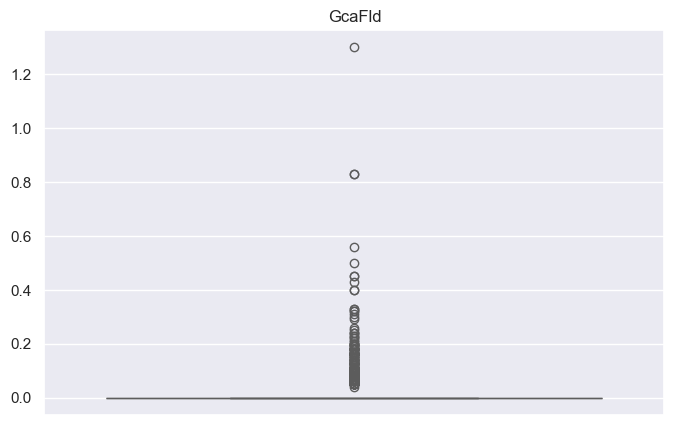

The meadian is:  0.0


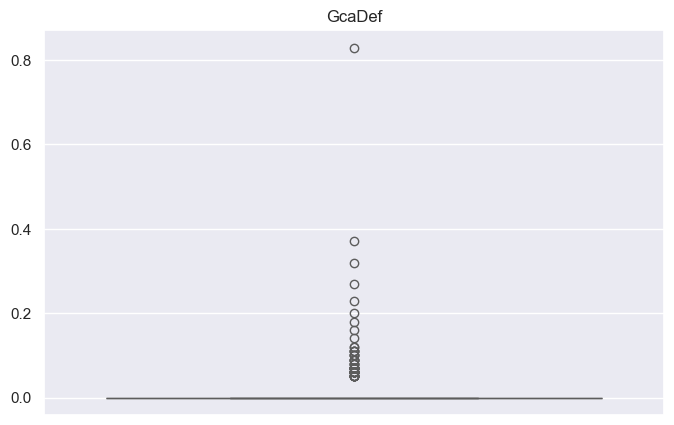

The meadian is:  1.57


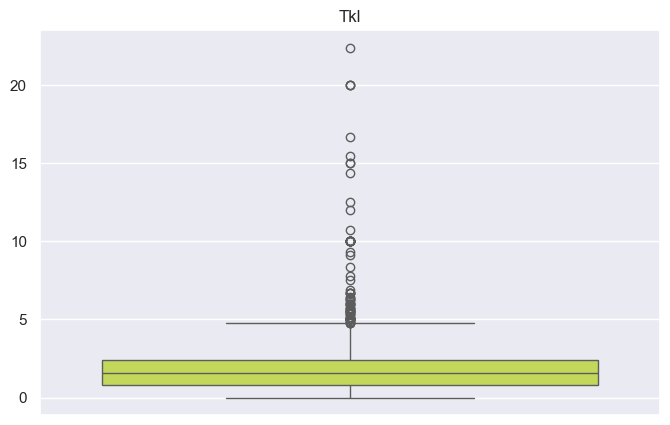

The meadian is:  0.8600000000000001


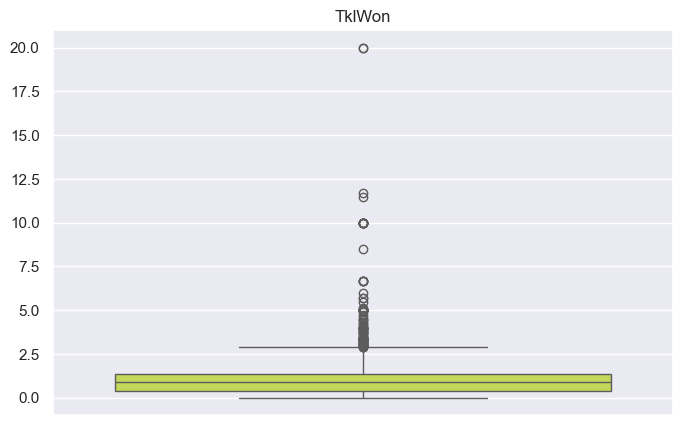

The meadian is:  0.67


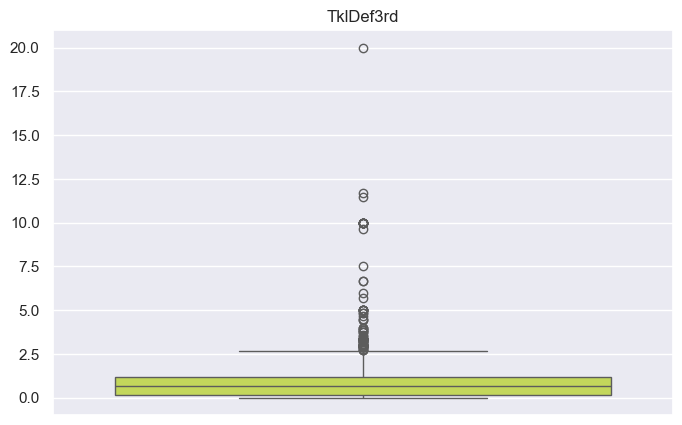

The meadian is:  0.53


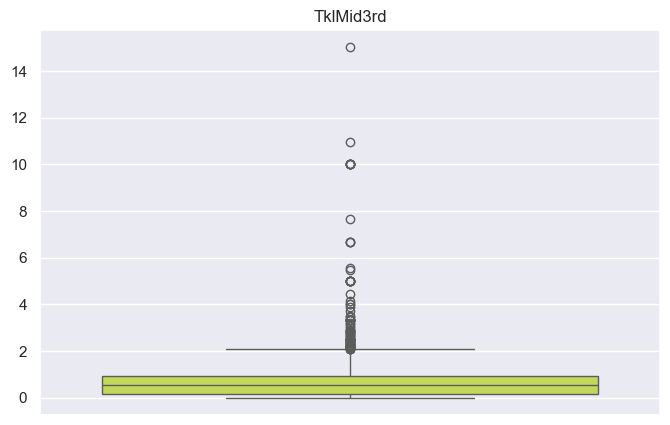

The meadian is:  0.13


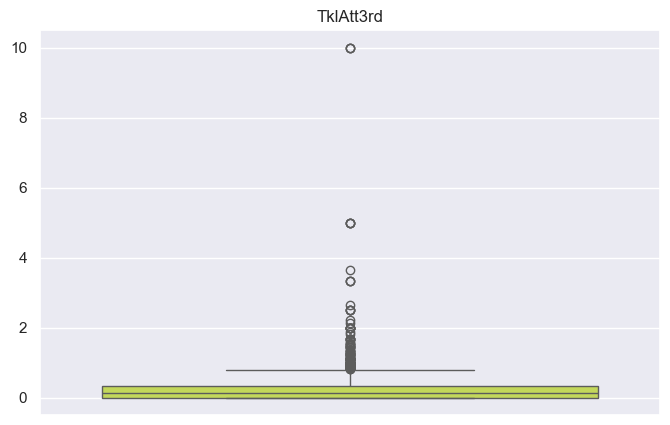

The meadian is:  0.64


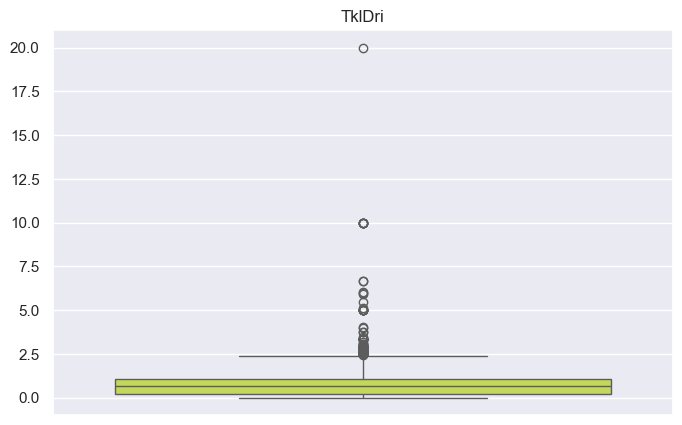

The meadian is:  1.31


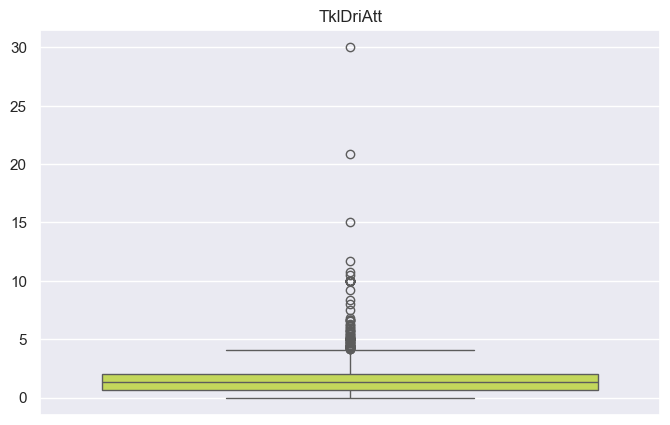

The meadian is:  50.0


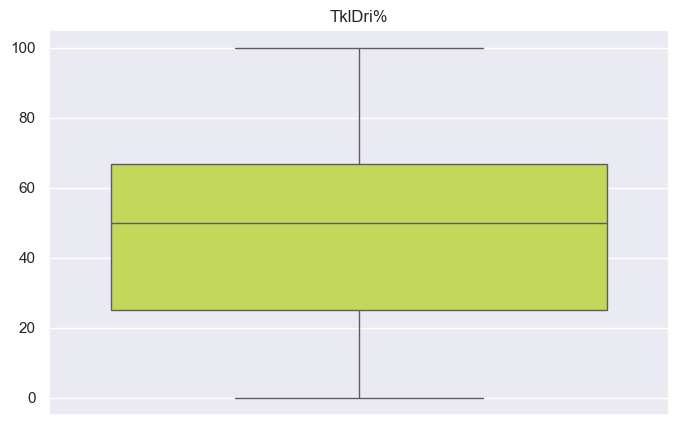

The meadian is:  0.53


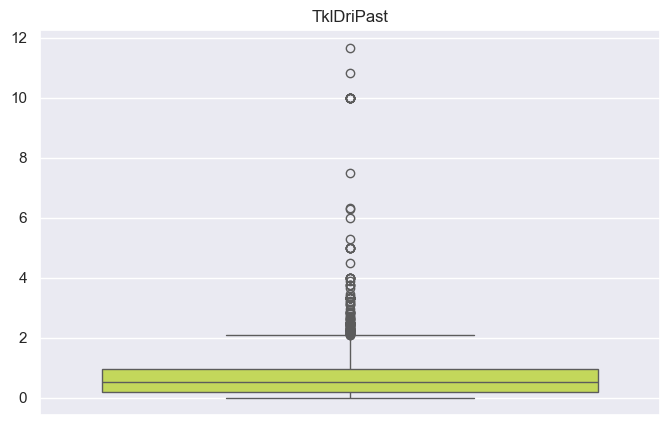

The meadian is:  1.01


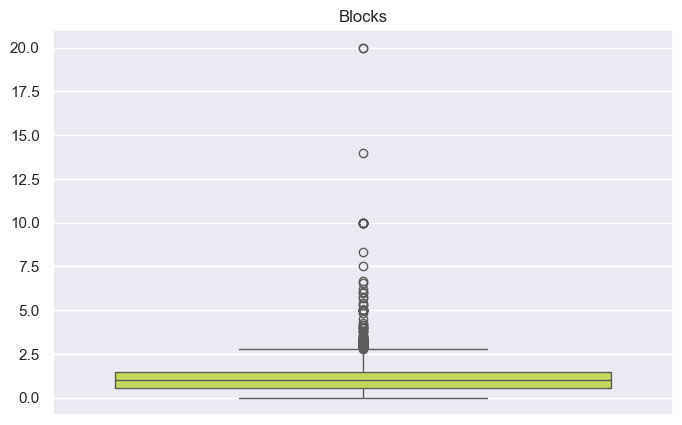

The meadian is:  0.14


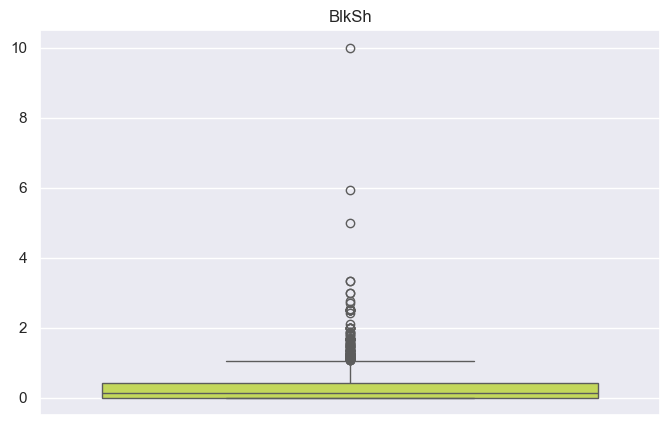

The meadian is:  0.69


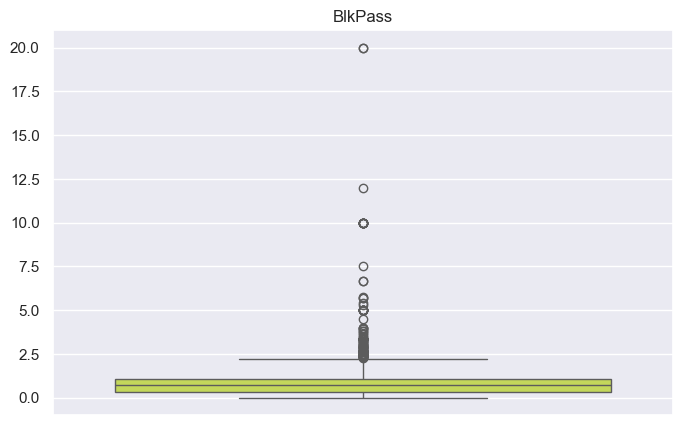

The meadian is:  0.75


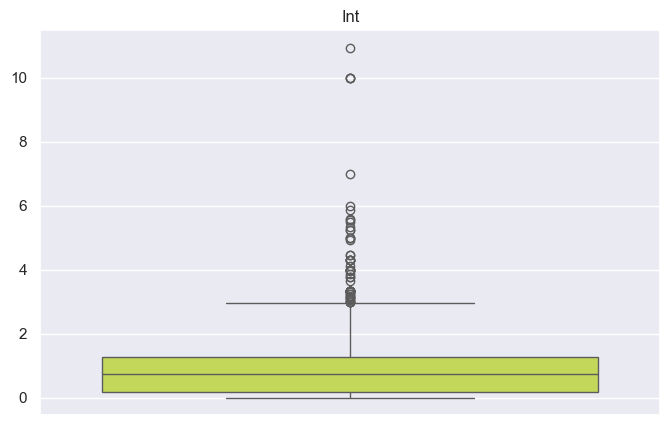

The meadian is:  2.5


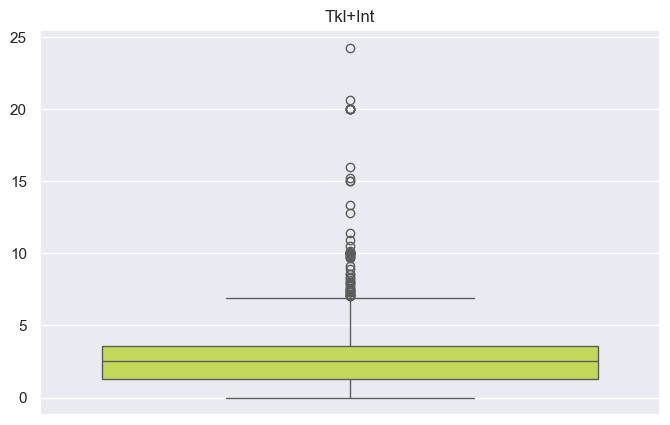

The meadian is:  1.07


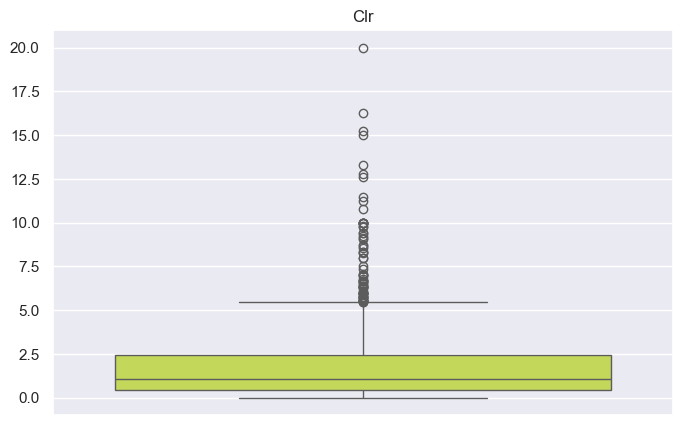

The meadian is:  0.0


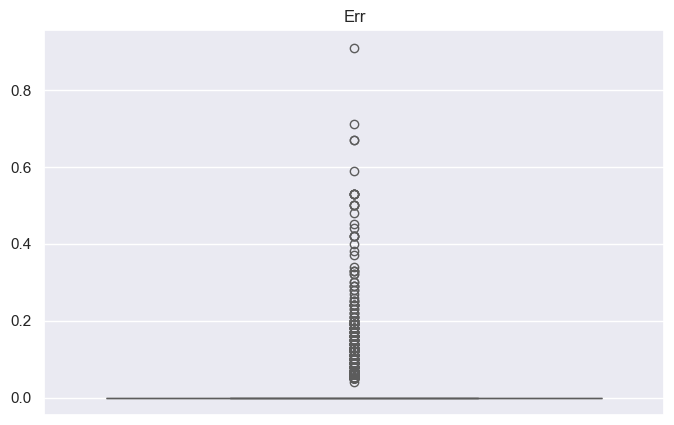

The meadian is:  54.6


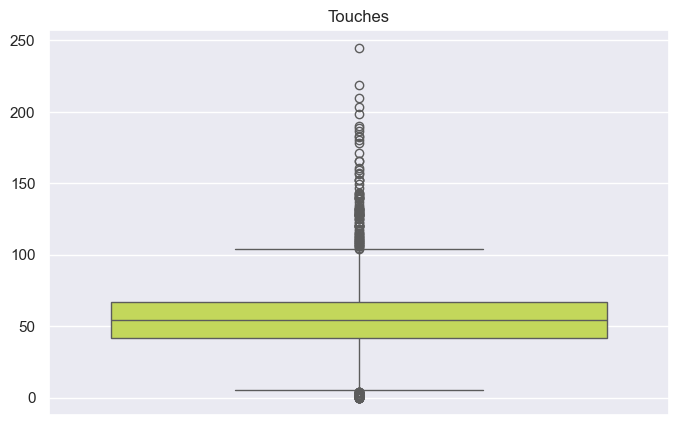

The meadian is:  2.26


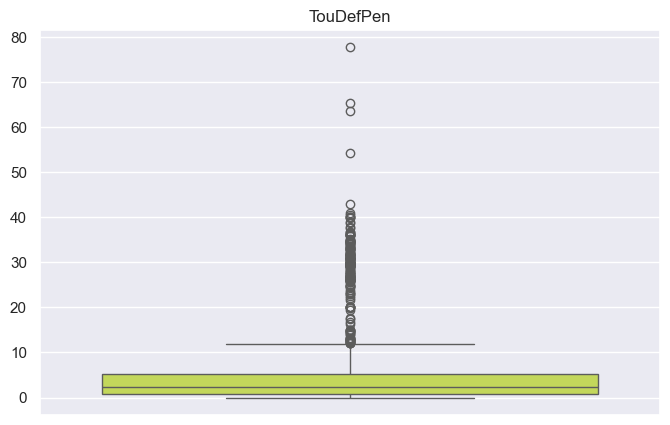

The meadian is:  13.7


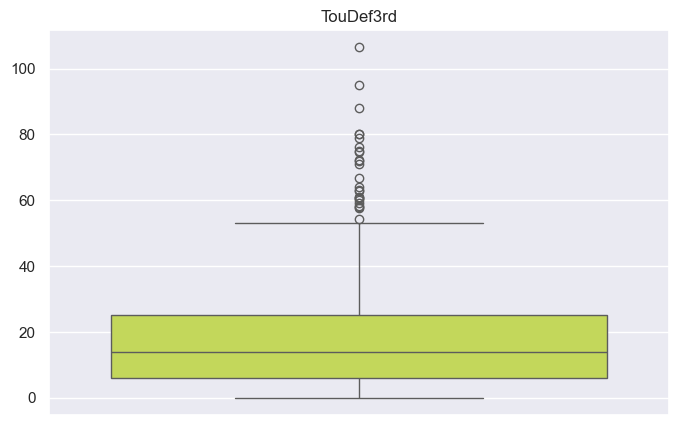

The meadian is:  24.6


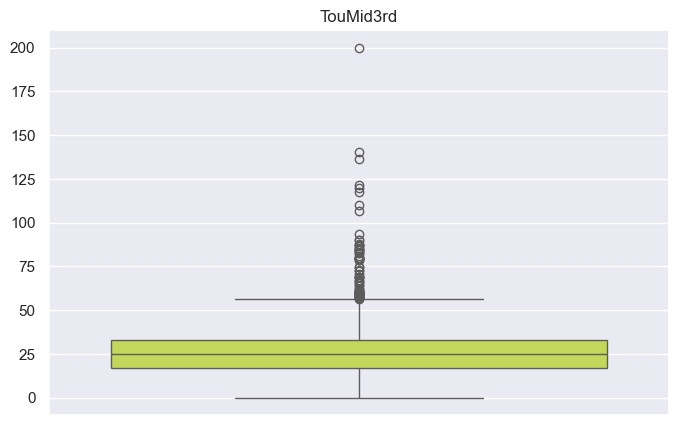

The meadian is:  14.7


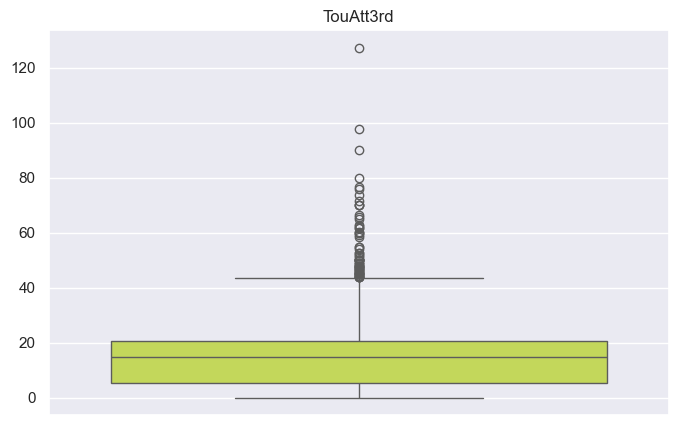

The meadian is:  1.41


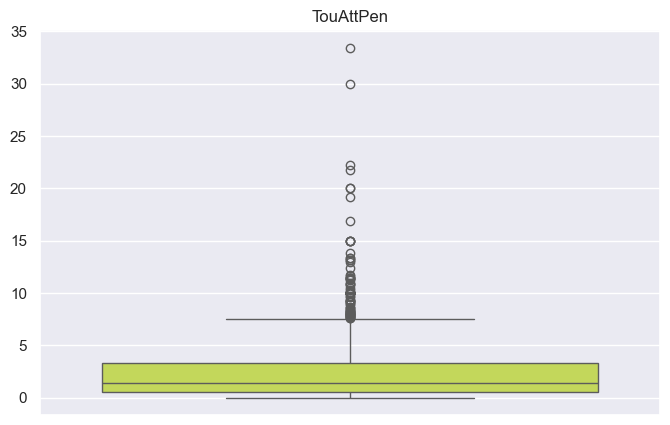

The meadian is:  54.5


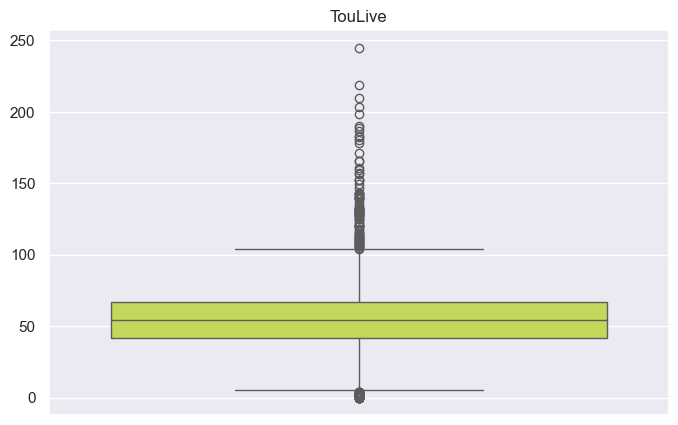

The meadian is:  1.25


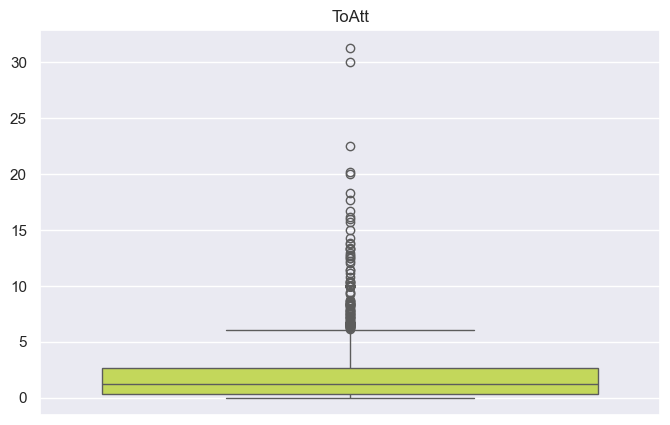

The meadian is:  0.43


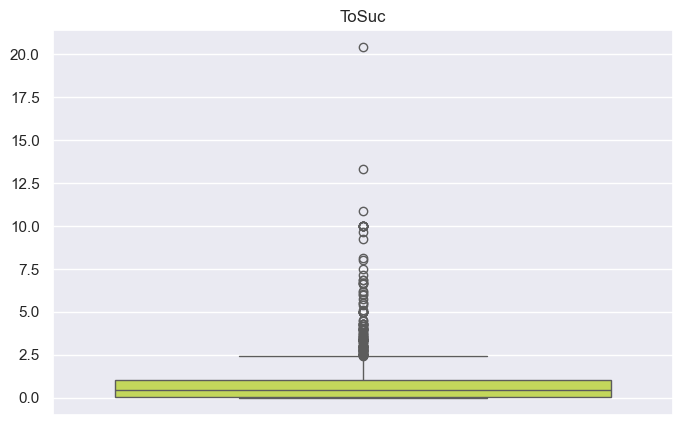

The meadian is:  34.6


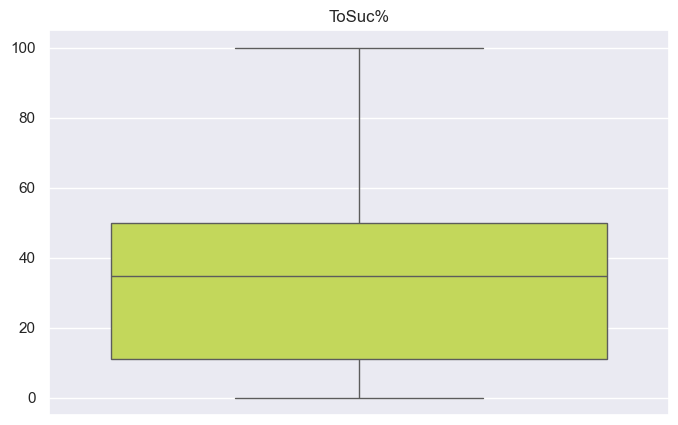

The meadian is:  0.53


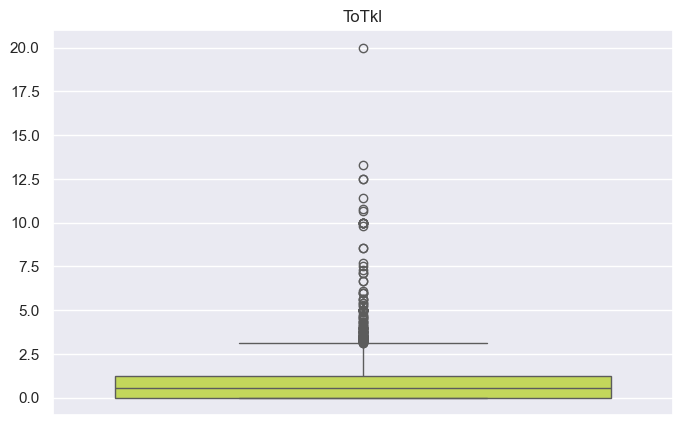

The meadian is:  41.7


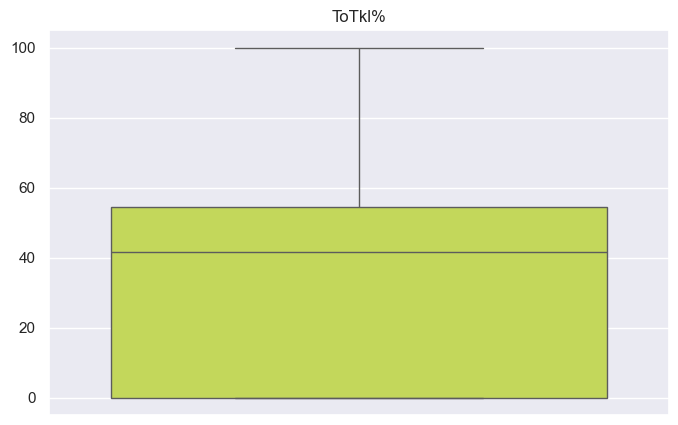

The meadian is:  30.3


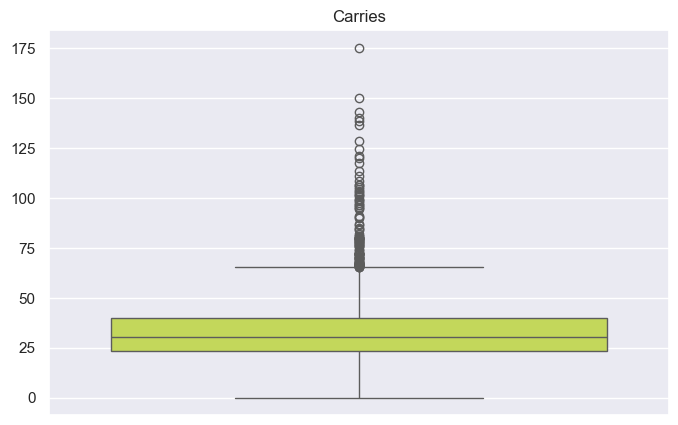

The meadian is:  160.8


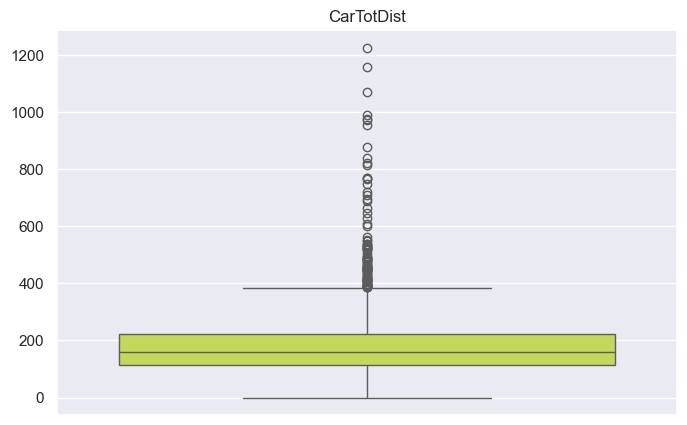

The meadian is:  76.6


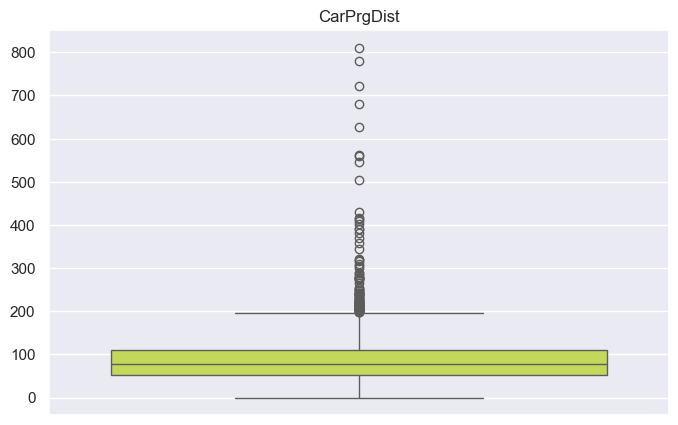

The meadian is:  1.25


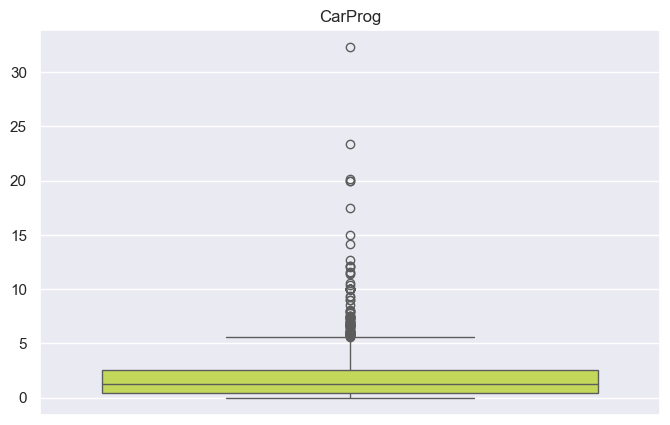

The meadian is:  1.03


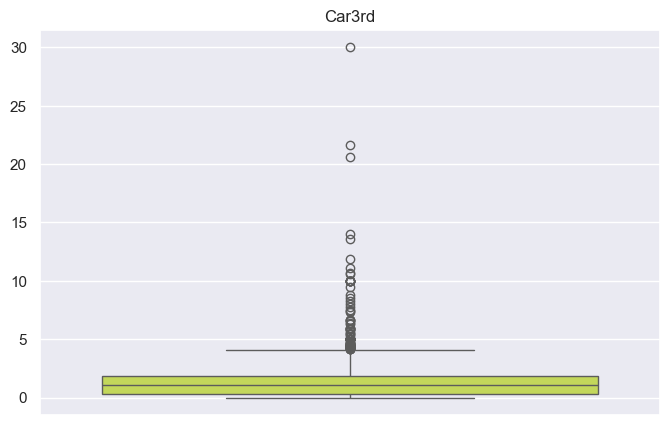

The meadian is:  0.12


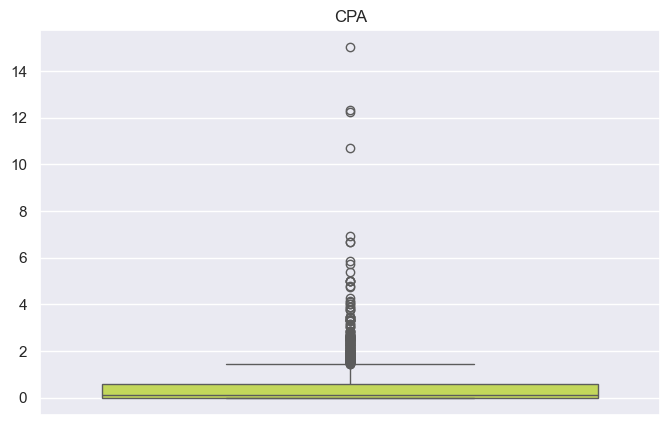

The meadian is:  1.28


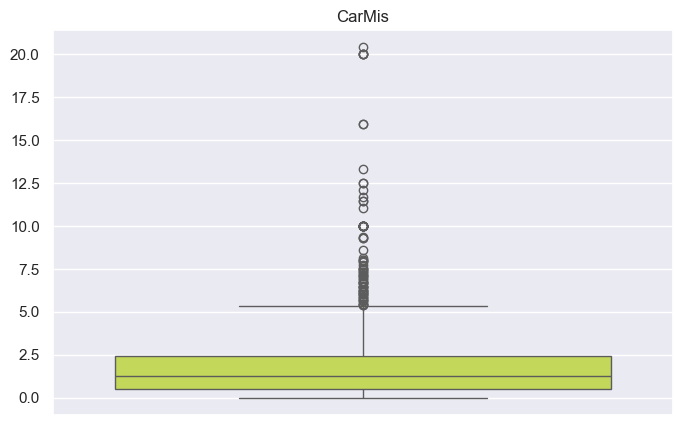

The meadian is:  0.73


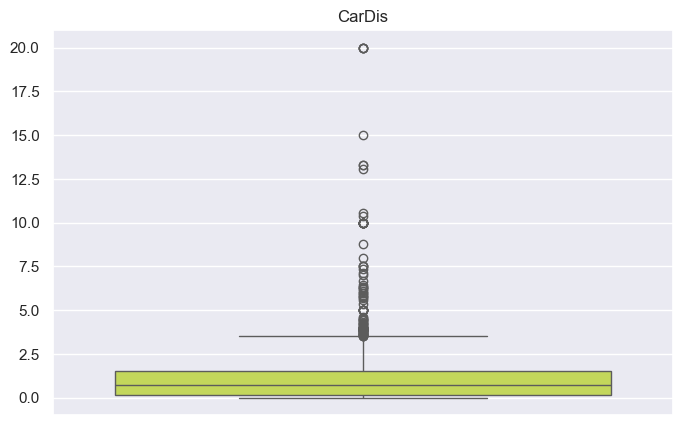

The meadian is:  33.7


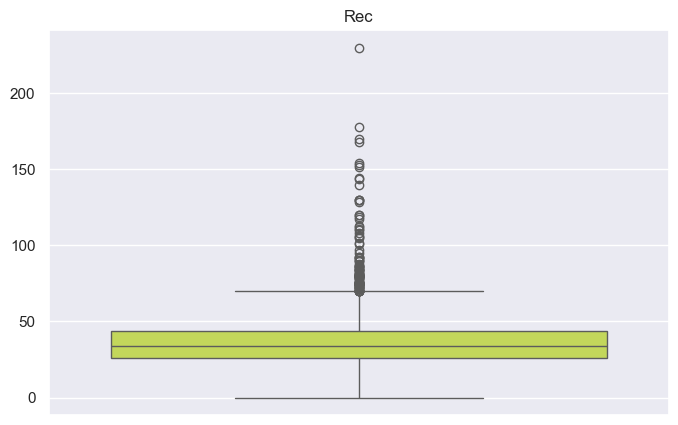

The meadian is:  3.35


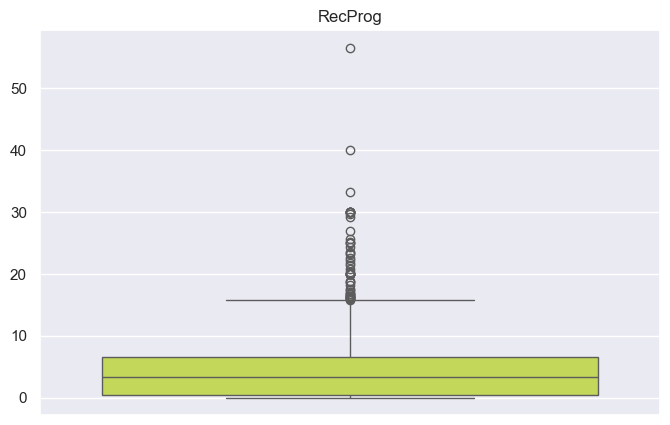

The meadian is:  0.15


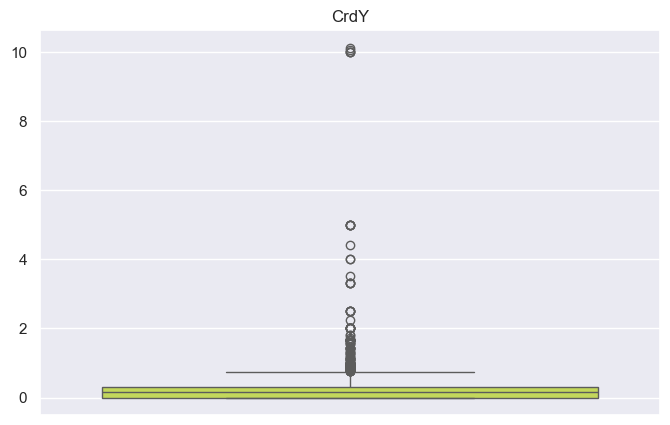

The meadian is:  0.0


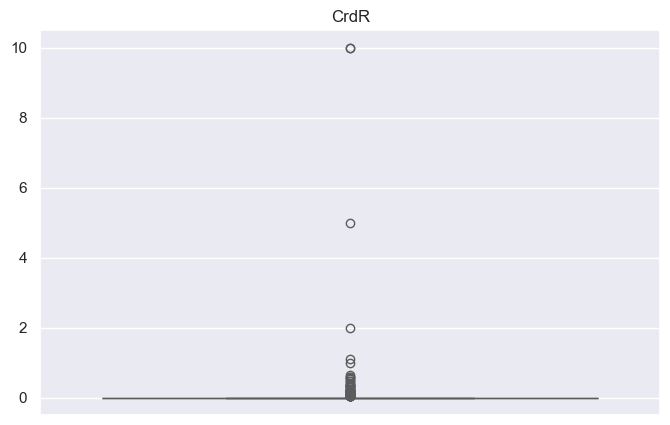

The meadian is:  0.0


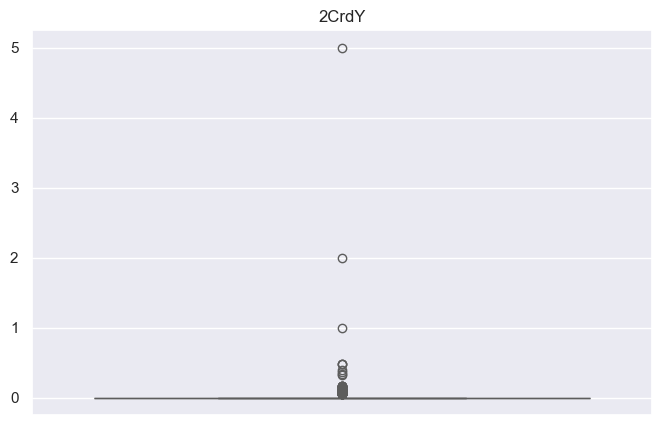

The meadian is:  1.14


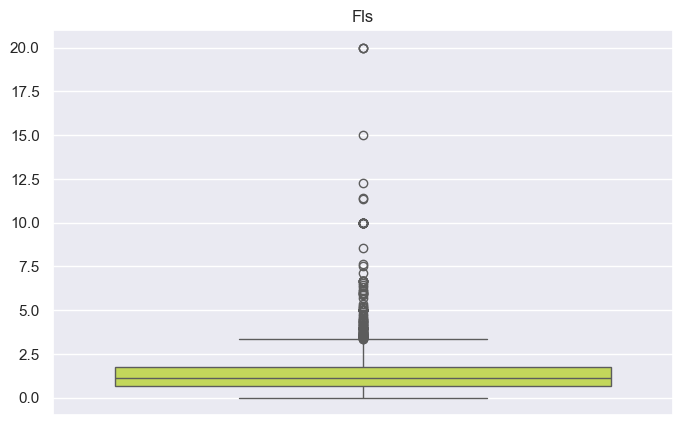

The meadian is:  0.95


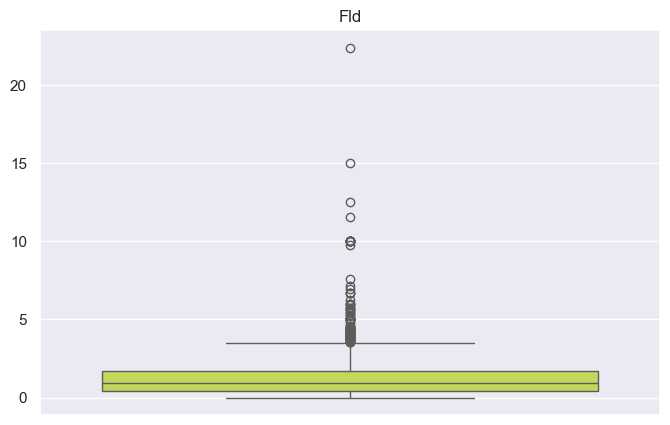

The meadian is:  0.0


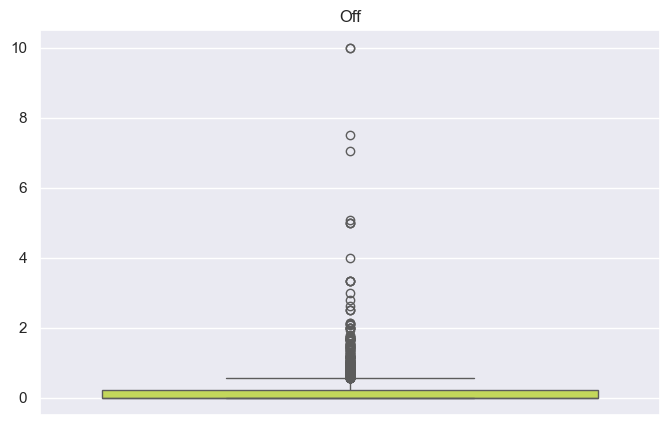

The meadian is:  0.83


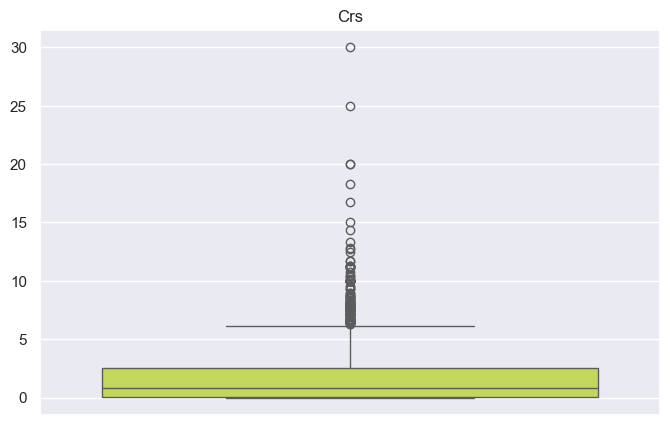

The meadian is:  0.8600000000000001


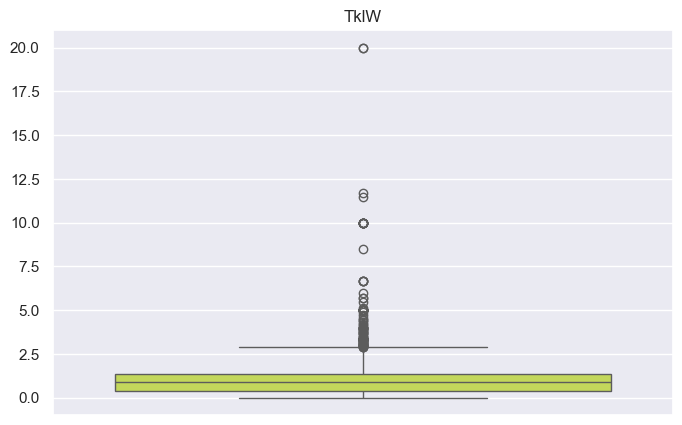

The meadian is:  0.0


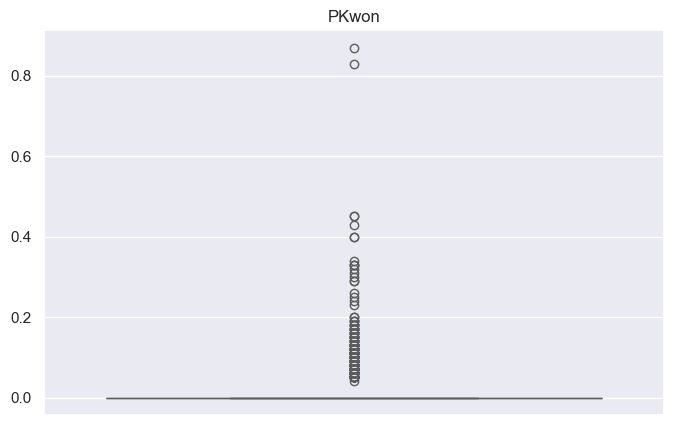

The meadian is:  0.0


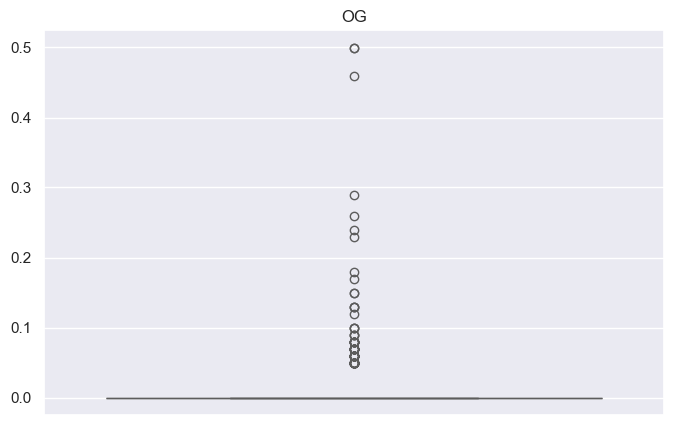

The meadian is:  5.0


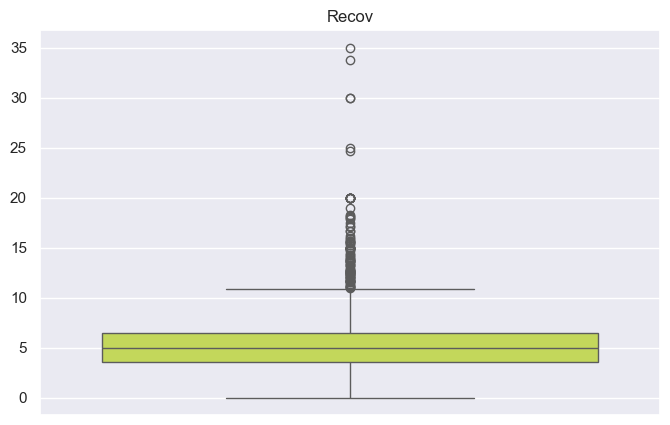

The meadian is:  0.98


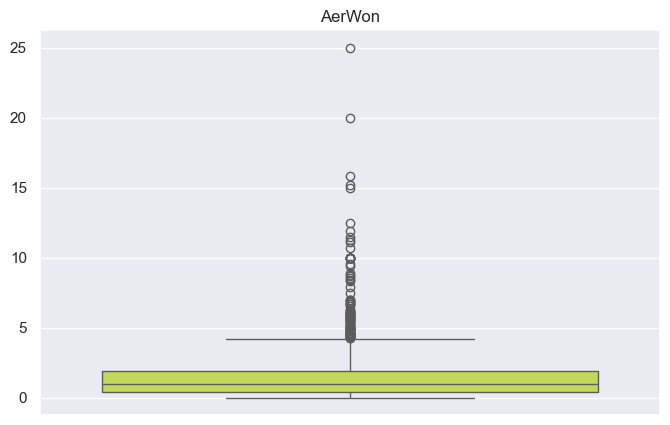

The meadian is:  1.14


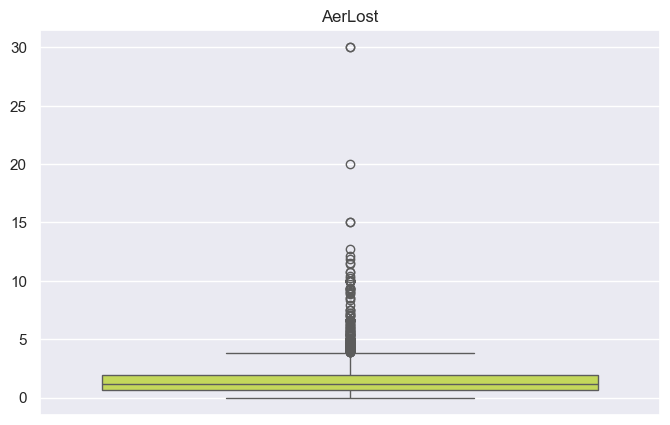

The meadian is:  4000000.0


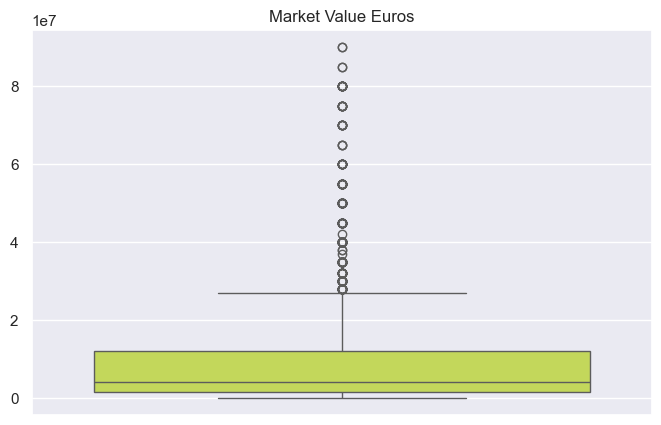

In [43]:
# Investigating the distribution of all Numerical values

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(8,5)})

for c in n_variables:    
    x = player_agg[c].values
    ax = sns.boxplot(x, color = '#D1EC46')
    print('The meadian is: ', player_agg[c].median())
    plt.title(c)
    plt.show()

### 4.4. Preparing the final DF

In [45]:
player_agg.head()

,Player,Nation,Pos,Squad,Comp,Age,MP,Starts,Min,90s,Goals,SoT,SoT%,G/Sh,G/SoT,ShoDist,ShoFK,ShoPK,PKatt,PasTotCmp,PasTotAtt,PasTotCmp%,PasTotDist,PasTotPrgDist,PasShoCmp,PasShoAtt,PasShoCmp%,PasMedCmp,PasMedAtt,PasMedCmp%,PasLonCmp,PasLonAtt,PasLonCmp%,Assists,PasAss,Pas3rd,PPA,CrsPA,PasProg,PasAtt,PasLive,PasDead,PasFK,TB,Sw,PasCrs,TI,CK,CkIn,CkOut,CkStr,PasCmp,PasOff,PasBlocks,SCA,ScaPassLive,ScaPassDead,ScaDrib,ScaSh,ScaFld,ScaDef,GCA,GcaPassLive,GcaPassDead,GcaDrib,GcaSh,GcaFld,GcaDef,Tkl,TklWon,TklDef3rd,TklMid3rd,TklAtt3rd,TklDri,TklDriAtt,TklDri%,TklDriPast,Blocks,BlkSh,BlkPass,Int,Tkl+Int,Clr,Err,Touches,TouDefPen,TouDef3rd,TouMid3rd,TouAtt3rd,TouAttPen,TouLive,ToAtt,ToSuc,ToSuc%,ToTkl,ToTkl%,Carries,CarTotDist,CarPrgDist,CarProg,Car3rd,CPA,CarMis,CarDis,Rec,RecProg,CrdY,CrdR,2CrdY,Fls,Fld,Off,Crs,TklW,PKwon,OG,Recov,AerWon,AerLost,Market Value,Market Value Euros
0,?ukasz Fabia?ski,POL,GK,West Ham,Premier League,37,22,22,1873,20.8,0,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.9,27.3,65.6,556.4,435.7,3.70,3.70,100.0,6.68,6.73,99.3,7.40,16.60,44.6,0.00,0.00,0.38,0.00,0.00,0.00,27.3,18.1,9.04,2.45,0.00,0.10,0.00,0.00,0.00,0.00,0.00,0.00,17.9,0.14,0.00,0.10,0.00,0.10,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.19,0.00,29.3,25.80,29.2,0.10,0.0,0.00,29.3,0.00,0.00,0.0,0.00,0.0,15.4,101.5,68.5,0.00,0.00,0.00,0.05,0.00,10.8,0.00,0.00,0.0,0.0,0.00,0.14,0.00,0.00,0.00,0.0,0.0,0.48,0.48,0.05,€700k,700000.0
1,?ukasz Por?ba,POL,MF,Lens,Ligue 1,22,7,3,247,2.7,0,0.00,0.0,0.0,0.0,17.1,0.00,0.0,0.0,40.0,48.5,82.4,633.0,187.0,18.10,21.50,84.5,16.30,18.90,86.3,2.96,4.44,66.7,0.37,1.85,4.44,1.85,0.74,6.67,48.5,48.1,0.37,0.37,0.00,0.00,2.22,0.00,0.00,0.00,0.00,0.00,40.0,0.00,0.37,3.33,2.96,0.00,0.0,0.0,0.00,0.37,0.74,0.37,0.0,0.0,0.0,0.0,0.37,1.85,1.48,0.74,0.37,0.74,0.74,1.11,66.7,0.37,1.11,0.00,1.11,1.11,2.96,0.74,0.00,57.8,1.11,6.3,30.70,20.7,0.37,57.8,0.74,0.37,50.0,0.37,50.0,43.0,213.7,76.3,1.11,2.96,0.00,1.85,0.37,40.7,6.67,0.37,0.0,0.0,2.96,0.74,0.00,2.22,1.48,0.0,0.0,4.07,0.74,0.37,€1.00m,1000000.0
2,?ukasz Skorupski,POL,GK,Bologna,Serie A,31,21,21,1890,21.0,0,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,26.4,34.2,77.1,706.6,494.6,4.90,4.95,99.0,11.60,11.80,98.4,8.62,16.10,53.6,0.00,0.00,0.00,0.00,0.00,0.00,34.2,24.0,10.10,2.86,0.00,0.14,0.00,0.00,0.00,0.00,0.00,0.00,26.4,0.14,0.00,0.10,0.00,0.10,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.05,0.05,0.05,0.00,0.00,0.05,0.05,100.0,0.00,0.00,0.00,0.00,0.00,0.05,0.62,0.05,36.8,33.00,36.6,0.19,0.0,0.00,36.8,0.00,0.00,0.0,0.00,0.0,19.3,99.3,67.7,0.00,0.00,0.00,0.05,0.00,15.6,0.00,0.14,0.0,0.0,0.00,0.24,0.00,0.00,0.05,0.0,0.0,1.14,0.19,0.00,€2.50m,2500000.0
3,?órir Jóhann Helgason,ISL,MF,Lecce,Serie A,22,7,2,154,1.7,0,0.00,0.0,0.0,0.0,32.3,0.59,0.0,0.0,20.6,28.2,72.9,381.2,164.7,8.24,11.20,73.7,8.24,9.41,87.5,3.53,6.47,54.5,0.00,1.76,0.59,0.00,0.00,1.18,28.2,23.5,4.71,0.59,0.00,0.00,5.29,0.00,3.53,2.94,0.59,0.00,20.6,0.00,0.00,2.35,1.18,1.18,0.0,0.0,0.00,0.00,0.59,0.59,0.0,0.0,0.0,0.0,0.00,0.59,0.59,0.00,0.00,0.59,0.59,0.59,100.0,0.00,0.59,0.00,0.59,1.18,1.76,1.18,0.00,35.9,2.35,10.0,13.50,13.5,0.00,35.9,0.00,0.00,0.0,0.00,0.0,15.3,58.8,25.3,0.59,1.18,0.00,1.76,0.59,16.5,0.00,0.00,0.0,0.0,1.18,0.59,0.00,5.29,0.59,0.0,0.0,4.71,0.00,1.76,€800k,800000.0
4,Aaron Cresswell,ENG,DF,West Ham,Premier League,33,18,17,1533,17.0,0,0.06,14.3,0.0,0.0,22.8,0.18,0.0,0.0,50.8,63.9,79.6,819.1,377.8,28.60,30.50,93.8,17.40,21.70,80.2,4.24,8.47,50.0,0.00,1.76,4.41,1.41,0.76,6.94,63.9,51.6,12.20,1.76,0.06,0.24,5.94,8.24,2.18,0.12,1.71,0.06,50.8,0.12,1.47,3.12,2.06,1.00,0.0,0.0,0.06,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.82,0.41,0.47,0.35,0.00,0.35,0.94,37.5,0.59,1.00,0.47,0.53,1.18,2.00,2.35,0.00,70.8,3.71,21.8,30.40,18.9,0.47,70.8,0.35,0.12,33.3,0.18,50.0,33.5,151.6,74.4,1.59,1.24,0.06,0.24,0.35,43.3,4.06,0.12,0.0,0.0,0.47,0.29,0.06,5.94,0.41,0.0,0.0,4.71,1.41,1.18,€700k,700000.0


In [46]:
# dropping the columns we do not need
new_player_agg = player_agg.drop(['Player', 'Market Value'], axis=1)

# Making categorical variables into numeric representation
new_player_agg = pd.get_dummies(new_player_agg, columns = ['Nation','Pos','Squad', 'Comp'])

new_player_agg.head()

,Age,MP,Starts,Min,90s,Goals,SoT,SoT%,G/Sh,G/SoT,ShoDist,ShoFK,ShoPK,PKatt,PasTotCmp,PasTotAtt,PasTotCmp%,PasTotDist,PasTotPrgDist,PasShoCmp,PasShoAtt,PasShoCmp%,PasMedCmp,PasMedAtt,PasMedCmp%,PasLonCmp,PasLonAtt,PasLonCmp%,Assists,PasAss,Pas3rd,PPA,CrsPA,PasProg,PasAtt,PasLive,PasDead,PasFK,TB,Sw,PasCrs,TI,CK,CkIn,CkOut,CkStr,PasCmp,PasOff,PasBlocks,SCA,ScaPassLive,ScaPassDead,ScaDrib,ScaSh,ScaFld,ScaDef,GCA,GcaPassLive,GcaPassDead,GcaDrib,GcaSh,GcaFld,GcaDef,Tkl,TklWon,TklDef3rd,TklMid3rd,TklAtt3rd,TklDri,TklDriAtt,TklDri%,TklDriPast,Blocks,BlkSh,BlkPass,Int,Tkl+Int,Clr,Err,Touches,TouDefPen,TouDef3rd,TouMid3rd,TouAtt3rd,TouAttPen,TouLive,ToAtt,ToSuc,ToSuc%,ToTkl,ToTkl%,Carries,CarTotDist,CarPrgDist,CarProg,Car3rd,CPA,CarMis,CarDis,Rec,RecProg,CrdY,CrdR,2CrdY,Fls,Fld,Off,Crs,TklW,PKwon,OG,Recov,AerWon,AerLost,Market Value Euros,Nation_ALB,Nation_ALG,Nation_ANG,Nation_ARG,Nation_ARM,Nation_AUS,Nation_AUT,Nation_BDI,Nation_BEL,Nation_BEN,Nation_BFA,Nation_BIH,Nation_BRA,Nation_BUL,Nation_CAN,Nation_CGO,Nation_CHI,Nation_CIV,Nation_CMR,Nation_COD,Nation_COL,Nation_COM,Nation_CPV,Nation_CRC,Nation_CRO,Nation_CTA,Nation_CYP,Nation_CZE,Nation_DEN,Nation_DOM,Nation_ECU,Nation_EGY,Nation_ENG,Nation_EQG,Nation_ESP,Nation_FIN,Nation_FRA,Nation_GAB,Nation_GAM,Nation_GEO,Nation_GER,Nation_GHA,Nation_GLP,Nation_GNB,Nation_GRE,Nation_GRN,Nation_GUF,Nation_GUI,Nation_HAI,Nation_HON,Nation_HUN,Nation_IRL,Nation_IRN,Nation_ISL,Nation_ISR,Nation_ITA,Nation_JAM,Nation_JPN,Nation_KVX,Nation_LTU,Nation_LUX,Nation_LVA,Nation_MAD,Nation_MAR,Nation_MEX,Nation_MKD,Nation_MLI,Nation_MNE,Nation_MOZ,Nation_MTQ,Nation_NED,Nation_NGA,Nation_NIR,Nation_NOR,Nation_NZL,Nation_Other,Nation_PAR,Nation_PER,Nation_PHI,Nation_POL,Nation_POR,Nation_ROU,Nation_RSA,Nation_RUS,Nation_SCO,Nation_SEN,Nation_SLE,Nation_SRB,Nation_SUI,Nation_SUR,Nation_SVK,Nation_SVN,Nation_SWE,Nation_TOG,Nation_TUN,Nation_TUR,Nation_UKR,Nation_URU,Nation_USA,Nation_UZB,Nation_VEN,Nation_WAL,Nation_ZAM,Nation_ZIM,Pos_DF,Pos_DFFW,Pos_DFMF,Pos_FW,Pos_FWDF,Pos_FWMF,Pos_GK,Pos_MF,Pos_MFDF,Pos_MFFW,Squad_Ajaccio,Squad_Almería,Squad_Angers,Squad_Arsenal,Squad_Aston Villa,Squad_Atalanta,Squad_Athletic Club,Squad_Atlético Madrid,Squad_Augsburg,Squad_Auxerre,Squad_Barcelona,Squad_Bayern Munich,Squad_Betis,Squad_Bochum,Squad_Bologna,Squad_Bournemouth,Squad_Brentford,Squad_Brest,Squad_Brighton,Squad_Celta Vigo,Squad_Chelsea,Squad_Clermont Foot,Squad_Cremonese,Squad_Crystal Palace,Squad_Cádiz,Squad_Dortmund,Squad_Eint Frankfurt,Squad_Elche,Squad_Empoli,Squad_Espanyol,Squad_Everton,Squad_Fiorentina,Squad_Freiburg,Squad_Fulham,Squad_Getafe,Squad_Girona,Squad_Hellas Verona,Squad_Hertha BSC,Squad_Hoffenheim,Squad_Inter,Squad_Juventus,Squad_Köln,Squad_Lazio,Squad_Lecce,Squad_Leeds United,Squad_Leicester City,Squad_Lens,Squad_Leverkusen,Squad_Lille,Squad_Liverpool,Squad_Lorient,Squad_Lyon,Squad_M'Gladbach,Squad_Mainz 05,Squad_Mallorca,Squad_Manchester City,Squad_Manchester Utd,Squad_Marseille,Squad_Milan,Squad_Monaco,Squad_Montpellier,Squad_Monza,Squad_Nantes,Squad_Napoli,Squad_Newcastle Utd,Squad_Nice,Squad_Nott'ham Forest,Squad_Osasuna,Squad_Paris S-G,Squad_RB Leipzig,Squad_Rayo Vallecano,Squad_Real Madrid,Squad_Real Sociedad,Squad_Reims,Squad_Rennes,Squad_Roma,Squad_Salernitana,Squad_Sampdoria,Squad_Sassuolo,Squad_Schalke 04,Squad_Sevilla,Squad_Southampton,Squad_Spezia,Squad_Strasbourg,Squad_Stuttgart,Squad_Torino,Squad_Tottenham,Squad_Toulouse,Squad_Troyes,Squad_Udinese,Squad_Union Berlin,Squad_Valencia,Squad_Valladolid,Squad_Villarreal,Squad_Werder Bremen,Squad_West Ham,Squad_Wolfsburg,Squad_Wolves,Comp_Bundesliga,Comp_La Liga,Comp_Ligue 1,Comp_Premier League,Comp_Serie A
0,37,22,22,1873,20.8,0,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.9,27.3,65.6,556.4,435.7,3.70,3.70,100.0,6.68,6.73,99.3,7.40,16.60,44.6,0.00,0.00,0.38,0.00,0.00,0.00,27.3,18.1,9.04,2.45,0.00,0.10,0.00,0.00,0.00,0.00,0.00,0.00,17.9,0.14,0.00,0.10,0.00,0.10,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0

### 4.5. Correlation & Feature Importances

In [48]:
n_variables[0:25]

Index(['Age', 'MP', 'Starts', 'Min', '90s', 'Goals', 'SoT', 'SoT%', 'G/Sh',
       'G/SoT', 'ShoDist', 'ShoFK', 'ShoPK', 'PKatt', 'PasTotCmp', 'PasTotAtt',
       'PasTotCmp%', 'PasTotDist', 'PasTotPrgDist', 'PasShoCmp', 'PasShoAtt',
       'PasShoCmp%', 'PasMedCmp', 'PasMedAtt', 'PasMedCmp%'],
      dtype='object')

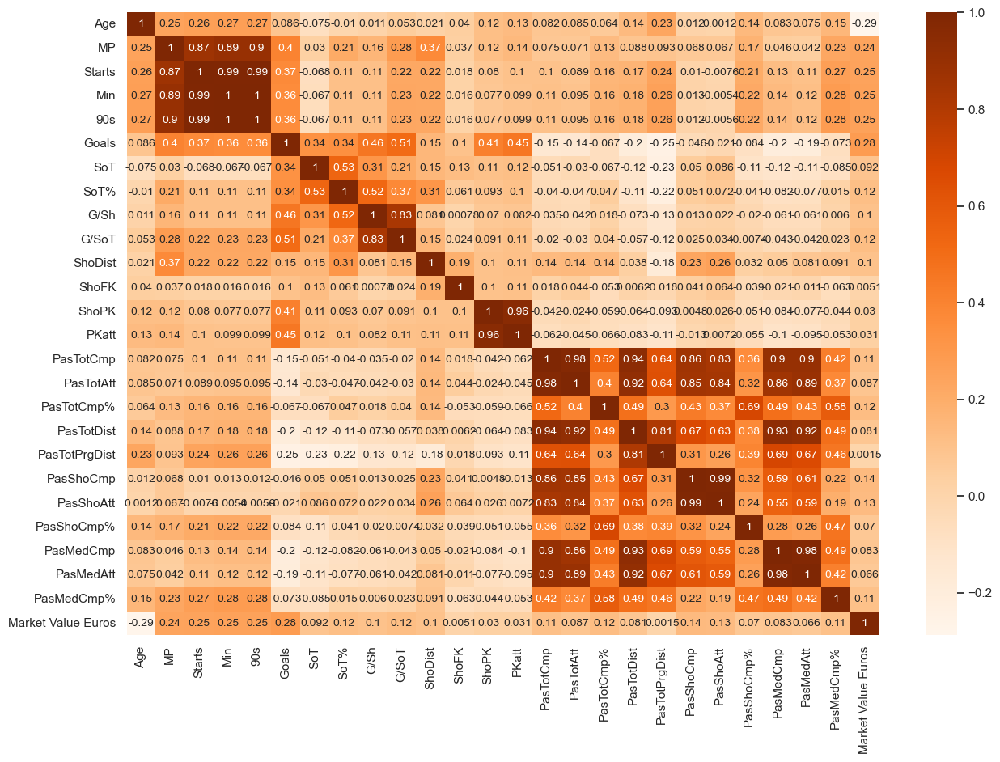

In [49]:
## Correlations with Heatmap

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(15,10)})

# n_variables[:25]
n_variables1 = ['Age', 'MP', 'Starts', 'Min', '90s', 'Goals', 'SoT', 'SoT%', 'G/Sh',
       'G/SoT', 'ShoDist', 'ShoFK', 'ShoPK', 'PKatt', 'PasTotCmp', 'PasTotAtt',
       'PasTotCmp%', 'PasTotDist', 'PasTotPrgDist', 'PasShoCmp', 'PasShoAtt',
       'PasShoCmp%', 'PasMedCmp', 'PasMedAtt', 'PasMedCmp%', 'Market Value Euros']

pc = new_player_agg[n_variables1].corr(method ='pearson')

cols = n_variables1

ax = sns.heatmap(pc, annot=True,
                 yticklabels=cols,
                 xticklabels=cols,
                 annot_kws={'size':10},
                 cmap="Oranges")

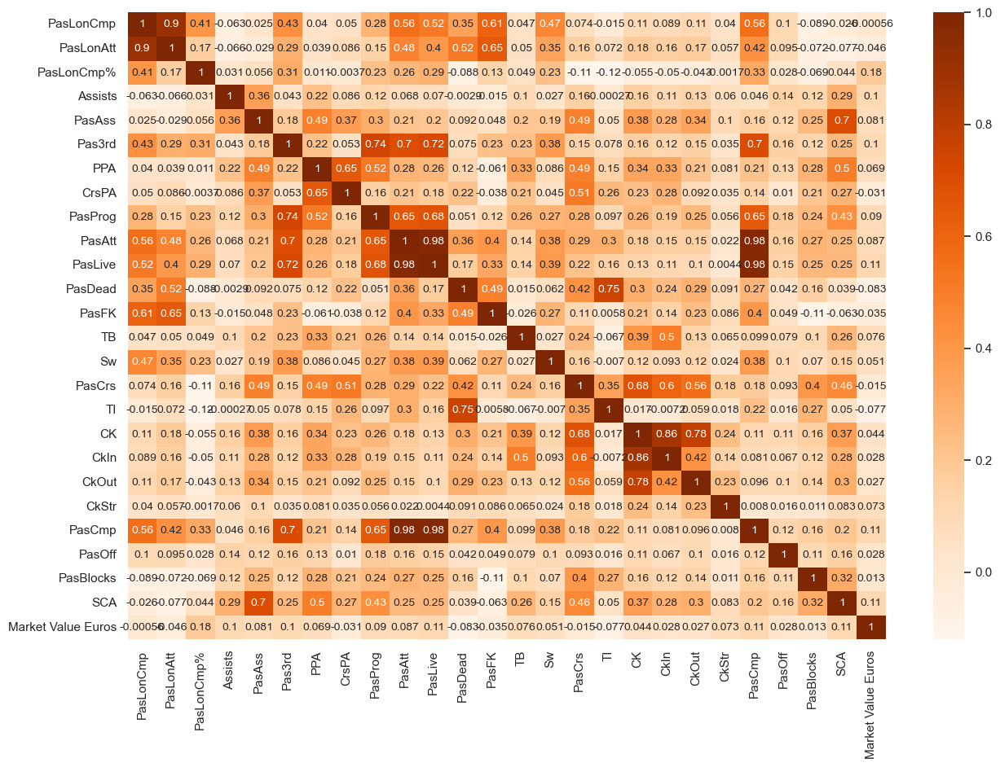

In [50]:
## Correlations with Heatmap

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(15,10)})

# n_variables[25:50]
n_variables1 = ['PasLonCmp', 'PasLonAtt', 'PasLonCmp%', 'Assists', 'PasAss', 'Pas3rd',
       'PPA', 'CrsPA', 'PasProg', 'PasAtt', 'PasLive', 'PasDead', 'PasFK',
       'TB', 'Sw', 'PasCrs', 'TI', 'CK', 'CkIn', 'CkOut', 'CkStr', 'PasCmp',
       'PasOff', 'PasBlocks', 'SCA', 'Market Value Euros']

pc = new_player_agg[n_variables1].corr(method ='pearson')

cols = n_variables1

ax = sns.heatmap(pc, annot=True,
                 yticklabels=cols,
                 xticklabels=cols,
                 annot_kws={'size':10},
                 cmap="Oranges")

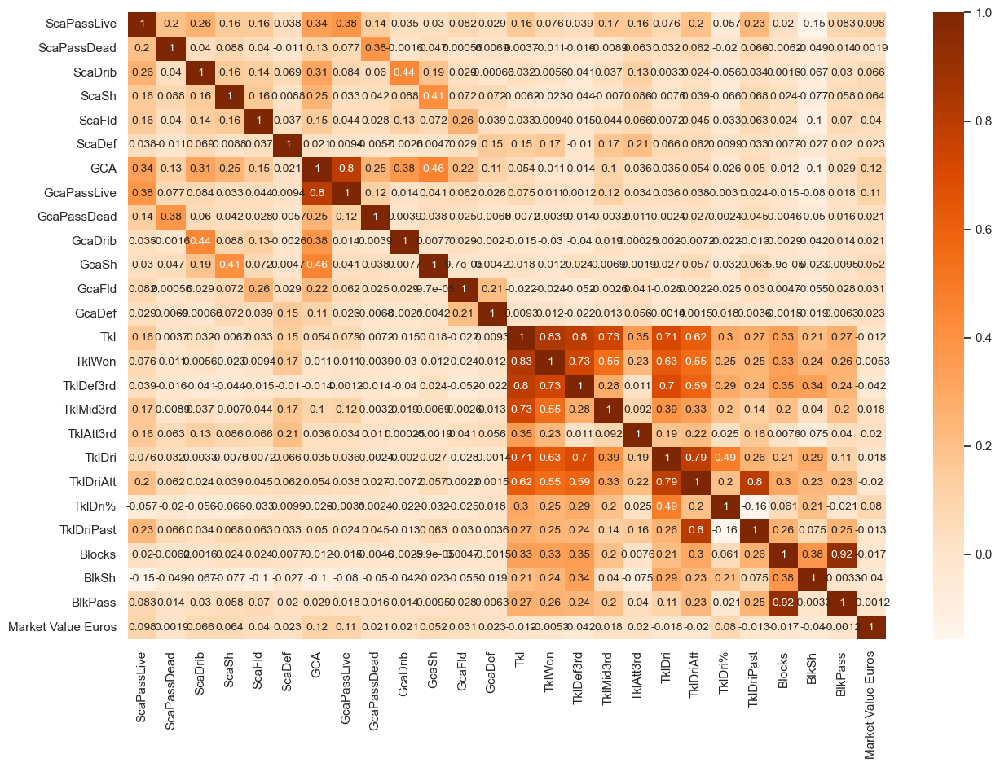

In [51]:
## Correlations with Heatmap

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(15,10)})

# n_variables[50:75]
n_variables1 = ['ScaPassLive', 'ScaPassDead', 'ScaDrib', 'ScaSh', 'ScaFld', 'ScaDef',
       'GCA', 'GcaPassLive', 'GcaPassDead', 'GcaDrib', 'GcaSh', 'GcaFld',
       'GcaDef', 'Tkl', 'TklWon', 'TklDef3rd', 'TklMid3rd', 'TklAtt3rd',
       'TklDri', 'TklDriAtt', 'TklDri%', 'TklDriPast', 'Blocks', 'BlkSh',
       'BlkPass', 'Market Value Euros']

pc = new_player_agg[n_variables1].corr(method ='pearson')

cols = n_variables1

ax = sns.heatmap(pc, annot=True,
                 yticklabels=cols,
                 xticklabels=cols,
                 annot_kws={'size':10},
                 cmap="Oranges")

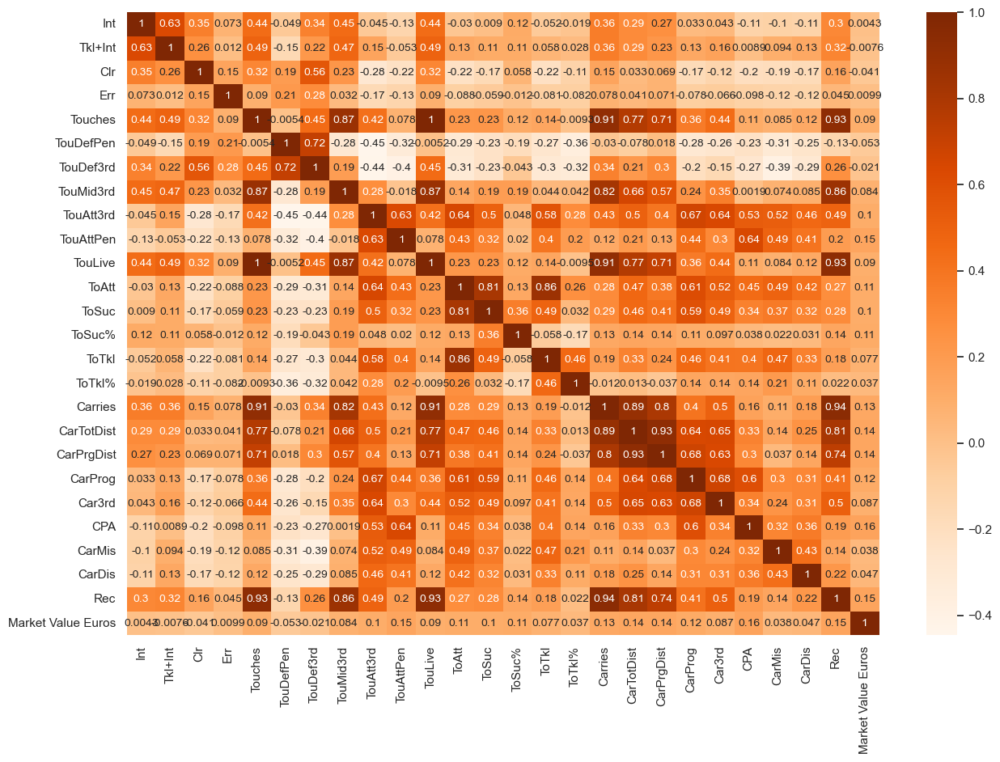

In [52]:
## Correlations with Heatmap

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(15,10)})

# n_variables[75:100]
n_variables1 = ['Int', 'Tkl+Int', 'Clr', 'Err', 'Touches', 'TouDefPen', 'TouDef3rd',
       'TouMid3rd', 'TouAtt3rd', 'TouAttPen', 'TouLive', 'ToAtt', 'ToSuc',
       'ToSuc%', 'ToTkl', 'ToTkl%', 'Carries', 'CarTotDist', 'CarPrgDist',
       'CarProg', 'Car3rd', 'CPA', 'CarMis', 'CarDis', 'Rec', 'Market Value Euros']

pc = new_player_agg[n_variables1].corr(method ='pearson')

cols = n_variables1

ax = sns.heatmap(pc, annot=True,
                 yticklabels=cols,
                 xticklabels=cols,
                 annot_kws={'size':10},
                 cmap="Oranges")

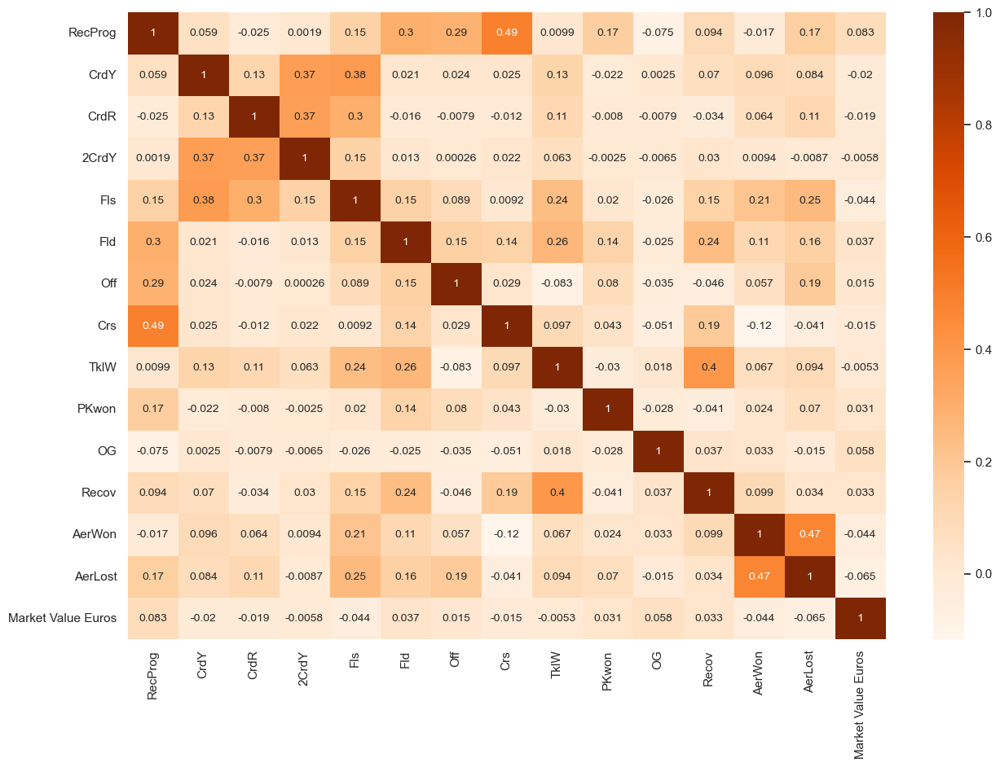

In [53]:
## Correlations with Heatmap

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(15,10)})

n_variables1 = n_variables[100:]

pc = new_player_agg[n_variables1].corr(method ='pearson')

cols = n_variables1

ax = sns.heatmap(pc, annot=True,
                 yticklabels=cols,
                 xticklabels=cols,
                 annot_kws={'size':10},
                 cmap="Oranges")

### Feature Importance

Steps of Running Feature Importance
- Split the data into X & y
- Run a Tree-based estimators (i.e. decision trees & random forests)
- Run Feature Importance

- We measure the importance of a feature by calculating the increase in the model’s prediction error after permuting the feature
- More info: https://christophm.github.io/interpretable-ml-book/feature-importance.html

In [55]:
# Split the data into X & y

X = new_player_agg.drop(['Market Value Euros'], axis = 1).values
X_columns = new_player_agg.drop(['Market Value Euros'], axis = 1)
y = new_player_agg['Market Value Euros'].astype(int)

print(X.shape)
print(y.shape)

# Run a Tree-based estimators (i.e. decision trees & random forests)

dt = DecisionTreeClassifier(random_state=15, criterion  = 'entropy', max_depth = 10)
dt.fit(X,y)

print('Score', dt.score(X, y))
# If you want to learn how Decesion Trees work, read here: https://www.datacamp.com/community/tutorials/decision-tree-classification-python
# Official Doc: https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

(2309, 331)
(2309,)
Score 0.635339974014725


In [89]:
# Calculate Feature Importance (FI)
for i, column in enumerate(new_player_agg.drop('Market Value Euros', axis=1)):
    fi = pd.DataFrame({'Variable': [column], 'Feature Importance Score': [dt.feature_importances_[i]]})
    
    try:
        final_fi = pd.concat([final_fi, fi], ignore_index=True)
    except:
        final_fi = fi

# Ordering the data
final_fi = final_fi.sort_values('Feature Importance Score', ascending=False).reset_index(drop=True)

# ✅ Restoring the Players Column at the End
new_player_agg['Player'] = player_agg['Player']  # Ensure you have the original dataset
final_fi['Player'] = new_player_agg['Player']

# Display Top Features
final_fi.head()


,index,Variable,Feature Importance Score,Player
0,0.0,Age,0.073382,?ukasz Fabia?ski
1,NaN,Age,0.073382,?ukasz Por?ba
2,NaN,Age,0.073382,?ukasz Skorupski
3,3.0,Min,0.045299,?órir Jóhann Helgason
4,NaN,Min,0.045299,Aaron Cresswell


## 5. Running XGBoost

In [99]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# 3. Split Data into Train and Test Sets (Holdout Method)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 4. Initialize XGBoost Regressor
xgb_model = XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3)

# 5. Train the Model
xgb_model.fit(X_train, y_train)

# 6. Make Predictions
y_pred = xgb_model.predict(X_test)

# 7. Evaluate the Model
mse = mean_squared_error(y_test, y_pred)
r2_train = xgb_model.score(X_train, y_train)
r2_test = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score on Training: {r2_train}")
print(f"R^2 Score on Test: {r2_test}")

Mean Squared Error: 94909001984103.62
R^2 Score on Training: 0.701371750716334
R^2 Score on Test: 0.44419490712159215


In [101]:
import numpy as np
import xgboost as xgb

# ✅ Ensure Player column is restored after feature importance calculation
new_player_agg['Player'] = player_agg['Player']  

# ✅ Splitting Data for Training
X = new_player_agg.drop(['Market Value Euros', 'Player'], axis=1)
y = new_player_agg['Market Value Euros']

# ✅ Train the XGBoost Model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42)
xgb_model.fit(X, y)

# ✅ Function to Predict Market Value and Find Similar Players
def predict_market_value_and_find_similar(player_data, trained_model, dataset, threshold=500000):
    """
    Predicts Market Value and finds players with a close Market Value.

    Parameters:
    - player_data: Player stats (single row) for prediction.
    - trained_model: The trained XGBoost model.
    - dataset: Original dataset with 'Player' and 'Market Value Euros'.
    - threshold: Value range to find similar players.

    Returns:
    - Predicted market value and a list of similar players.
    """
    # Ensure player_data is in the right format
    player_data = np.array(player_data).reshape(1, -1)

    # Predict Market Value
    predicted_value = trained_model.predict(player_data)[0]
    
    # Find players with similar Market Value
    similar_players = dataset[
        (dataset['Market Value Euros'] >= predicted_value - threshold) & 
        (dataset['Market Value Euros'] <= predicted_value + threshold)
    ][['Player', 'Market Value Euros']]

    return predicted_value, similar_players

# ✅ Example Usage
# Assume 'player_features' is the feature vector for the player to predict
player_features = X.iloc[0]  # Example: Using first player's stats
predicted_value, similar_players = predict_market_value_and_find_similar(player_features, xgb_model, new_player_agg)

print(f"Predicted Market Value: €{predicted_value:,.2f}")
print("Players with Similar Market Value:")
print(similar_players)


Predicted Market Value: €402,224.12
Players with Similar Market Value:
                          Player  Market Value Euros
0               ?ukasz Fabia?ski            700000.0
3          ?órir Jóhann Helgason            800000.0
4                Aaron Cresswell            700000.0
7                   Aaron Ramsey            800000.0
16            Abdoul Kader Bamba            750000.0
17               Abdoulaye Bamba            350000.0
19                    Abdu Conté            800000.0
27                  Adam Forshaw            300000.0
29                  Adam Lallana            900000.0
41                  Adrian Grbi?            900000.0
42                  Adrien Hunou            500000.0
47             Agustín Marchesín            700000.0
48                 Agustín Rogel            600000.0
56                 Ajdin Hrustic            400000.0
58             Alan Do Marcolino            150000.0
64             Alberto Del Moral            800000.0
67                 Alberto P

In [103]:
import numpy as np
import pandas as pd
import xgboost as xgb
import streamlit as st

# ✅ Ensure Player column is restored
new_player_agg['Player'] = player_agg['Player']  

# ✅ Splitting Data for Training
X = new_player_agg.drop(['Market Value Euros', 'Player'], axis=1)
y = new_player_agg['Market Value Euros']

# ✅ Train the XGBoost Model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42)
xgb_model.fit(X, y)

# ✅ Streamlit App for Player Selection & Viewing Stats
st.title("SPAS - Player Market Value & Stats")

# Select a player from the list
selected_player = st.selectbox("Choose a Player", new_player_agg['Player'].unique())

# Find the selected player's stats
player_stats = new_player_agg[new_player_agg['Player'] == selected_player].drop(columns=['Player'])

# Display player stats
st.subheader(f"Stats for {selected_player}")
st.dataframe(player_stats)

# ✅ Predict Market Value & Find Similar Players
player_features = player_stats.drop(columns=['Market Value Euros'])
predicted_value = xgb_model.predict(player_features)[0]

# Find players with similar market value
threshold = 500000
similar_players = new_player_agg[
    (new_player_agg['Market Value Euros'] >= predicted_value - threshold) & 
    (new_player_agg['Market Value Euros'] <= predicted_value + threshold)
][['Player', 'Market Value Euros']]

# Display predictions & similar players
st.subheader(f"Predicted Market Value: €{predicted_value:,.2f}")
st.subheader("Players with Similar Market Value")
st.dataframe(similar_players)


2025-03-21 11:00:30.038 
  command:

    streamlit run C:\Users\User\anaconda3\Lib\site-packages\ipykernel_launcher.py [ARGUMENTS]


DeltaGenerator()

In [123]:
import shap
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Assuming `new_player_agg` is the dataset with player stats
target = 'Market Value Euros'
features = ['Goals', 'Min', 'MP', 'Starts', 'Assists', 'Touches', 'PasAss', '90s']

# Encoding player names
le = LabelEncoder()
new_player_agg['Player'] = le.fit_transform(new_player_agg['Player'])
X = new_player_agg[features]
y = new_player_agg[target]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train XGBoost model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100)
xgb_model.fit(X_train, y_train)

# Initialize SHAP explainer
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_test)

# Player comparison function
def compare_players(player1, player2):
    p1_stats = new_player_agg[new_player_agg['Player'] == player1][features].values[0]
    p2_stats = new_player_agg[new_player_agg['Player'] == player2][features].values[0]
    
    comparison_df = pd.DataFrame({'Stat': features, player1: p1_stats, player2: p2_stats})
    comparison_df.set_index('Stat', inplace=True)
    
    # Visualization
    comparison_df.plot(kind='bar', figsize=(10, 6), colormap='coolwarm')
    plt.title(f'{player1} vs {player2} - Performance Comparison')
    plt.ylabel('Value')
    plt.show()

# SHAP explanation function
def explain_player(player_name):
    player_data = new_player_agg[new_player_agg['Player'] == player_name][features]
    player_index = new_player_agg[new_player_agg['Player'] == player_name].index[0]
    
    shap.force_plot(explainer.expected_value, shap_values[player_index, :], player_data)
    shap.summary_plot(shap_values, X_test, feature_names=features)
    
    # Strengths & Weaknesses
    importance = pd.DataFrame({'Feature': features, 'SHAP Value': shap_values[player_index]}).sort_values(by='SHAP Value', ascending=False)
    print(f"\n{player_name}'s Strengths:")
    print(importance.head(3))
    print(f"\n{player_name} Needs Improvement In:")
    print(importance.tail(3))



## 6. Hyperparameter Tuning

In [125]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Define the parameter grid for hyperparameter tuning
param_dist = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 0.1, 0.2]
}

# Step 2: Initialize the XGBRegressor
xgb_model = XGBRegressor(objective='reg:squarederror')

# Step 3: Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_dist,
    scoring='neg_mean_squared_error',
    n_iter=20,  # Number of random configurations to test
    cv=5,  # 5-fold cross-validation
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# Step 4: Perform RandomizedSearchCV
random_search.fit(X_train, y_train)

# Step 5: Extract the best parameters and train the model
best_params = random_search.best_params_
print("Best Parameters:", best_params)

# Step 6: Evaluate the best model on the test set
best_model = random_search.best_estimator_
y_pred_tuned = best_model.predict(X_test)
all_df_predict = best_model.predict(X)

# Calculate metrics
mse_tuned = mean_squared_error(y_test, y_pred_tuned)
r2_tuned = r2_score(y_test, y_pred_tuned)

print(f"Test Set MSE (Tuned): {mse_tuned}")
print(f"R^2 Score on Training: {best_model.score(X_train, y_train)}")
print(f"R^2 Score on Test: {r2_tuned}")

feature_impo_df = pd.DataFrame({'Variable': X_columns.columns, 'Feature Importance Score': best_model.feature_importances_})

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best Parameters: {'subsample': 1.0, 'n_estimators': 200, 'max_depth': 3, 'learning_rate': 0.01, 'gamma': 0, 'colsample_bytree': 0.8}
Test Set MSE (Tuned): 144974040448439.1
R^2 Score on Training: 0.1948923138932278
R^2 Score on Test: 0.15100455876778995


ValueError: All arrays must be of the same length

In [127]:
# Step 1: Filter features with 'Feature Importance Score' > 0
selected_features = feature_impo_df[feature_impo_df["Feature Importance Score"] > 0]["Variable"].unique()
print("Selected Features for Rerun:", selected_features)

# Step 2: Recreate X and y
X = new_player_agg[selected_features]  # Use only selected features
y = new_player_agg["Market Value Euros"]  # Target variable

# Step 3: Split Data into Train and Test Sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 4: Retrain the Model
xgb_model_selected = XGBRegressor(objective='reg:squarederror', **best_params)
xgb_model_selected.fit(X_train, y_train)

# Step 5: Evaluate the Model on Train and Test Sets
y_train_pred = xgb_model_selected.predict(X_train)
y_test_pred = xgb_model_selected.predict(X_test)

# Calculate Metrics
mse_train = mean_squared_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print Metrics
print("Training Metrics:")
print(f"Train Set MSE: {mse_train}")
print(f"Train Set R² Score: {r2_train}")

print("\nTesting Metrics:")
print(f"Test Set MSE: {mse_test}")
print(f"Test Set R² Score: {r2_test}")

Selected Features for Rerun: ['Age' 'MP' 'Starts' 'Min' '90s' 'Goals' 'SoT' 'SoT%' 'G/Sh' 'G/SoT'
 'ShoDist' 'ShoFK' 'ShoPK' 'PKatt' 'PasTotCmp' 'PasTotAtt' 'PasTotCmp%'
 'PasTotDist' 'PasTotPrgDist' 'PasShoCmp' 'PasShoAtt' 'PasShoCmp%'
 'PasMedCmp' 'PasMedAtt' 'PasMedCmp%' 'PasLonCmp' 'PasLonAtt' 'PasLonCmp%'
 'Assists' 'PasAss' 'Pas3rd' 'PPA' 'CrsPA' 'PasProg' 'PasLive' 'PasDead'
 'PasFK' 'TB' 'Sw' 'PasCrs' 'TI' 'CK' 'CkIn' 'CkOut' 'CkStr' 'PasOff'
 'PasBlocks' 'SCA' 'ScaPassLive' 'ScaPassDead' 'ScaDrib' 'ScaSh' 'ScaFld'
 'ScaDef' 'GCA' 'GcaPassLive' 'GcaPassDead' 'GcaDrib' 'GcaFld' 'GcaDef'
 'Tkl' 'TklWon' 'TklDef3rd' 'TklMid3rd' 'TklAtt3rd' 'TklDri' 'TklDriAtt'
 'TklDri%' 'TklDriPast' 'Blocks' 'BlkSh' 'BlkPass' 'Int' 'Tkl+Int' 'Clr'
 'Err' 'Touches' 'TouDefPen' 'TouDef3rd' 'TouMid3rd' 'TouAtt3rd'
 'TouAttPen' 'ToAtt' 'ToSuc' 'ToSuc%' 'ToTkl' 'ToTkl%' 'Carries'
 'CarTotDist' 'CarPrgDist' 'CarProg' 'Car3rd' 'CPA' 'CarMis' 'CarDis'
 'Rec' 'RecProg' 'CrdY' '2CrdY' 'Fls' 'Fld' 'Off' 'PK

In [129]:
X_train = X_train.apply(pd.to_numeric, errors='coerce')
X_test = X_test.apply(pd.to_numeric, errors='coerce')


Ways to Improve:
- Remove more outliers
- Run model per League or per Pos

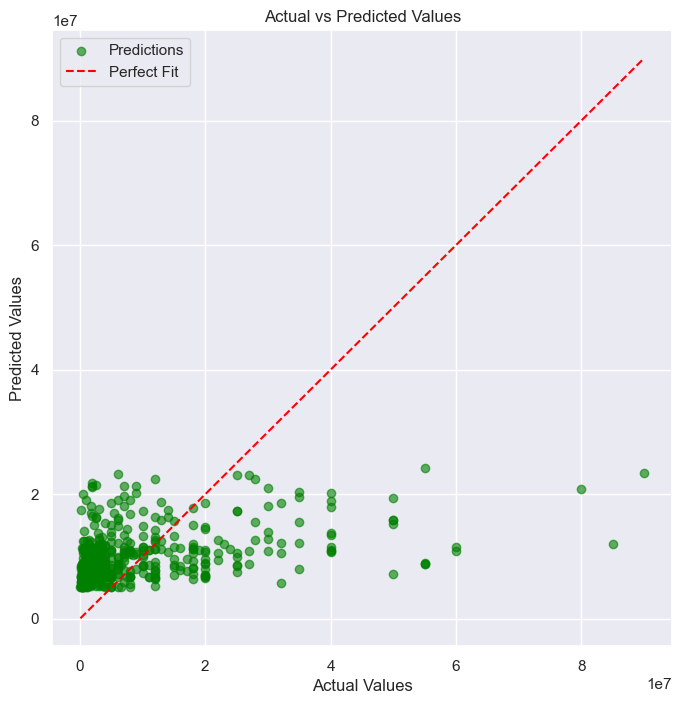

In [132]:
# Scatter plot for Actuals vs Predictions
plt.figure(figsize=(8, 8))
plt.scatter(y_test, y_pred_tuned, alpha=0.6, color='green', label='Predictions')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', label='Perfect Fit')  # Reference line
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values")
plt.legend()
plt.grid(True)
plt.show()

## 7. Storing Our Model & Results

In [134]:
# Save the trained model to a file
model_filename = "xgb_final_trained_model.pkl"
with open(model_filename, "wb") as file:
    pickle.dump(xgb_model_selected, file)

print(f"Model saved to {model_filename}")

Model saved to xgb_final_trained_model.pkl


In [136]:
# Storing the Feature Importances
feature_impo_df['Feature Importance Score'] = feature_impo_df['Feature Importance Score'].round(4)
feature_impo_df = final_fi.head(27)
feature_impo_df.to_excel("feature_importance.xlsx")

In [138]:
# Adding the predicted values
player_agg = player_agg.copy()
player_agg['MSRP Predictions'] = all_df_predict
    
# Expoprting all the data with predictions
player_agg.to_excel("player_data_with_pred.xlsx")

## 8. Building the Streamlit app

In [140]:
%whos


Variable                                Type                      Data/Info
---------------------------------------------------------------------------
BeautifulSoup                           type                      <class 'bs4.BeautifulSoup'>
DecisionTreeClassifier                  ABCMeta                   <class 'sklearn.tree._cla<...>.DecisionTreeClassifier'>
LabelEncoder                            type                      <class 'sklearn.preproces<...>ing._label.LabelEncoder'>
RandomizedSearchCV                      ABCMeta                   <class 'sklearn.model_sel<...>arch.RandomizedSearchCV'>
X                                       DataFrame                       Age  MP  Starts   M<...>e  \n2326         False  
XGBRegressor                            type                      <class 'xgboost.sklearn.XGBRegressor'>
X_columns                               DataFrame                       Age  MP  Starts   M<...>    False         False  
X_test                                 

In [147]:
input_df = pd.DataFrame()  # Replace with actual data



In [151]:
input_df


""


In [171]:
import streamlit as st
import pandas as pd
import pickle
import shap
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import numpy as np
from PIL import Image
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split

# Set Streamlit page config
st.set_page_config(layout="wide")

# Load trained model
model_filename = "xgb_final_trained_model.pkl"
with open(model_filename, "rb") as file:
    xgb_model = pickle.load(file)

# Load the feature importance data
feature_importance_file = "feature_importance.xlsx"
feature_importance_df = pd.read_excel(feature_importance_file)

# Extract features and target
X = new_player_agg.drop(columns=["Player", "Market Value Euros"])
y = new_player_agg["Market Value Euros"]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Sidebar setup
st.sidebar.image("Pic 1.png", use_column_width=True)
st.sidebar.header("Player Input Features")

# Default input values
default_values = {
    "Age": 37, "Min": 1873, "Comp_Premier League": True, "PasTotCmp%": 65.6, "Rec": 10.8,
    "TouAttPen": 0.00, "CarTotDist": 101.5, "Tkl+Int": 0.00, "CarProg": 0.00, "AerWon": 0.48,
    "GcaPassLive": 0.00, "Recov": 0.48, "PasProg": 0.00, "90s": 20.8, "CrdY": 0.00,
    "AerLost": 0.05, "PasShoAtt": 3.70, "TouAtt3rd": 0.0, "Int": 0.00, "TklDef3rd": 0.00,
    "ToTkl": 0.00
}

player_inputs = {}
for col, default in default_values.items():
    if col == "Comp_Premier League":
        player_inputs[col] = st.sidebar.selectbox(f"{col}", [True, False], index=int(default))
    else:
        player_inputs[col] = st.sidebar.number_input(f"{col}", value=float(default))

input_df = pd.DataFrame([player_inputs])

# Main Page Title and Image
st.image("Pic 2.png", use_column_width=True)
st.title("SPAS Player Analysis & Market Value Prediction")

# Prediction Button
if st.button("Predict Market Value"):
    prediction = xgb_model.predict(input_df)[0]
    st.success(f"Predicted Market Value: €{prediction:,.2f}")

    # Find similar players
    threshold = 500000
    similar_players = data[
        (new_player_agg['Market Value Euros'] >= prediction - threshold) & 
        (new_player_agg['Market Value Euros'] <= prediction + threshold)
    ][['Player', 'Market Value Euros']]
    st.subheader("Players with Similar Market Value")
    st.dataframe(similar_players)

# Player Comparison
player1 = st.selectbox("Select first player for comparison:", new_player_agg["Player"].unique())
player2 = st.selectbox("Select second player for comparison:", new_player_agg["Player"].unique())

def compare_players(player1, player2):
    p1_data = new_player_agg[new_player_agg["Player"] == player1]
    p2_data = new_player_agg[new_player_agg["Player"] == player2]
    if p1_data.empty or p2_data.empty:
        return "One or both players not found."

    stats = ["Goals", "Min", "MP", "Starts", "Assists", "Touches", "PasAss", "90s"]
    p1_values = p1_data[stats].values.flatten()
    p2_values = p2_data[stats].values.flatten()

    fig, ax = plt.subplots(figsize=(10, 5))
    x = np.arange(len(stats))
    ax.bar(x - 0.2, p1_values, width=0.4, label=player1, color='blue')
    ax.bar(x + 0.2, p2_values, width=0.4, label=player2, color='red')
    ax.set_xticks(x)
    ax.set_xticklabels(stats, rotation=45)
    ax.set_xlabel("Stats")
    ax.set_ylabel("Values")
    ax.set_title("Player Comparison")
    ax.legend()
    st.pyplot(fig)

if st.button("Compare Players"):
    compare_players(player1, player2)

# SHAP Explanation
selected_player = st.selectbox("Select a player for SHAP Analysis:", new_player_agg["Player"].unique())
if selected_player:
    player_details = new_player_agg[new_player_agg["Player"] == selected_player]
    st.write("### Player Detailed Stats")
    st.dataframe(player_details)

    explainer = shap.Explainer(xgb_model, X_train)
    shap_values = explainer(pd.DataFrame(X.loc[player_details.index]))
    st.write("### Performance Breakdown")
    shap.summary_plot(shap_values, X.loc[player_details.index])
    st.pyplot()


# Streamlit run SPAS-player_pred.py


In [175]:
expected_features = xgb_final_trained_model.feature_names  # Some versions may not have this, so try xgb_model.get_booster().feature_names
print("Model Features:", expected_features)

NameError: name 'xgb_final_trained_model' is not defined